Change the kernel to __newautoriftenv__.

In [2]:
import rasterio as rio
from rasterio.mask import mask
import cv2
import fiona
import numpy as np
import numpy.ma as ma
import matplotlib.pyplot as plt
import os
import subprocess
import shutil
from scipy.interpolate import interp2d
import glob 

In [79]:
basepath = '/Volumes/SGlacier/Turner20_21/09_20/out/'
# basepath = '/Users/jukesliu/Documents/TURNER/DATA/IMAGERY/Planet_test/Planet_test_all/'
os.listdir(basepath)

['20200910_191720_92_106c_3B_AnalyticMS_SR_clip_5m.tif',
 '20200913_201221_0f22_3B_AnalyticMS_SR_clip_5m.tif',
 '20200913_165923_1050_3B_AnalyticMS_SR_clip_5m.tif',
 '20200906_170018_0f49_3B_AnalyticMS_SR_clip_5m.tif',
 '20200918_204237_88_2412_3B_AnalyticMS_SR_clip_5m.tif',
 '20200905_201602_1010_3B_AnalyticMS_SR_clip_5m.tif',
 '20200919_201129_1040_3B_AnalyticMS_SR_clip_5m.tif',
 'stitched_by_sat',
 '20200914_165743_0f3c_3B_AnalyticMS_SR_clip_5m.tif',
 '20200912_165914_0f46_3B_AnalyticMS_SR_clip_5m.tif',
 '20200916_170203_0f21_3B_AnalyticMS_SR_clip_5m.tif',
 '20200910_165946_1049_3B_AnalyticMS_SR_clip_5m.tif',
 '20200915_165925_1048_3B_AnalyticMS_SR_clip_5m.tif',
 '20200904_194836_46_2278_3B_AnalyticMS_SR_clip_5m.tif',
 '20200915_204851_86_1061_3B_AnalyticMS_SR_clip_5m.tif',
 '20200914_170227_1054_3B_AnalyticMS_SR_clip_5m.tif',
 '20200929_194739_05_2304_3B_AnalyticMS_SR_clip_5m.tif',
 '20200920_165855_104b_3B_AnalyticMS_SR_clip_5m.tif',
 '20200913_201218_0f22_3B_AnalyticMS_SR_clip_5m

# Coregister and stitch all Planet tiles for each image date

In [80]:
# grab unique dates
filelist = os.listdir(basepath); filelist.sort()
unique_dates = []; IDs = []; files = []
for file in filelist:
    if file.startswith('2') and file.endswith('tif'):
        date = file.split('_')[0] # grab the date
        sID = file.split('_')[-6] # grab the satellite ID (4 digit code)
        unique_dates.append(date); IDs.append(sID); files.append(file) # append to list
sorted_dates = list(set(list(zip(unique_dates, IDs)))) # set of the zipped date and ID
sorted_dates.sort() # sorted
print(sorted_dates)

[('20200904', '2278'), ('20200905', '1010'), ('20200905', '106b'), ('20200905', '2271'), ('20200906', '0f49'), ('20200906', '100d'), ('20200910', '1049'), ('20200910', '106c'), ('20200910', '2263'), ('20200911', '100d'), ('20200911', '2212'), ('20200912', '0f46'), ('20200912', '1008'), ('20200912', '1065'), ('20200912', '2206'), ('20200913', '0f22'), ('20200913', '1050'), ('20200913', '1058'), ('20200913', '2304'), ('20200914', '0f3c'), ('20200914', '1005'), ('20200914', '1025'), ('20200914', '1054'), ('20200915', '1048'), ('20200915', '1049'), ('20200915', '1061'), ('20200915', '2263'), ('20200916', '0f21'), ('20200916', '100d'), ('20200916', '106e'), ('20200916', '2231'), ('20200918', '1066'), ('20200918', '2412'), ('20200919', '1040'), ('20200920', '104b'), ('20200920', '1058'), ('20200924', '0f44'), ('20200924', '1014'), ('20200925', '104a'), ('20200925', '106b'), ('20200925', '2278'), ('20200929', '2304')]


In [81]:
# Grab the first Planet tile for reference CRS and Transform
reftile = rio.open(basepath+files[0])
print(reftile.crs)
print(reftile.transform)
print(reftile.shape)

EPSG:32607
| 4.98, 0.00, 546087.13|
| 0.00,-4.98, 6682892.30|
| 0.00, 0.00, 1.00|
(8315, 8357)


Grid of mask does not match images. Resampling.
Resampled to new dimensions: (8315, 8357)


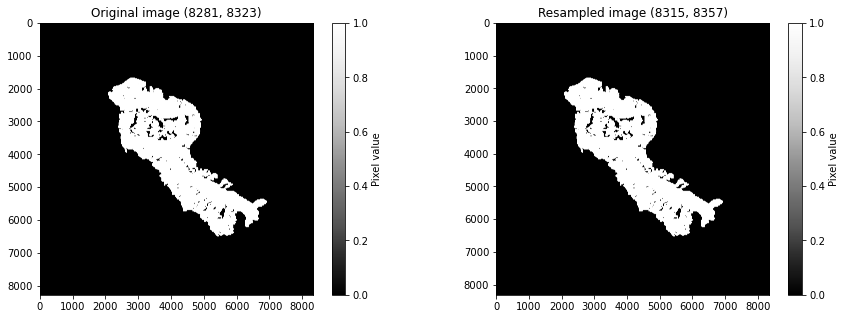

In [82]:
# Read in glacier mask (rasterized) - must be in the same projection as the plane images (UTM)
mask_path = '/Volumes/SGlacier/TG_autorift_inputs/TG_mask_5m.tif'
mask_reader = rio.open(mask_path); glacier_mask = mask_reader.read(1) # load the tile
glacier_mask[glacier_mask == 0] = np.NaN # remove black background, replace with Nans
glacier_mask[glacier_mask>0.0] = 1 ; glacier_mask[np.isnan(glacier_mask)] = 0 # make binary

if reftile.crs != mask_reader.crs: # Check that projections match
    print('ERROR: CRS of mask does not match images.')

# put both on same grid if they aren't already
if mask_reader.transform[0] != reftile.transform[0] or mask_reader.shape != reftile.shape:
    print('Grid of mask does not match images. Resampling.')
    
    # grab grids
    ref_x = np.linspace(reftile.bounds.left, reftile.bounds.right, num=np.shape(reftile)[1])
    ref_y = np.linspace(reftile.bounds.top, reftile.bounds.bottom, num=np.shape(reftile)[0])
    mask_x = np.linspace(mask_reader.bounds.left, mask_reader.bounds.right, num=np.shape(glacier_mask)[1])
    mask_y = np.linspace(mask_reader.bounds.top, mask_reader.bounds.bottom, num=np.shape(glacier_mask)[0])
    mask_resamp = np.zeros((len(ref_y), len(ref_x))) # create an empty resampled img grid

    # Resample to your new DEM bounds
    f = interp2d(mask_x, mask_y, glacier_mask) # create DEM interpolation object
    mask_resamp = f(ref_x,ref_y) # resample the NIR data to the DSM coordinates
    mask_resamp = np.flipud(mask_resamp) # flip up down
    print("Resampled to new dimensions:", mask_resamp.shape)

    # Display the original and resampled images as a visual check
    fig, (ax1,ax2) = plt.subplots(1,2, figsize=(15,5))
    im1 = ax1.imshow(glacier_mask, cmap='Greys_r', vmin=0)
    ax1.set_title('Original image '+str(mask_reader.shape))
    fig.colorbar(im1, ax=ax1,label='Pixel value')
    im2 = ax2.imshow(mask_resamp, cmap='Greys_r', vmin=0)
    ax2.set_title('Resampled image '+str(mask_resamp.shape))
    fig.colorbar(im2, ax=ax2,label='Pixel value')
    plt.show()

TILES FOR 20200904 2278
['/Volumes/SGlacier/Turner20_21/09_20/out/20200904_194836_46_2278_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200904_194838_86_2278_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200904_194841_25_2278_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200904_194843_64_2278_3B_AnalyticMS_SR_clip_5m.tif']


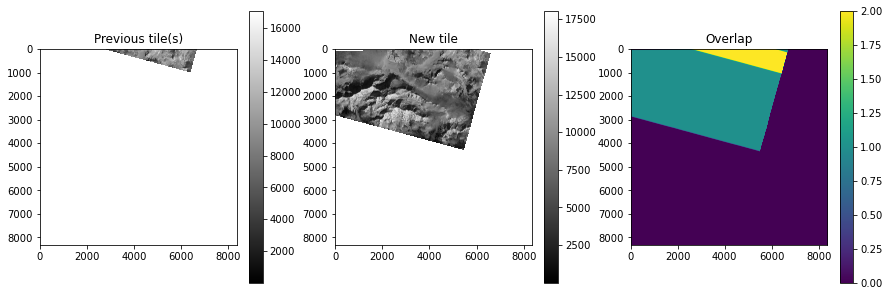

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: 2.0188550655841153
New mean diff: 0.0
Larger tile mean value: 8637.170939203561
Normalized mean value for smaller tile: 6445.579305320499




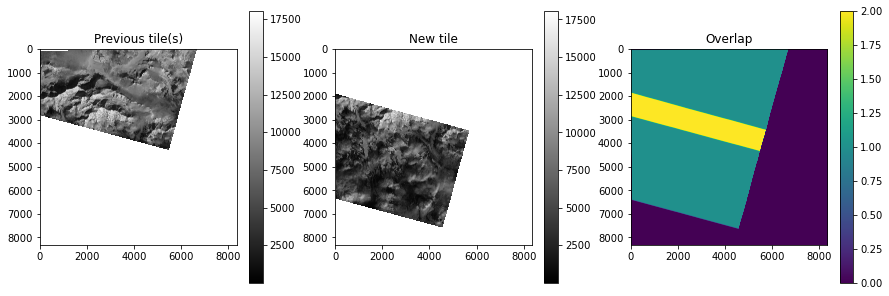

Current tile is larger.
Mean difference in values from the larger tile in overlap area: -5.436495086481327
New mean diff: 0.8543010838052376
Larger tile mean value: 4744.308976679828
Normalized mean value for smaller tile: 5504.390903197648




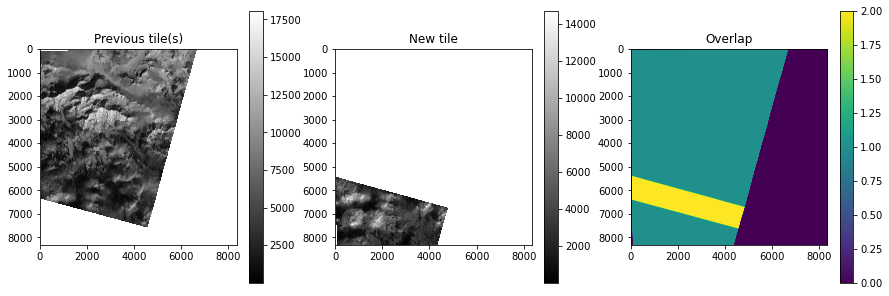

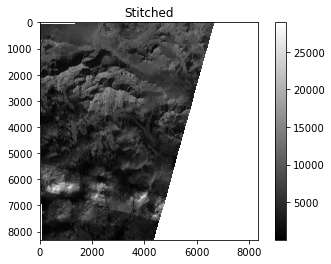

TILES FOR 20200905 1010
['/Volumes/SGlacier/Turner20_21/09_20/out/20200905_201602_1010_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200905_201603_1010_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200905_201604_1010_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200905_201605_1010_3B_AnalyticMS_SR_clip_5m.tif']


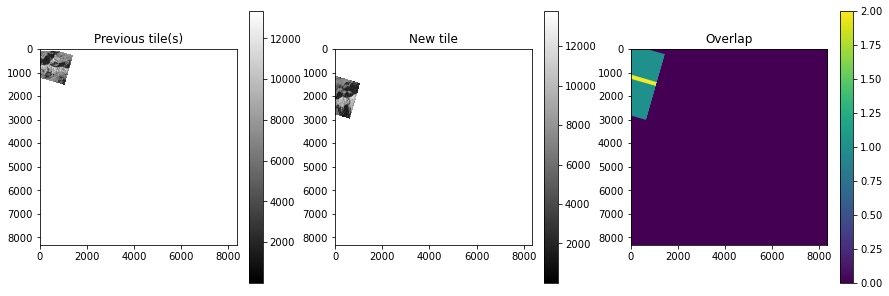

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: 0.45303138029151485
New mean diff: 0.0
Larger tile mean value: 5904.081256651143
Normalized mean value for smaller tile: 4453.771234756627




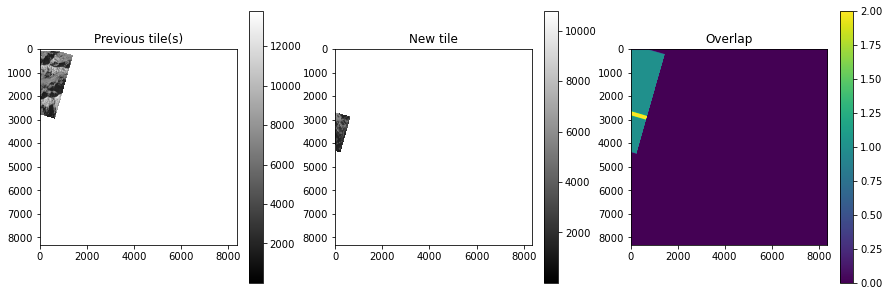

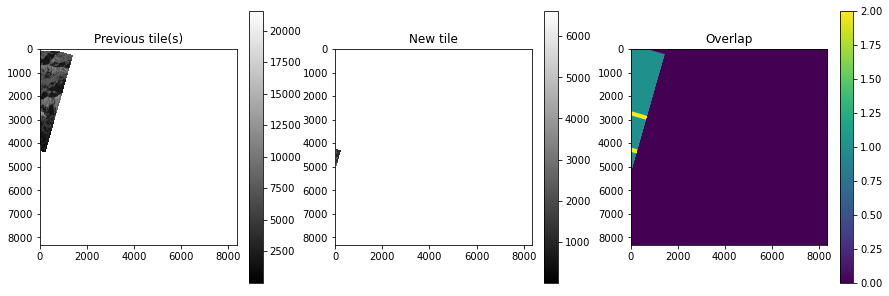

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: -17.317512357012344
New mean diff: 0.0
Larger tile mean value: 5178.516478125695
Normalized mean value for smaller tile: 1044.6889748345436




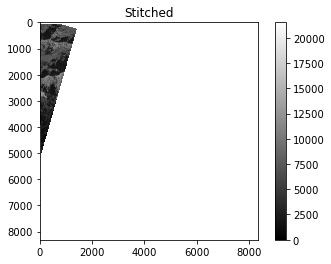

TILES FOR 20200905 106b
['/Volumes/SGlacier/Turner20_21/09_20/out/20200905_191452_27_106b_3B_AnalyticMS_SR_clip_5m.tif']


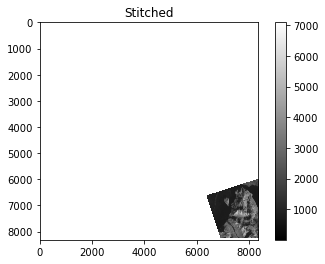

TILES FOR 20200905 2271
['/Volumes/SGlacier/Turner20_21/09_20/out/20200905_195053_63_2271_3B_AnalyticMS_SR_clip_5m.tif']


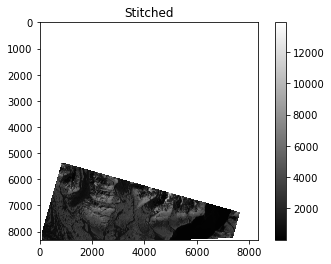

TILES FOR 20200906 0f49
['/Volumes/SGlacier/Turner20_21/09_20/out/20200906_170012_0f49_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200906_170013_0f49_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200906_170014_0f49_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200906_170015_0f49_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200906_170016_0f49_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200906_170017_0f49_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200906_170017_1_0f49_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200906_170018_0f49_3B_AnalyticMS_SR_clip_5m.tif']


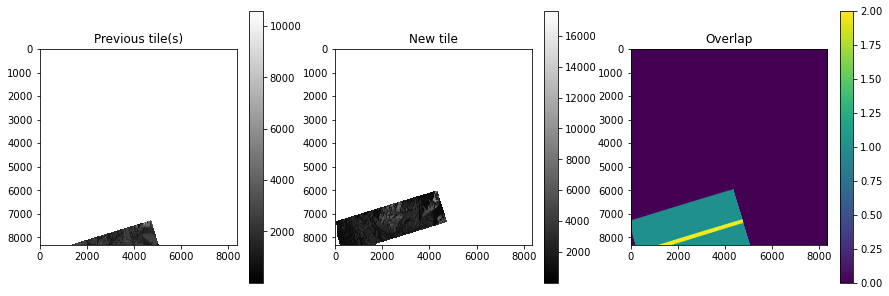

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: -1.2546732811792365
New mean diff: 0.0
Larger tile mean value: 2011.814892166251
Normalized mean value for smaller tile: 2036.328866545217




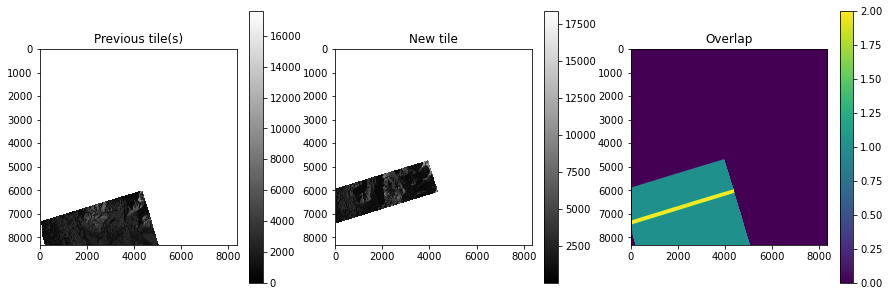

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: -0.24689321728217045
New mean diff: 0.0
Larger tile mean value: 2178.9000828242715
Normalized mean value for smaller tile: 1918.8153207608273




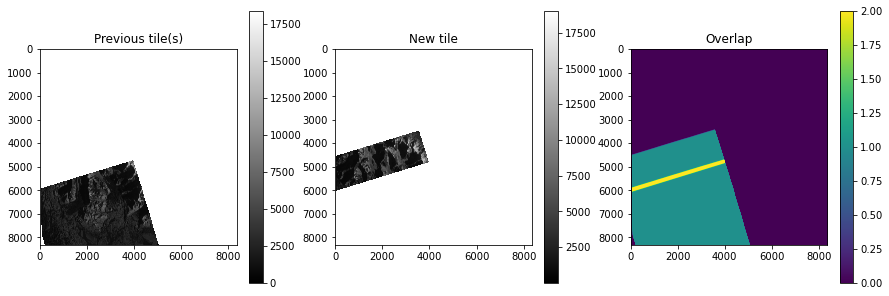

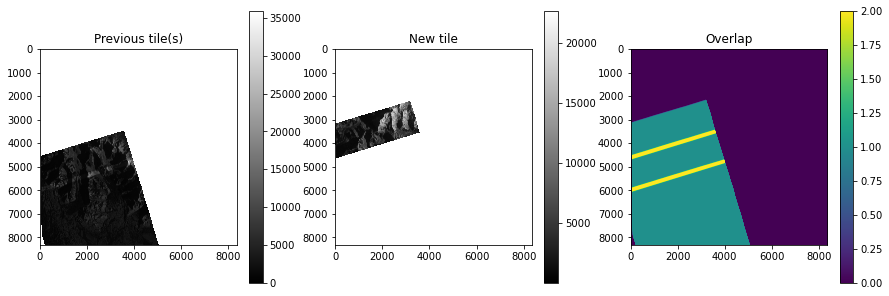

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: -2.492335120387834
New mean diff: -1.0295232695144418
Larger tile mean value: 2548.9996265834843
Normalized mean value for smaller tile: 3855.879220435334




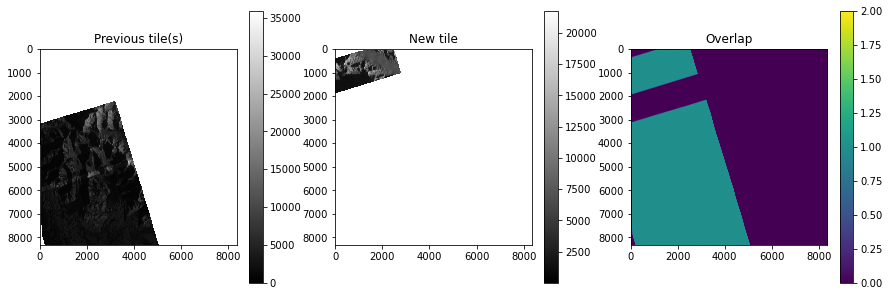

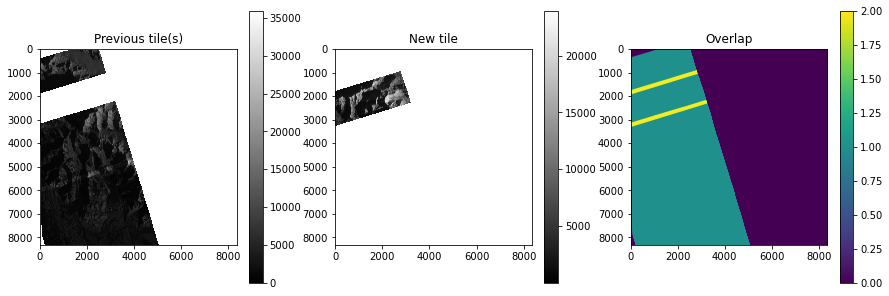

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: -1.2478071915727664
New mean diff: 0.642218377572208
Larger tile mean value: 3217.3164167675714
Normalized mean value for smaller tile: 4245.8552451403675




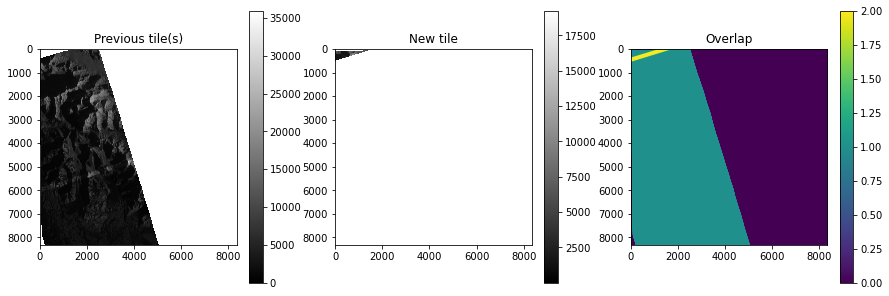

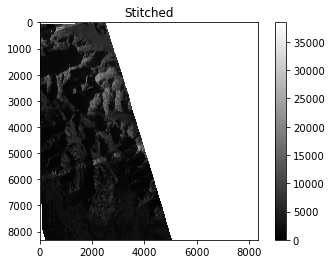

TILES FOR 20200906 100d
['/Volumes/SGlacier/Turner20_21/09_20/out/20200906_170400_100d_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200906_170401_100d_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200906_170402_100d_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200906_170403_100d_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200906_170404_100d_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200906_170405_100d_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200906_170406_100d_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200906_170407_100d_3B_AnalyticMS_SR_clip_5m.tif']


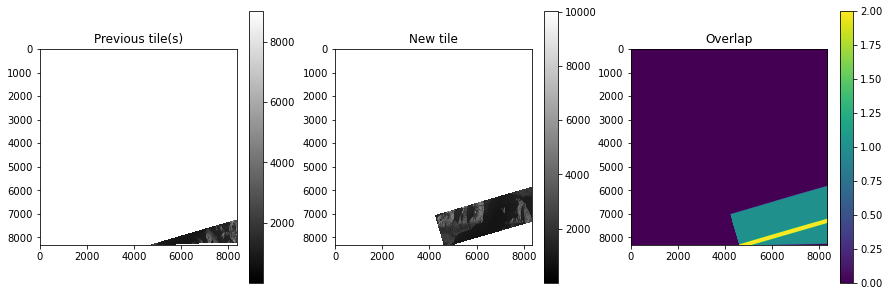

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: -0.4444779428821805
New mean diff: 0.0
Larger tile mean value: 1566.1229169896933
Normalized mean value for smaller tile: 1635.806332979462




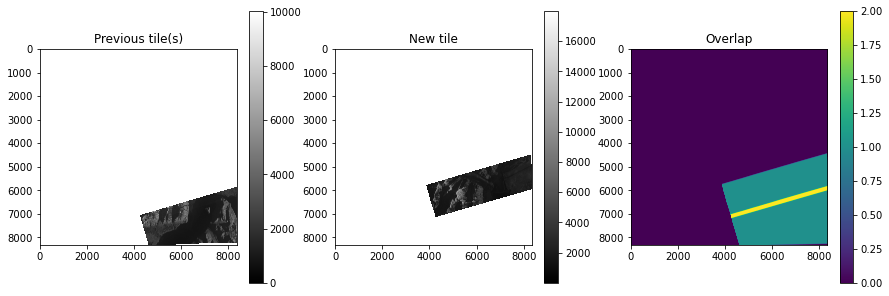

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: 40.24304309997434
New mean diff: 0.0
Larger tile mean value: 1760.211465344487
Normalized mean value for smaller tile: 2203.046582289934




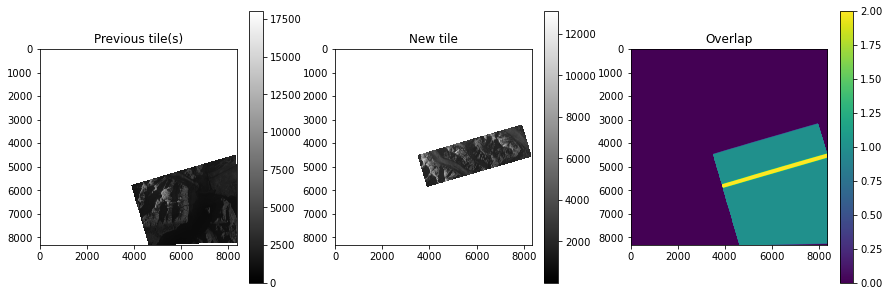

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: 40.50913683186696
New mean diff: 11.960373331604204
Larger tile mean value: 2081.3147143349456
Normalized mean value for smaller tile: 2730.1948092662333




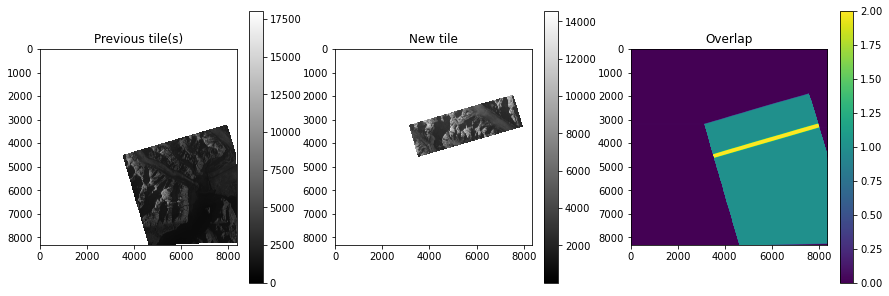

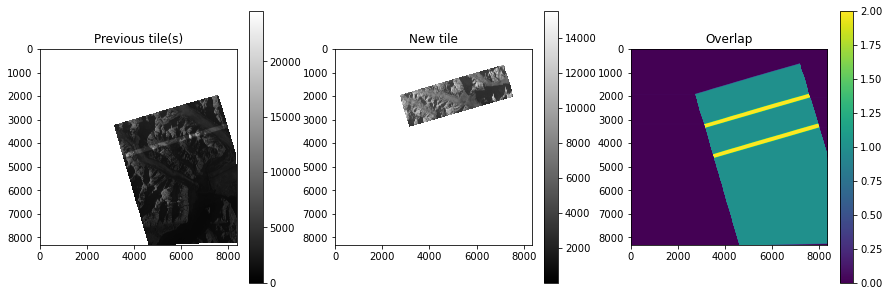

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: 61.9967219479864
New mean diff: 16.02119694595798
Larger tile mean value: 2981.1677039223946
Normalized mean value for smaller tile: 5397.54728649586




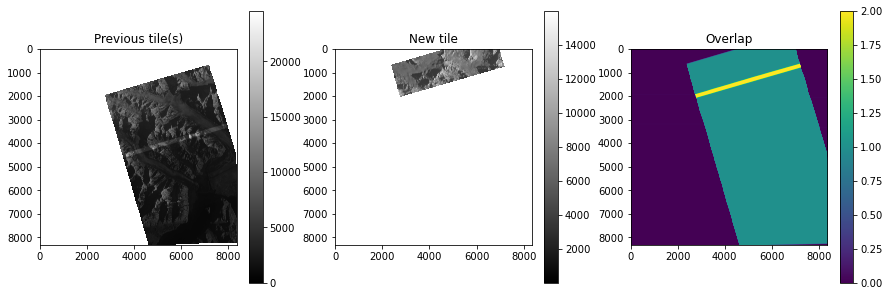

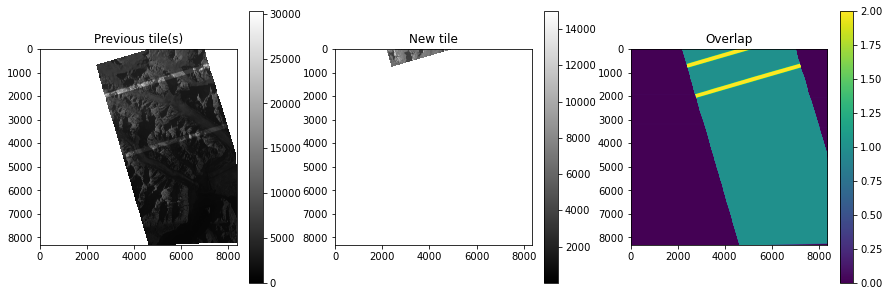

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: 1.5365475968589757
New mean diff: 0.0
Larger tile mean value: 4157.1364434727275
Normalized mean value for smaller tile: 4002.434699758164




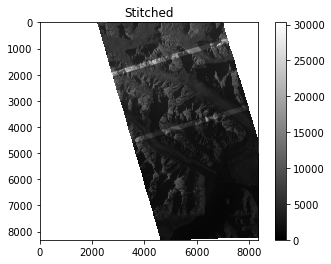

TILES FOR 20200910 1049
['/Volumes/SGlacier/Turner20_21/09_20/out/20200910_165944_1049_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200910_165945_1049_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200910_165946_1049_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200910_165947_1049_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200910_165947_1_1049_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200910_165948_1049_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200910_165949_1049_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200910_165950_1049_3B_AnalyticMS_SR_clip_5m.tif']


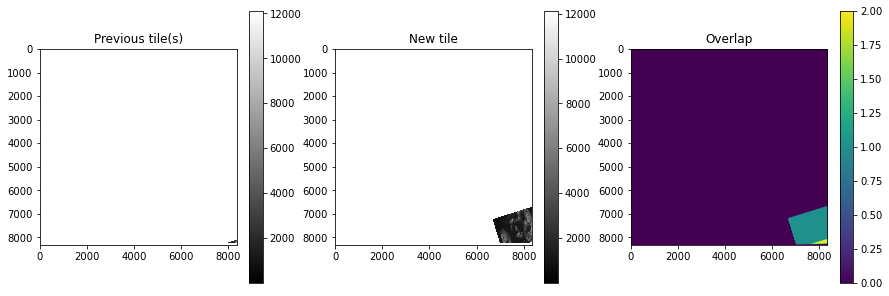

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: -4.129898003265942
New mean diff: 0.0
Larger tile mean value: 2379.3632116265126
Normalized mean value for smaller tile: 2058.4898549841037




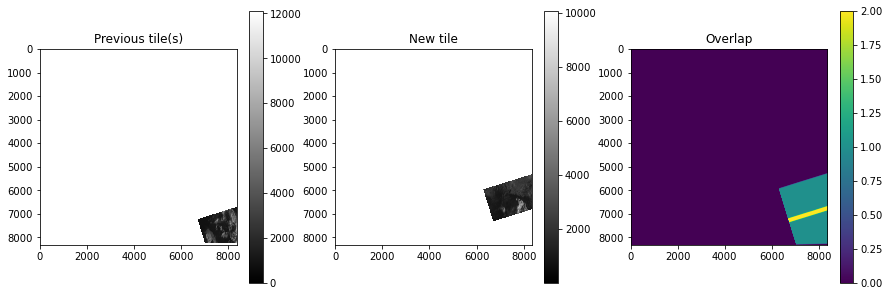

Current tile is larger.
Mean difference in values from the larger tile in overlap area: -10.000802856738563
New mean diff: 0.0
Larger tile mean value: 1703.1215170607547
Normalized mean value for smaller tile: 1875.7125501557048




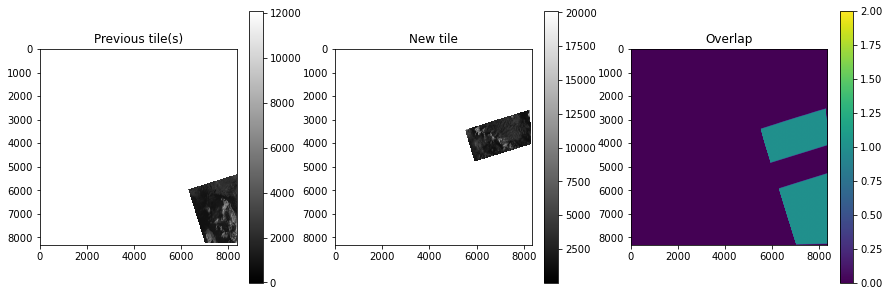

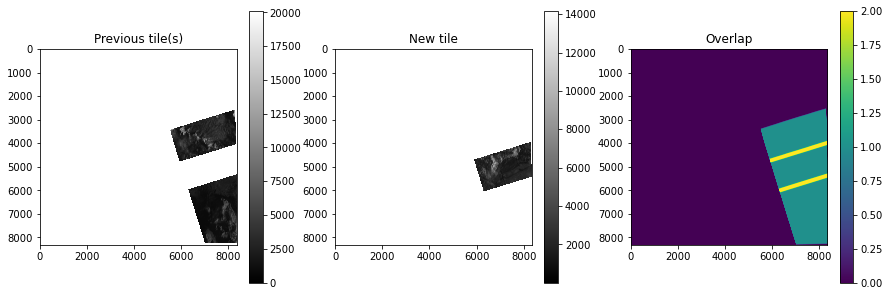

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: -0.558809957032772
New mean diff: -0.24591935144421007
Larger tile mean value: 2459.498906951582
Normalized mean value for smaller tile: 1816.1843176708846




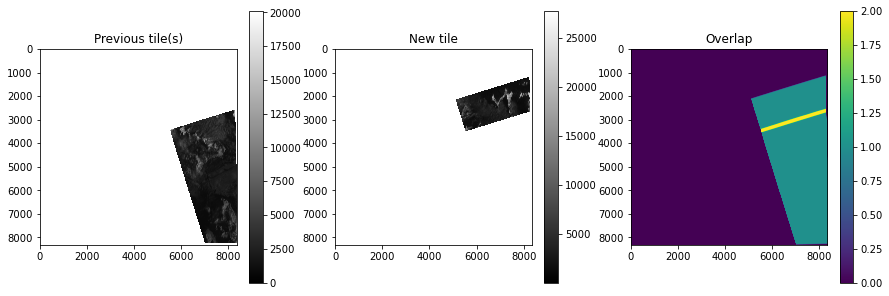

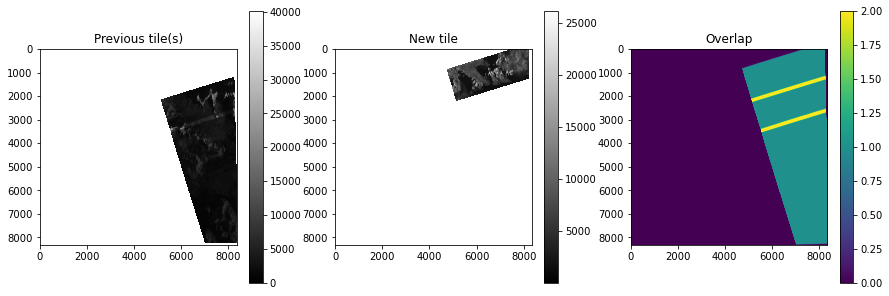

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: 45.468718663637226
New mean diff: 0.0
Larger tile mean value: 2805.6204648674275
Normalized mean value for smaller tile: 5241.160924697866




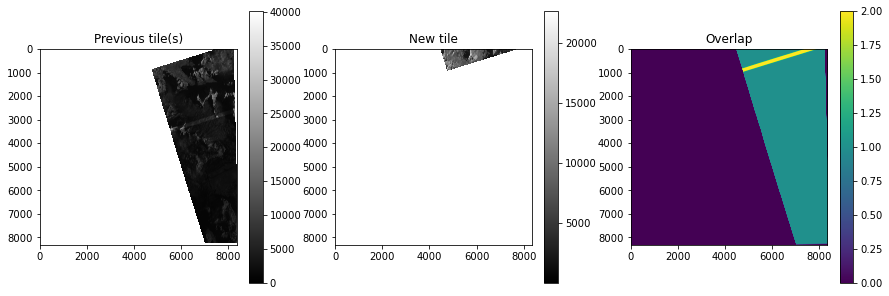

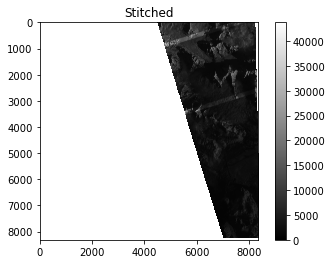

TILES FOR 20200910 106c
['/Volumes/SGlacier/Turner20_21/09_20/out/20200910_191712_87_106c_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200910_191714_88_106c_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200910_191716_89_106c_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200910_191718_91_106c_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200910_191720_92_106c_3B_AnalyticMS_SR_clip_5m.tif']


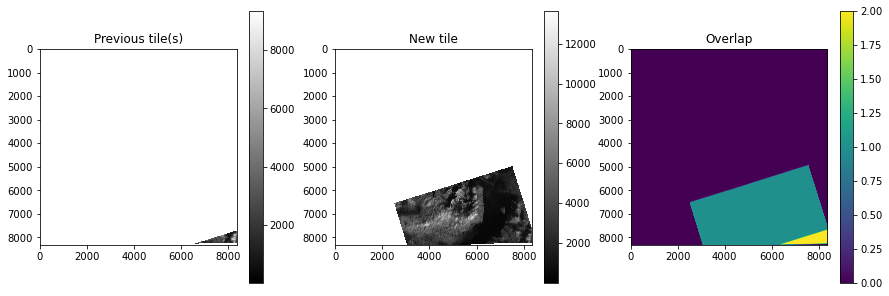

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: -5.598476345207331
New mean diff: 0.0
Larger tile mean value: 2592.214480346987
Normalized mean value for smaller tile: 2681.2186347590623




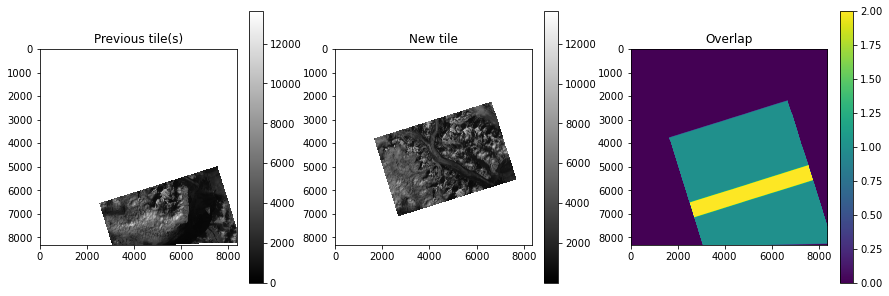

Current tile is larger.
Mean difference in values from the larger tile in overlap area: 18.376329541699633
New mean diff: 3.779749482144748
Larger tile mean value: 3281.627978393376
Normalized mean value for smaller tile: 2129.288833795845




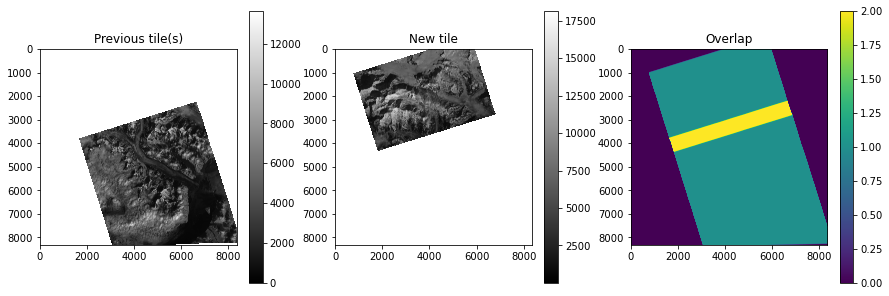

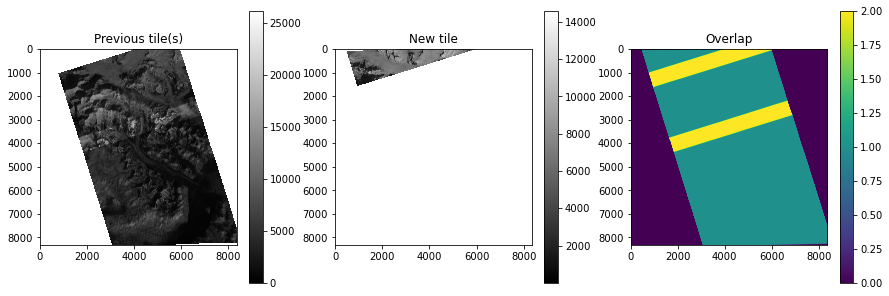

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: -10.363162363488023
New mean diff: 0.0
Larger tile mean value: 4216.919683607786
Normalized mean value for smaller tile: 2167.005346558595




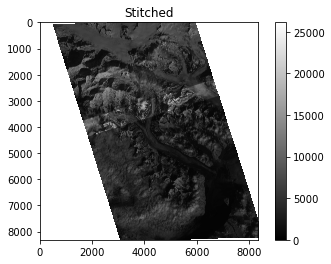

TILES FOR 20200910 2263
['/Volumes/SGlacier/Turner20_21/09_20/out/20200910_195446_65_2263_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200910_195449_02_2263_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200910_195451_40_2263_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200910_195453_78_2263_3B_AnalyticMS_SR_clip_5m.tif']


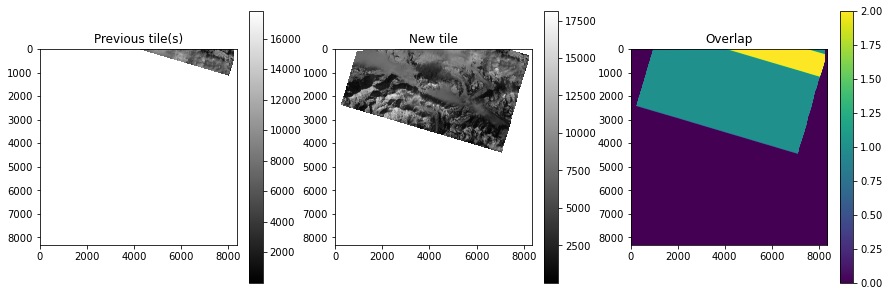

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: 8.938066047945211
New mean diff: 0.0
Larger tile mean value: 7073.0165001323485
Normalized mean value for smaller tile: 4981.736387324419




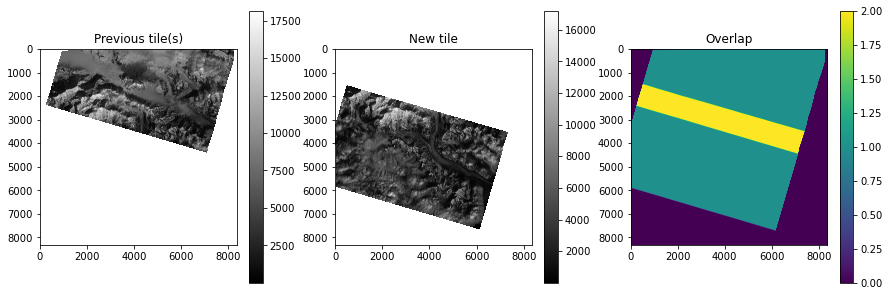

Current tile is larger.
Mean difference in values from the larger tile in overlap area: -33.983080823349866
New mean diff: -8.737923792175918
Larger tile mean value: 3984.5205404688177
Normalized mean value for smaller tile: 4255.817318224403




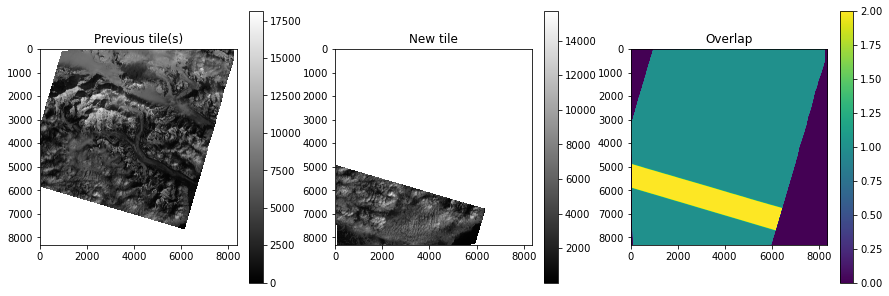

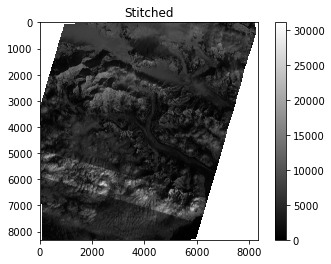

TILES FOR 20200911 100d
['/Volumes/SGlacier/Turner20_21/09_20/out/20200911_165959_1_100d_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200911_170000_100d_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200911_170001_100d_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200911_170002_100d_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200911_170003_100d_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200911_170004_100d_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200911_170005_100d_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200911_170006_100d_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200911_170007_100d_3B_AnalyticMS_SR_clip_5m.tif']


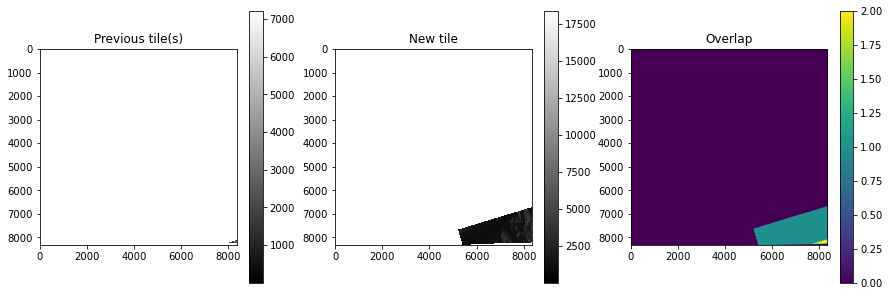

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: -7.981345698225721
New mean diff: 0.0
Larger tile mean value: 2261.3271647867027
Normalized mean value for smaller tile: 1483.7764855701748




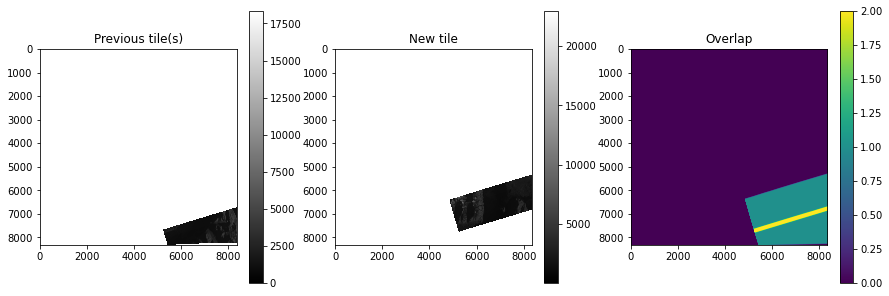

Current tile is larger.
Mean difference in values from the larger tile in overlap area: 8.244642825724817
New mean diff: 0.0
Larger tile mean value: 1987.317469688469
Normalized mean value for smaller tile: 1271.9110811643652




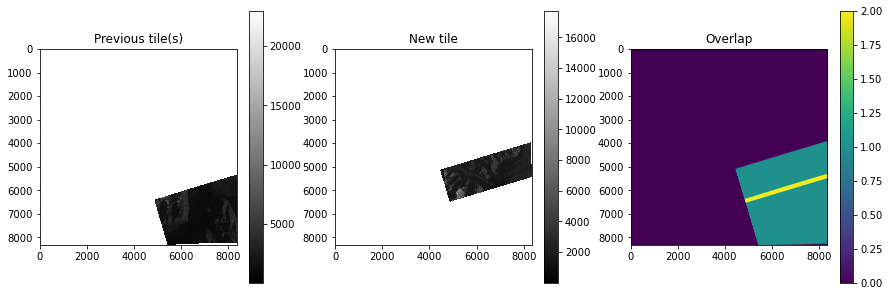

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: -0.3421767655731634
New mean diff: -0.9426930028089258
Larger tile mean value: 1822.7176033304224
Normalized mean value for smaller tile: 2082.669218154053




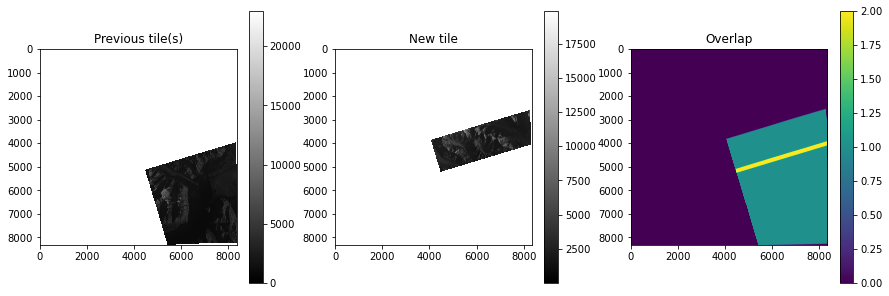

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: -1.6849936653246165
New mean diff: 0.1894346294373333
Larger tile mean value: 2026.8028420920373
Normalized mean value for smaller tile: 2535.3981319873424




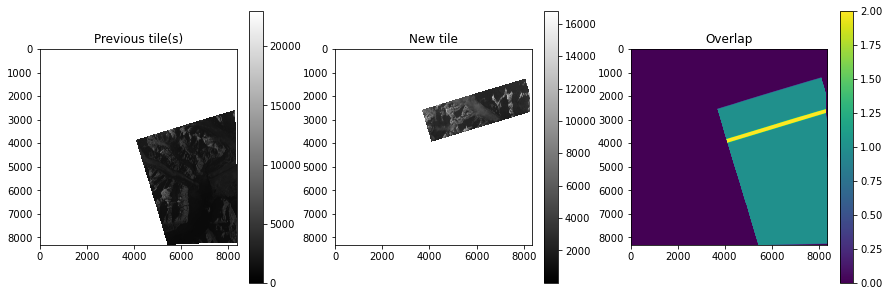

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: 67.82767710755903
New mean diff: 4.884829490928653
Larger tile mean value: 2273.70137206129
Normalized mean value for smaller tile: 3462.6848147451274




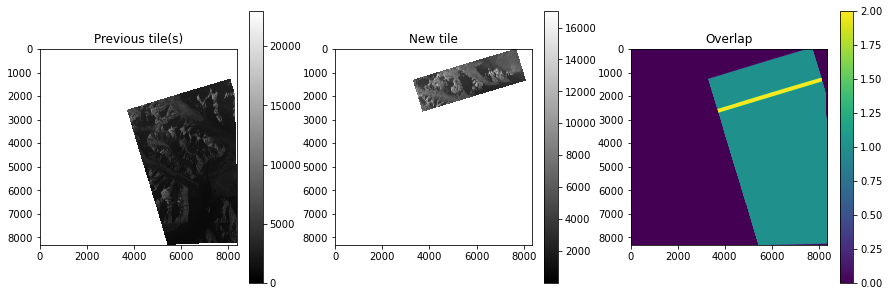

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: 2.3524634089236525
New mean diff: 0.4624742812368605
Larger tile mean value: 2667.740707224949
Normalized mean value for smaller tile: 4951.619669908068




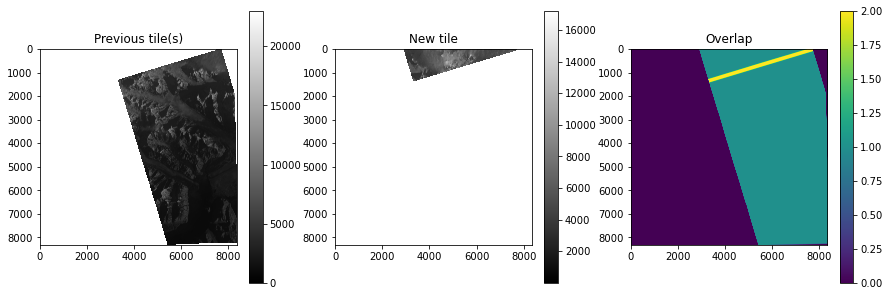

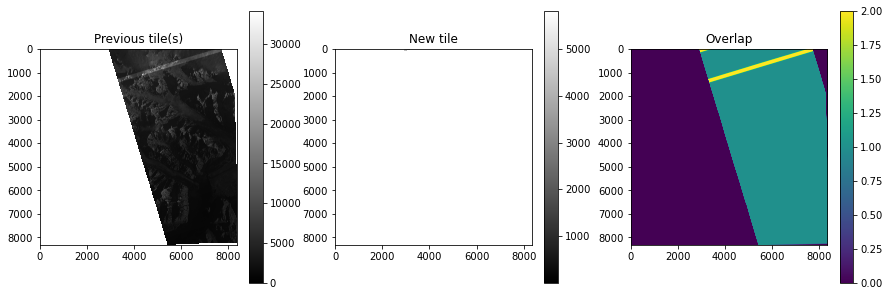

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: 15.655460448483549
New mean diff: 0.0
Larger tile mean value: 3585.733194117362
Normalized mean value for smaller tile: 0.344920083603343




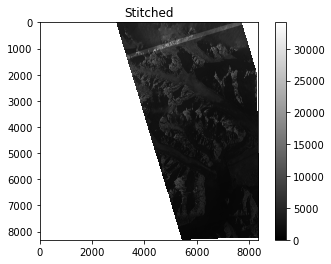

TILES FOR 20200911 2212
['/Volumes/SGlacier/Turner20_21/09_20/out/20200911_194626_56_2212_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200911_194628_78_2212_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200911_194630_99_2212_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200911_194633_20_2212_3B_AnalyticMS_SR_clip_5m.tif']


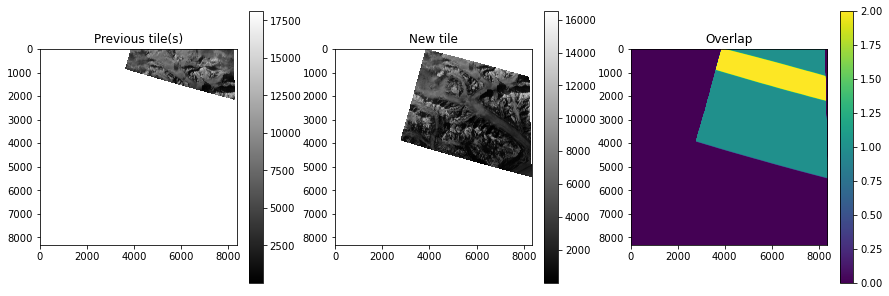

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: 10.243252130860883
New mean diff: 0.0
Larger tile mean value: 5838.416294024702
Normalized mean value for smaller tile: 2479.2248741033495




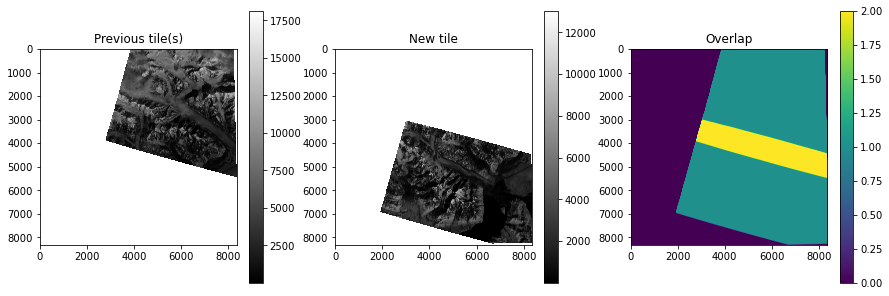

Current tile is larger.
Mean difference in values from the larger tile in overlap area: -8.604320762608028
New mean diff: -2.5323540232446784
Larger tile mean value: 1918.4509432846326
Normalized mean value for smaller tile: 3472.4325306093906




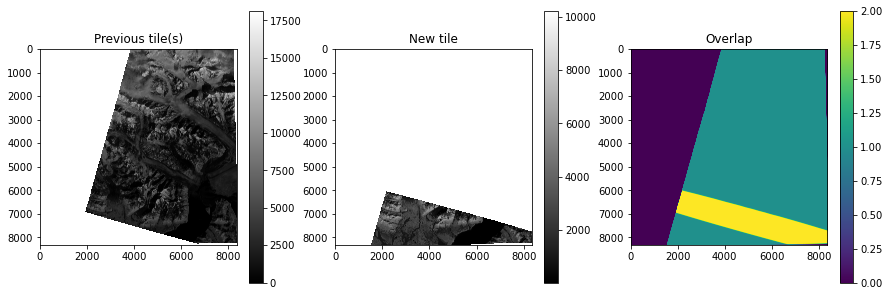

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: -0.06530275625680776
New mean diff: 0.0
Larger tile mean value: 3036.774605773233
Normalized mean value for smaller tile: 674.7656363629217




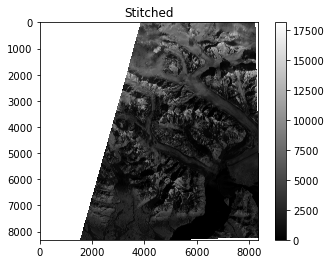

TILES FOR 20200912 0f46
['/Volumes/SGlacier/Turner20_21/09_20/out/20200912_165911_0f46_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200912_165912_0f46_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200912_165913_0f46_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200912_165914_0f46_3B_AnalyticMS_SR_clip_5m.tif']


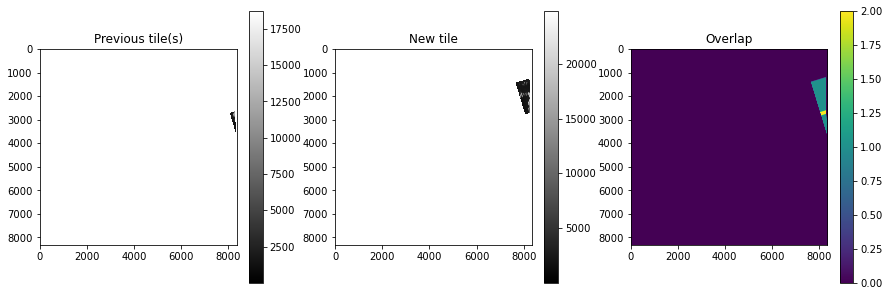

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: 11.609267475622854
New mean diff: 0.0
Larger tile mean value: 3211.864867070175
Normalized mean value for smaller tile: 3531.4251863098825




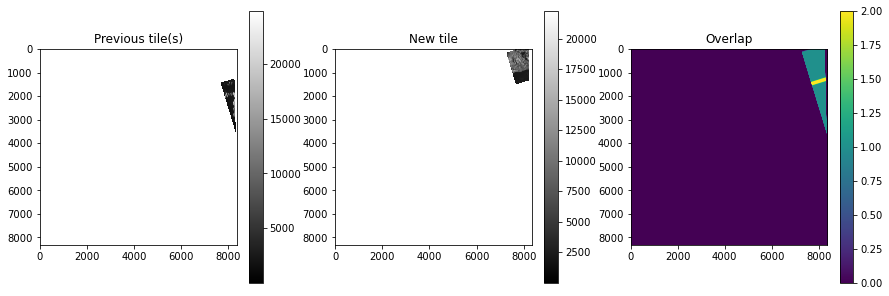

Current tile is larger.
Mean difference in values from the larger tile in overlap area: -13.668571839752932
New mean diff: 0.0
Larger tile mean value: 6696.773712694035
Normalized mean value for smaller tile: 3312.5893666936176




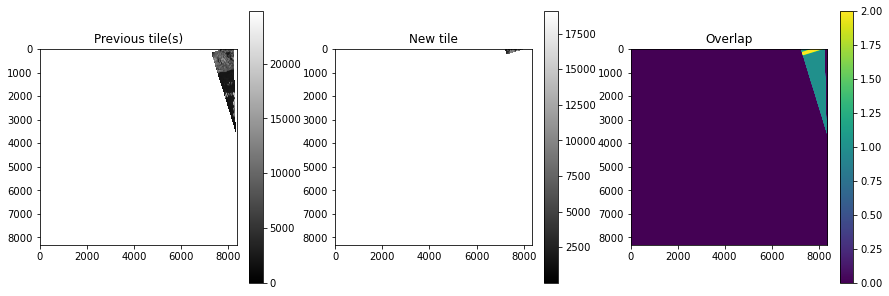

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: 19.99481061342767
New mean diff: 0.0
Larger tile mean value: 5658.39917278318
Normalized mean value for smaller tile: 887.3387207425695




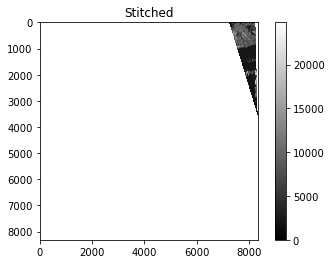

TILES FOR 20200912 1008
['/Volumes/SGlacier/Turner20_21/09_20/out/20200912_201633_1008_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200912_201634_1008_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200912_201635_1008_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200912_201636_1008_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200912_201638_1008_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200912_201639_1008_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200912_201640_1008_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200912_201641_1008_3B_AnalyticMS_SR_clip_5m.tif']


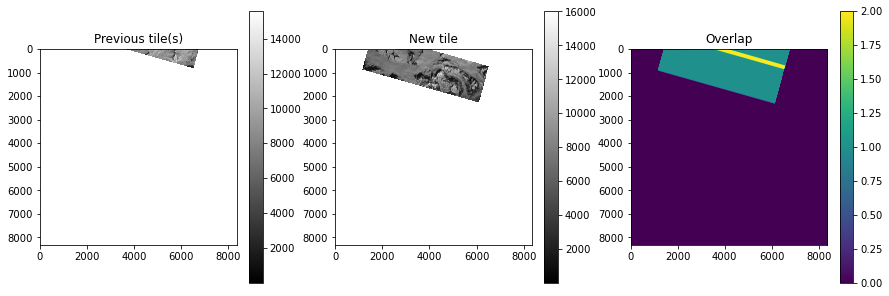

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: 1.8306417693447912
New mean diff: 0.0
Larger tile mean value: 8474.265541535196
Normalized mean value for smaller tile: 6078.373770124391




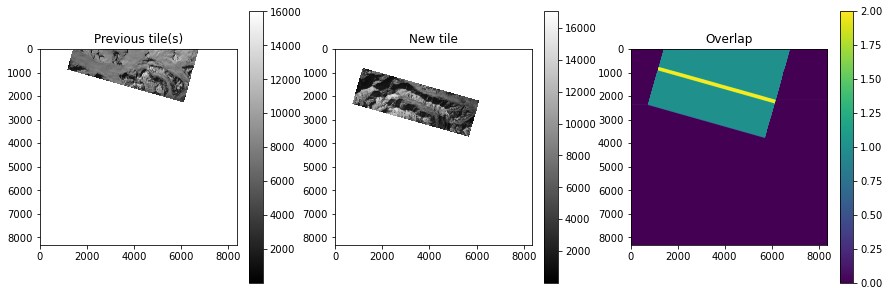

Current tile is larger.
Mean difference in values from the larger tile in overlap area: -2.4519815345282083
New mean diff: 0.0
Larger tile mean value: 5353.089157784061
Normalized mean value for smaller tile: 6294.02205429592




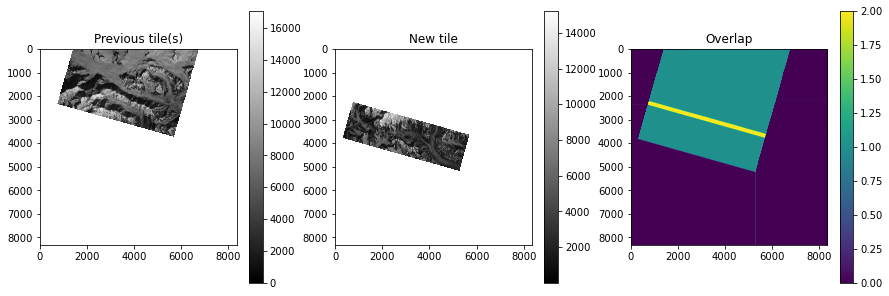

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: 4.661883983589914
New mean diff: 1.4264125393552094
Larger tile mean value: 6119.120478235896
Normalized mean value for smaller tile: 3389.7147458384575




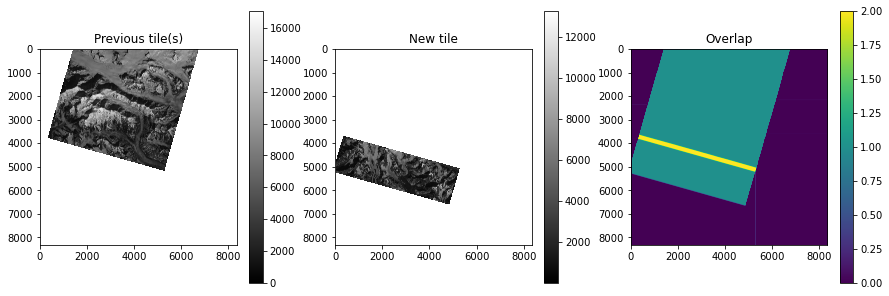

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: 1.2050915360548038
New mean diff: 0.9943875941952582
Larger tile mean value: 5369.237075816196
Normalized mean value for smaller tile: 2489.4791319607666




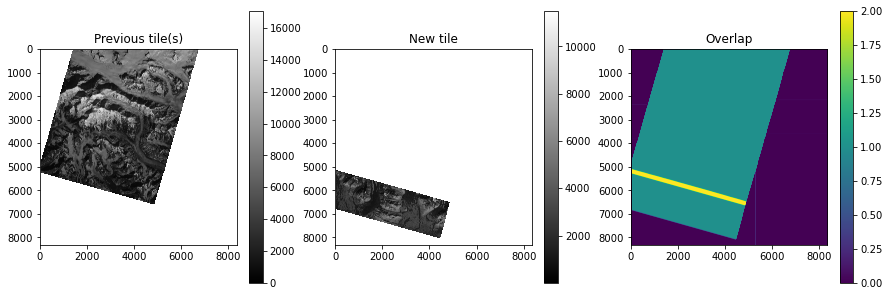

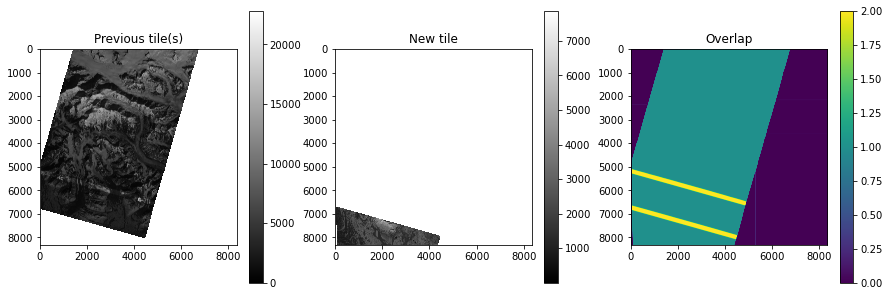

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: 0.9162263799007057
New mean diff: 0.0
Larger tile mean value: 4399.296699526767
Normalized mean value for smaller tile: 1532.3337829651423




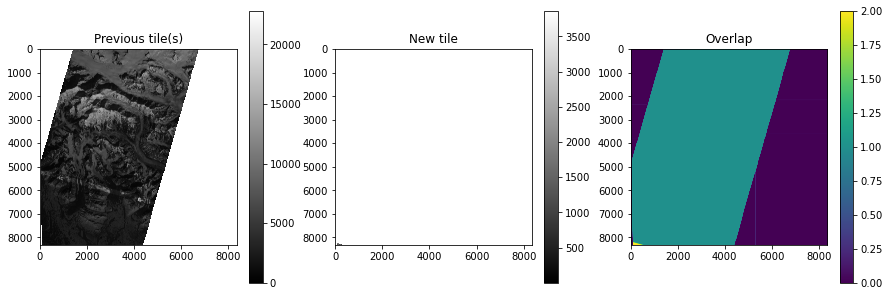

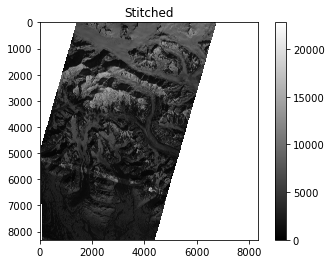

TILES FOR 20200912 1065
['/Volumes/SGlacier/Turner20_21/09_20/out/20200912_192128_64_1065_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200912_192130_69_1065_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200912_192132_74_1065_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200912_192134_80_1065_3B_AnalyticMS_SR_clip_5m.tif']


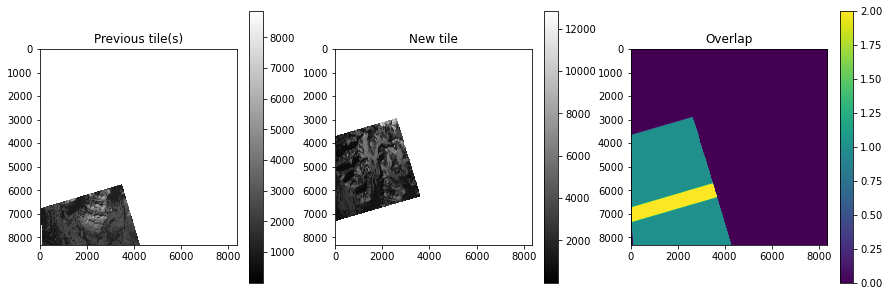

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: -5.769003846163453
New mean diff: 0.0
Larger tile mean value: 2088.669162888939
Normalized mean value for smaller tile: 2186.591442962875




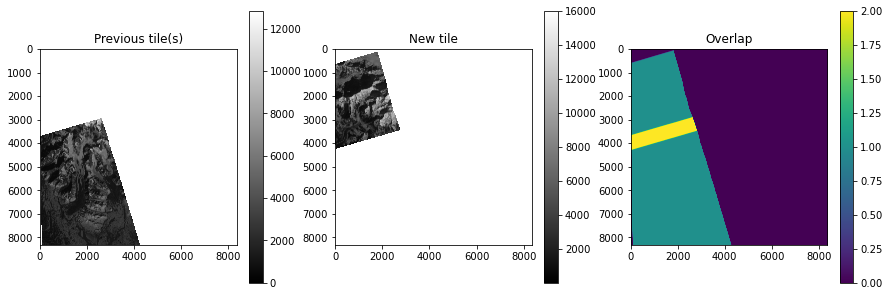

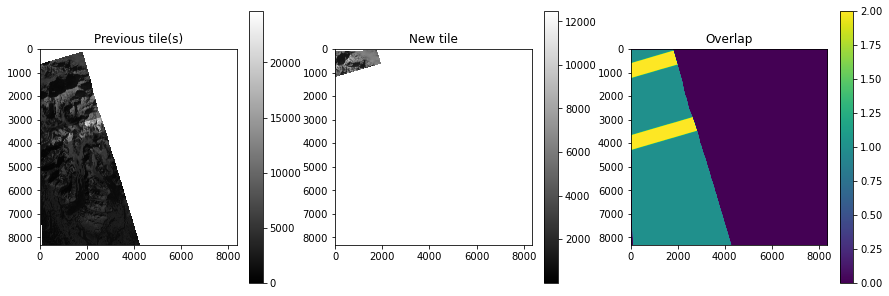

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: -18.216006439092276
New mean diff: 0.0
Larger tile mean value: 3120.047109917161
Normalized mean value for smaller tile: 1215.5871188521526




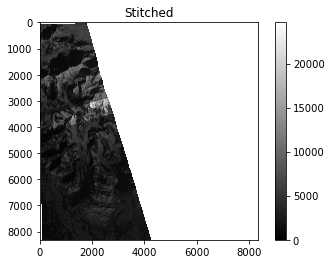

TILES FOR 20200912 2206
['/Volumes/SGlacier/Turner20_21/09_20/out/20200912_194934_20_2206_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200912_194936_41_2206_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200912_194938_62_2206_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200912_194940_83_2206_3B_AnalyticMS_SR_clip_5m.tif']


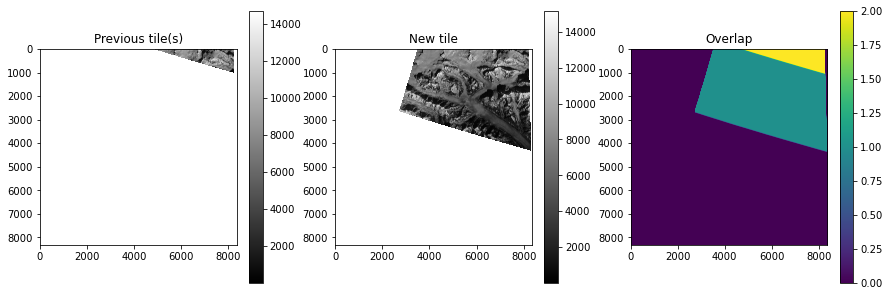

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: 7.557900828463778
New mean diff: 0.0
Larger tile mean value: 6793.244697784378
Normalized mean value for smaller tile: 4212.920157626735




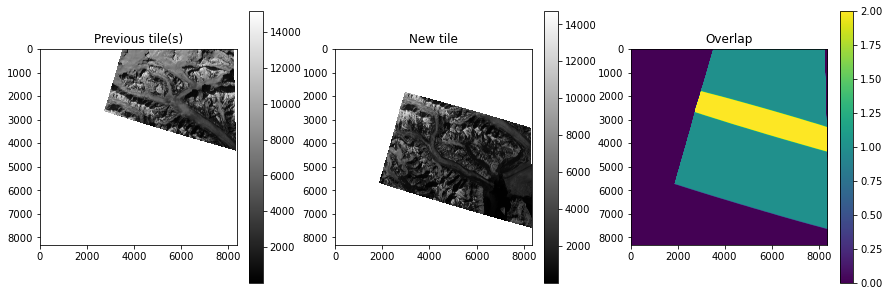

Current tile is larger.
Mean difference in values from the larger tile in overlap area: -14.011661572146757
New mean diff: -3.955026162180962
Larger tile mean value: 2598.1149320922555
Normalized mean value for smaller tile: 3776.2171956333495




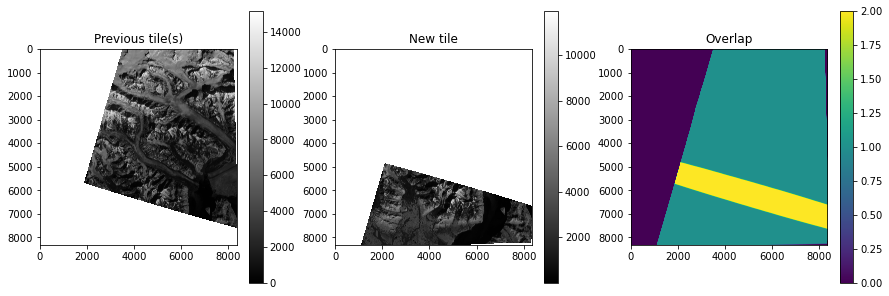

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: -1.208999271647751
New mean diff: 0.12571311301832513
Larger tile mean value: 3556.4887739563096
Normalized mean value for smaller tile: 1296.0864612097407




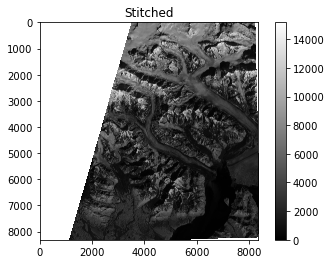

TILES FOR 20200913 0f22
['/Volumes/SGlacier/Turner20_21/09_20/out/20200913_201216_0f22_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200913_201217_0f22_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200913_201218_0f22_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200913_201220_0f22_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200913_201221_0f22_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200913_201222_0f22_3B_AnalyticMS_SR_clip_5m.tif']


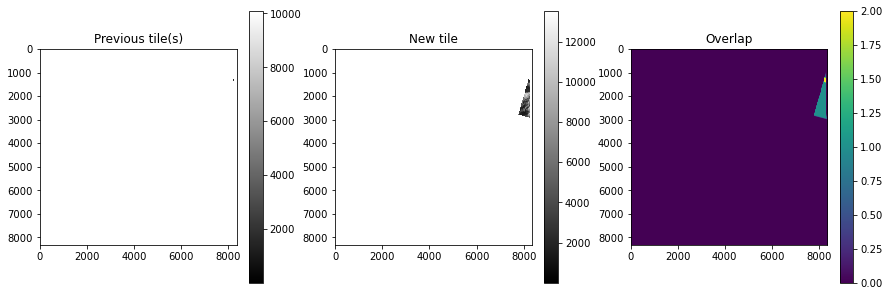

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: -1.0839874122674706
New mean diff: 0.0
Larger tile mean value: 2091.018589720094
Normalized mean value for smaller tile: 4526.327771346792




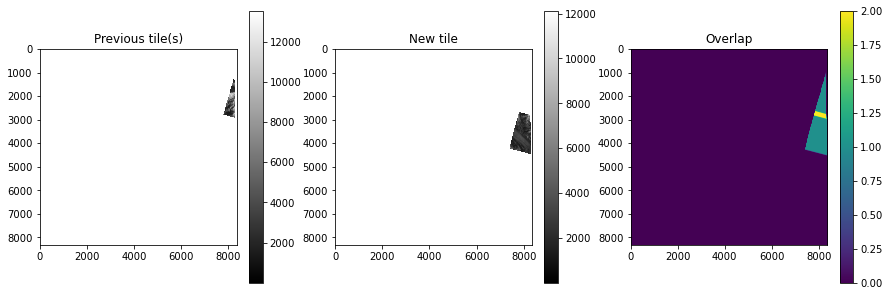

Current tile is larger.
Mean difference in values from the larger tile in overlap area: 0.8322461908704696
New mean diff: 0.0
Larger tile mean value: 2697.0738228648456
Normalized mean value for smaller tile: 3824.3685114649606




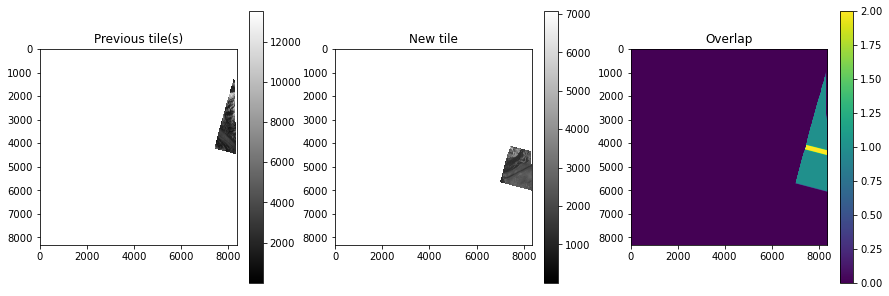

Current tile is larger.
Mean difference in values from the larger tile in overlap area: 1.3467715473826778
New mean diff: 0.0
Larger tile mean value: 2187.459565770599
Normalized mean value for smaller tile: 2903.1216903376635




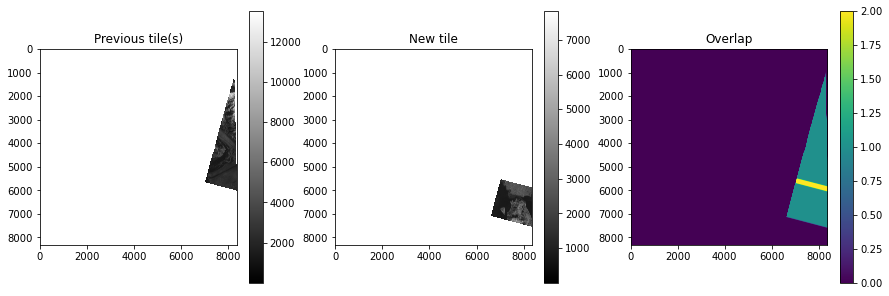

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: -34.23139678752371
New mean diff: 0.0
Larger tile mean value: 2655.554486450321
Normalized mean value for smaller tile: 1434.5500549522812




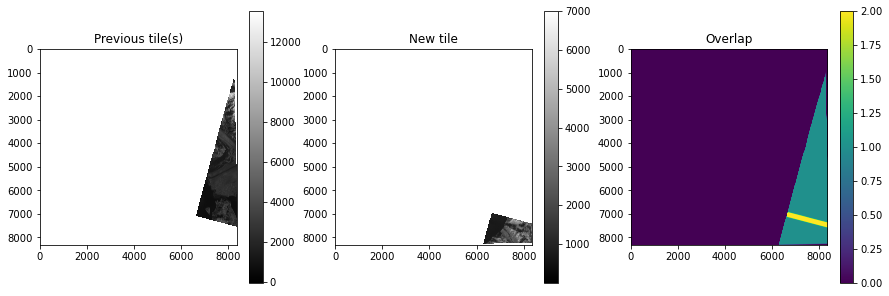

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: -34.85176901235958
New mean diff: 0.0
Larger tile mean value: 2229.8975558730267
Normalized mean value for smaller tile: 1417.5886231300865




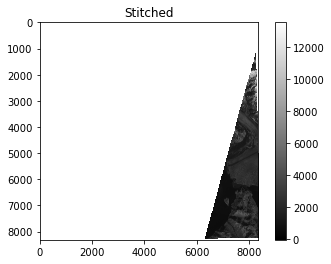

TILES FOR 20200913 1050
['/Volumes/SGlacier/Turner20_21/09_20/out/20200913_165920_1050_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200913_165921_1050_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200913_165922_1050_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200913_165923_1050_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200913_165924_1050_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200913_165925_1050_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200913_165926_1050_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200913_165927_1050_3B_AnalyticMS_SR_clip_5m.tif']


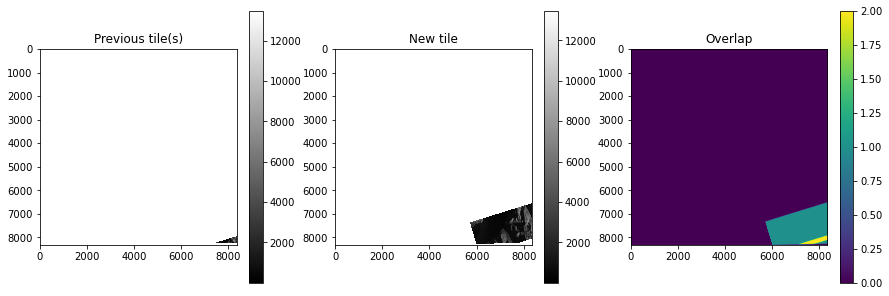

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: -1.9364182787006632
New mean diff: 0.0
Larger tile mean value: 2021.36689666311
Normalized mean value for smaller tile: 1405.629071332833




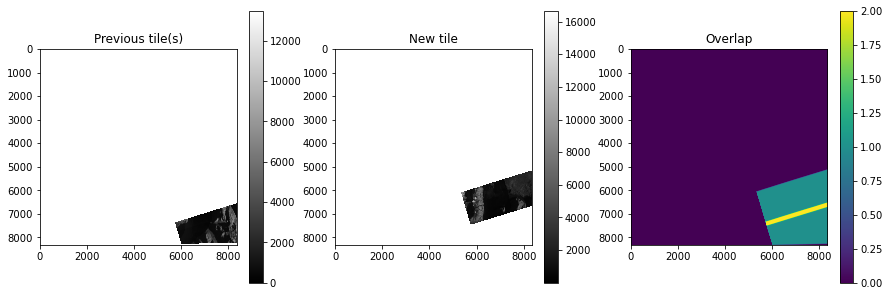

Current tile is larger.
Mean difference in values from the larger tile in overlap area: 3.846475140679603
New mean diff: 0.0
Larger tile mean value: 1931.1637254239952
Normalized mean value for smaller tile: 1268.113771220552




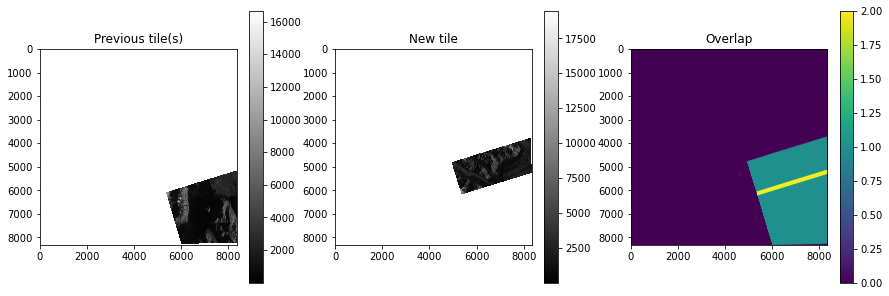

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: 0.15232026041127714
New mean diff: -1.5082074909370737
Larger tile mean value: 1754.5224684128073
Normalized mean value for smaller tile: 1996.3035044568765




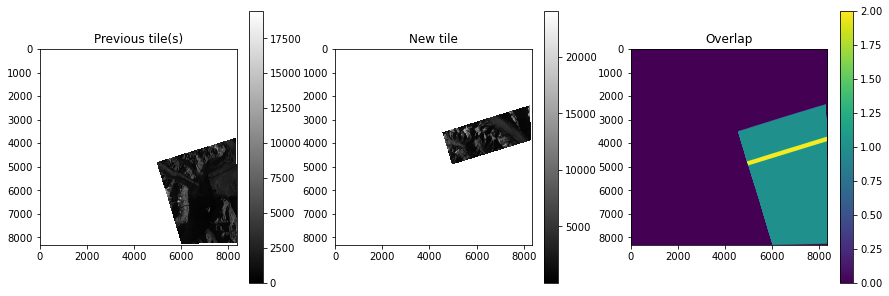

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: 50.64756018576385
New mean diff: 3.3432563024199737
Larger tile mean value: 1939.8093076082528
Normalized mean value for smaller tile: 2636.98305110601




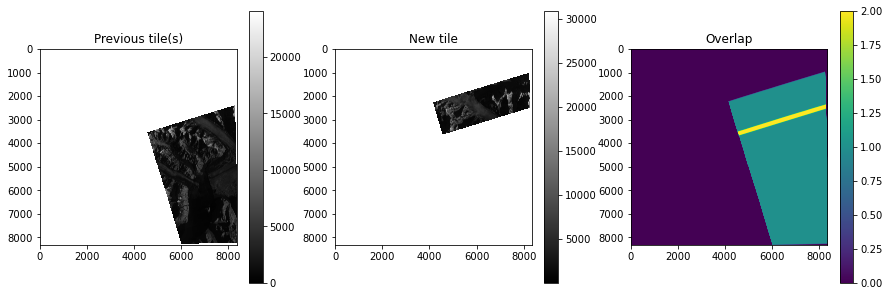

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: 4.989230213939939
New mean diff: 0.4642618677388571
Larger tile mean value: 2247.152214428176
Normalized mean value for smaller tile: 3154.954653115752




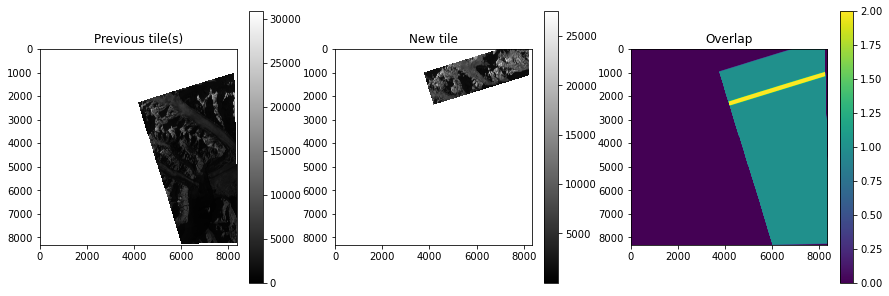

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: -5.399626612739546
New mean diff: -0.30455702221646896
Larger tile mean value: 2572.1442309323284
Normalized mean value for smaller tile: 5709.9934886022265




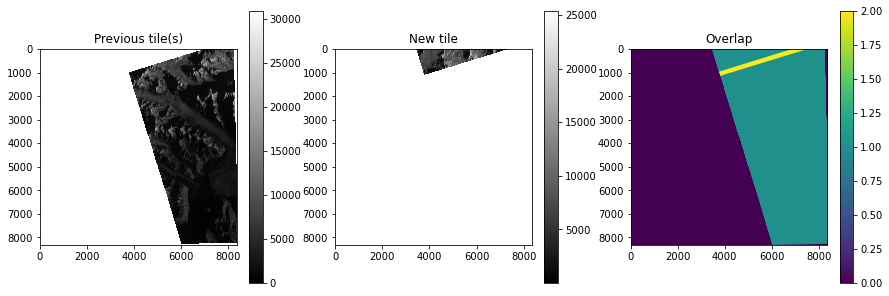

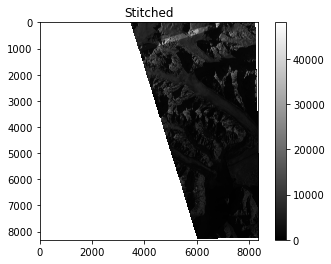

TILES FOR 20200913 1058
['/Volumes/SGlacier/Turner20_21/09_20/out/20200913_204609_21_1058_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200913_204610_72_1058_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200913_204612_23_1058_3B_AnalyticMS_SR_clip_5m.tif']


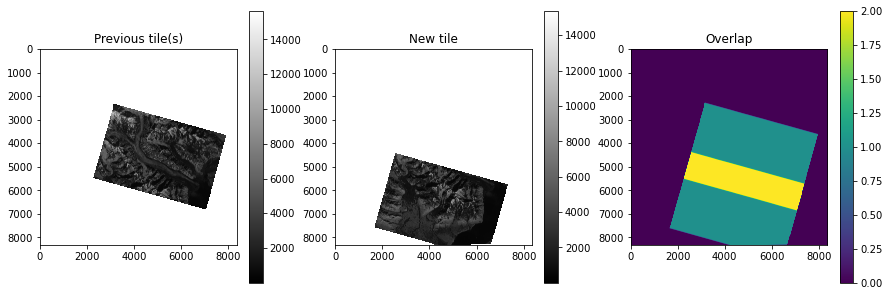

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: 2.1044742292378493
New mean diff: 2.2374297235786242
Larger tile mean value: 2603.7365805545387
Normalized mean value for smaller tile: 1399.1579982333662




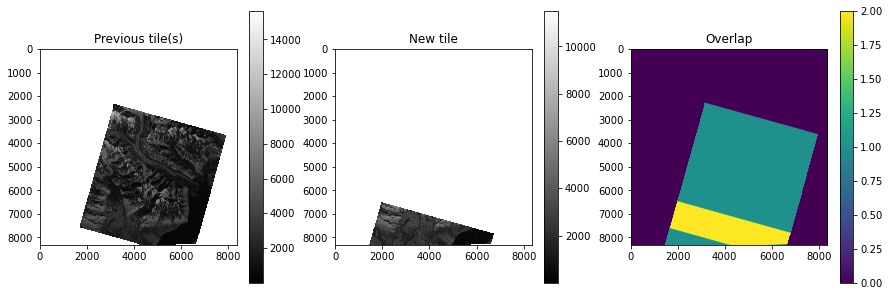

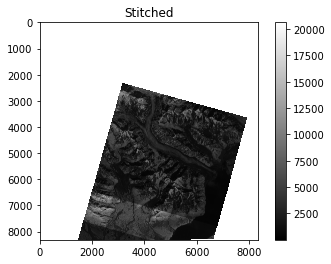

TILES FOR 20200913 2304
['/Volumes/SGlacier/Turner20_21/09_20/out/20200913_195502_84_2304_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200913_195505_24_2304_3B_AnalyticMS_SR_clip_5m.tif']


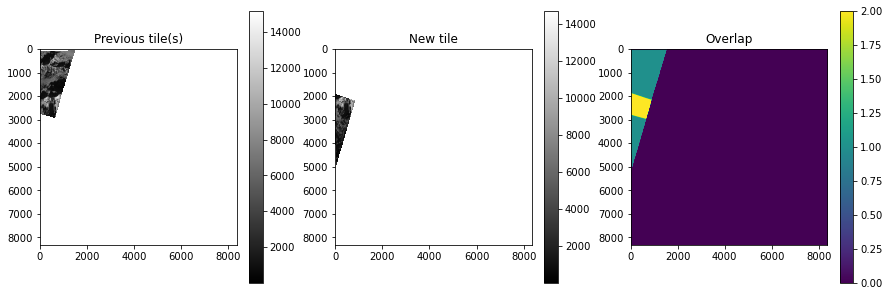

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: 5.858374820711503
New mean diff: 0.0
Larger tile mean value: 4035.8170967859596
Normalized mean value for smaller tile: 1165.4227618757852




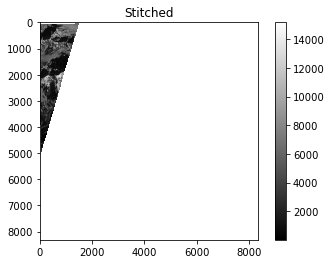

TILES FOR 20200914 0f3c
['/Volumes/SGlacier/Turner20_21/09_20/out/20200914_165742_0f3c_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200914_165743_0f3c_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200914_165744_0f3c_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200914_165745_0f3c_3B_AnalyticMS_SR_clip_5m.tif']


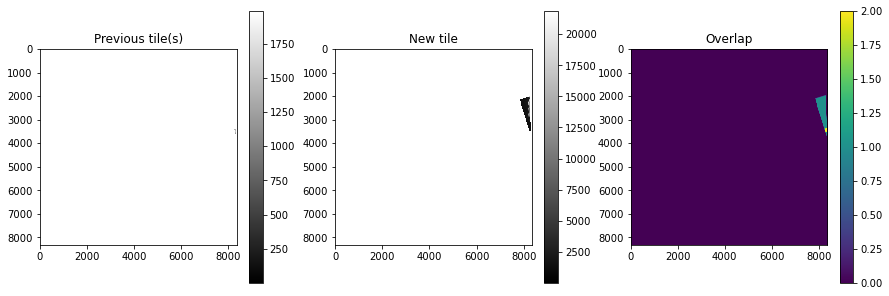

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: -8.228377697131789
New mean diff: 0.0
Larger tile mean value: 1311.4948675272444
Normalized mean value for smaller tile: 3208.8755838420816




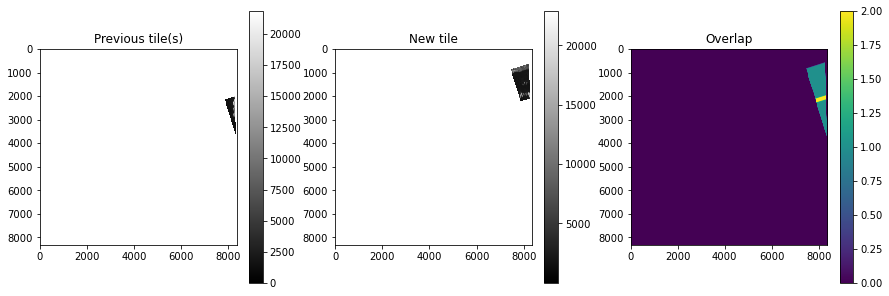

Current tile is larger.
Mean difference in values from the larger tile in overlap area: 11.27133008018158
New mean diff: 0.0
Larger tile mean value: 3703.873875028113
Normalized mean value for smaller tile: 2704.2584905711187




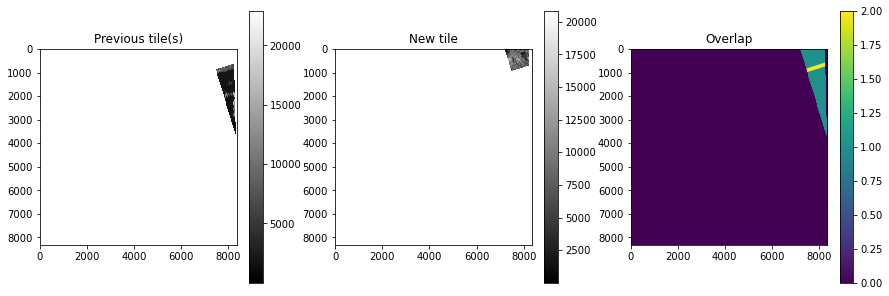

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: -0.7002443544077069
New mean diff: 0.0
Larger tile mean value: 3604.6327003314536
Normalized mean value for smaller tile: 6770.568811614737




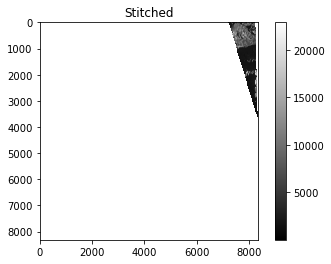

TILES FOR 20200914 1005
['/Volumes/SGlacier/Turner20_21/09_20/out/20200914_200847_1005_3B_AnalyticMS_SR_clip_5m.tif']


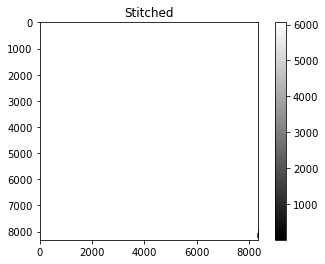

TILES FOR 20200914 1025
['/Volumes/SGlacier/Turner20_21/09_20/out/20200914_201028_1025_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200914_201029_1025_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200914_201030_1025_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200914_201031_1025_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200914_201032_1025_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200914_201033_1025_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200914_201034_1025_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200914_201035_1025_3B_AnalyticMS_SR_clip_5m.tif']


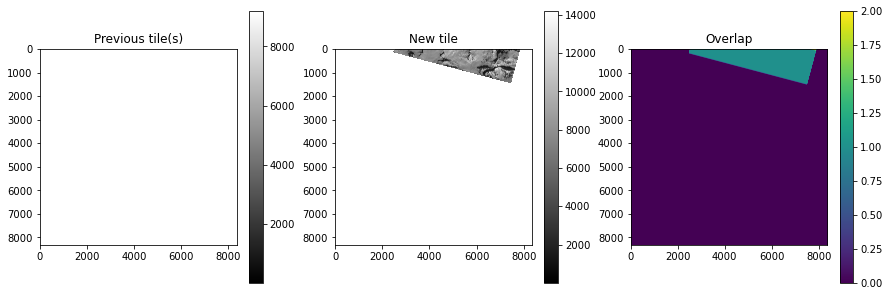

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: -26.54687723425528
New mean diff: 0.0
Larger tile mean value: 4764.504317940888
Normalized mean value for smaller tile: 6931.208988698216




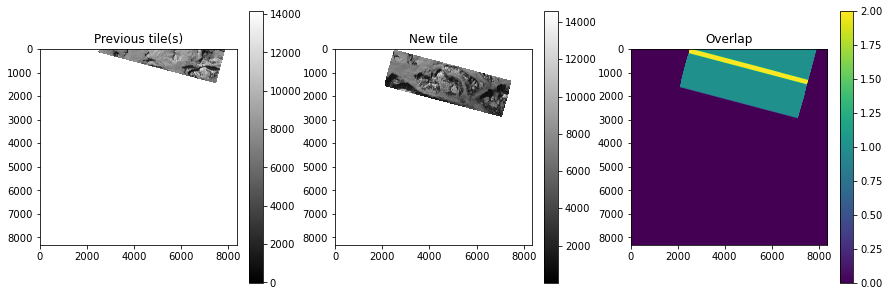

Current tile is larger.
Mean difference in values from the larger tile in overlap area: 25.68025091266274
New mean diff: 0.0
Larger tile mean value: 5249.096993348766
Normalized mean value for smaller tile: 5392.0598358497155




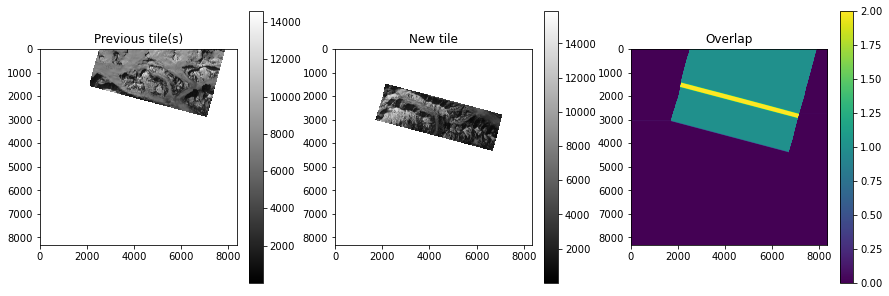

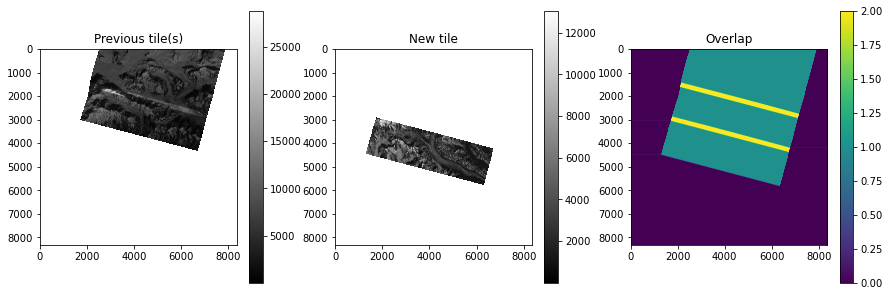

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: 1.3090269127504335
New mean diff: 0.7342721553311676
Larger tile mean value: 5428.617261084187
Normalized mean value for smaller tile: 2714.9867538987596




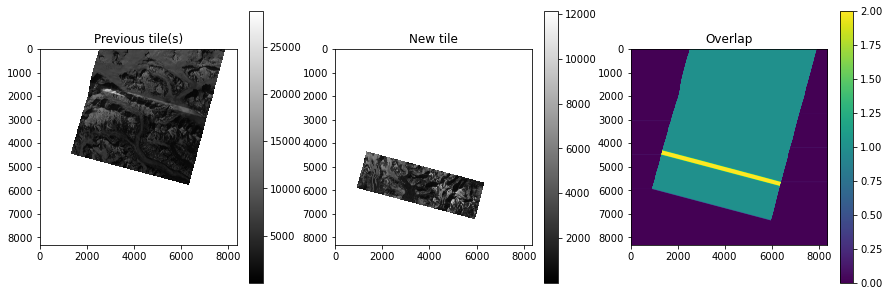

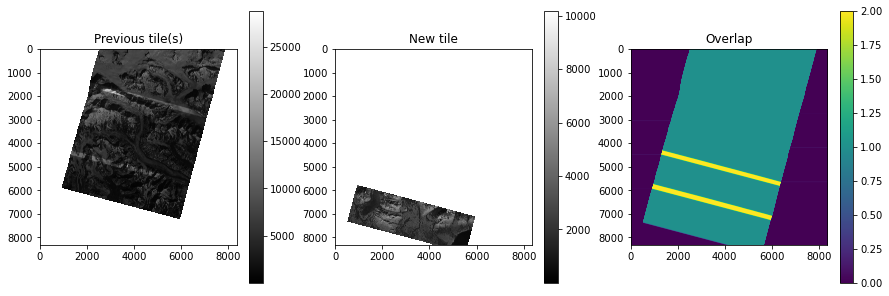

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: -34.81254178563932
New mean diff: 0.0
Larger tile mean value: 4347.05937065918
Normalized mean value for smaller tile: 2004.2341303999215




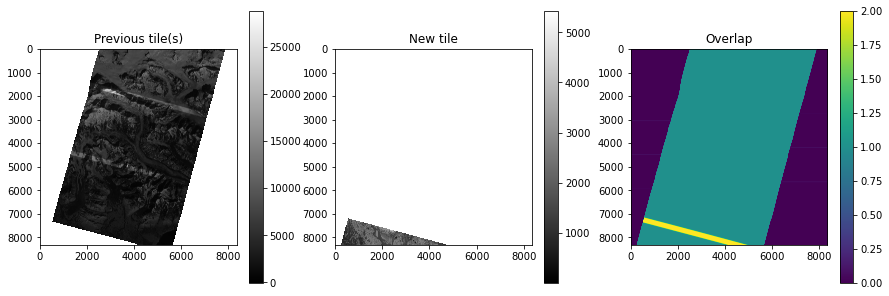

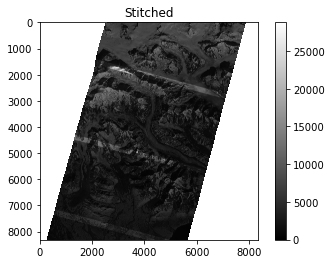

TILES FOR 20200914 1054
['/Volumes/SGlacier/Turner20_21/09_20/out/20200914_170222_1054_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200914_170223_1054_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200914_170224_1054_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200914_170225_1054_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200914_170226_1054_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200914_170227_1054_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200914_170228_1054_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200914_170229_1054_3B_AnalyticMS_SR_clip_5m.tif']


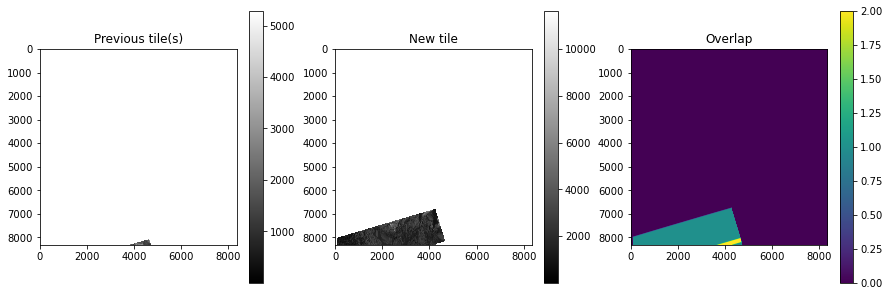

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: -4.994162339258695
New mean diff: 0.0
Larger tile mean value: 1834.5036957053844
Normalized mean value for smaller tile: 2096.806629863535




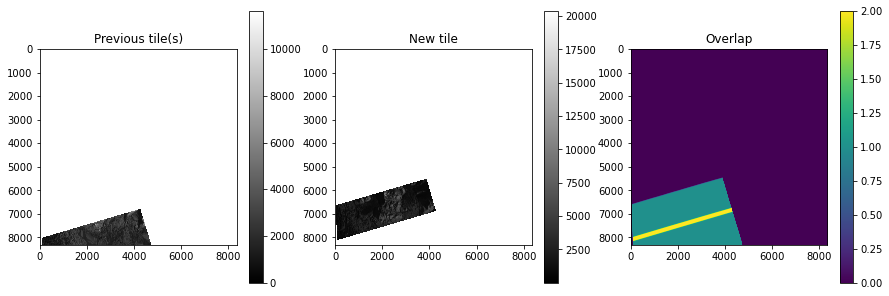

Current tile is larger.
Mean difference in values from the larger tile in overlap area: -44.89003596422617
New mean diff: 0.0
Larger tile mean value: 2109.4432917831937
Normalized mean value for smaller tile: 1659.2900417948742




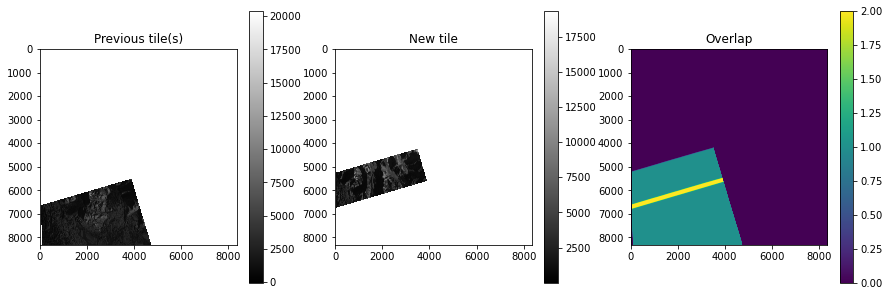

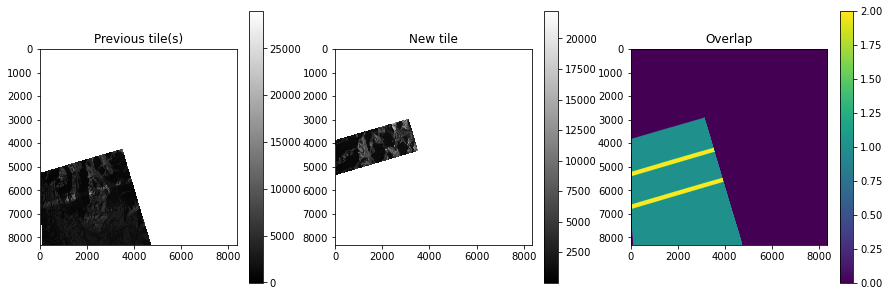

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: -2.7033104375367523
New mean diff: -1.3346780282759754
Larger tile mean value: 2310.7553187931535
Normalized mean value for smaller tile: 2693.501407475127




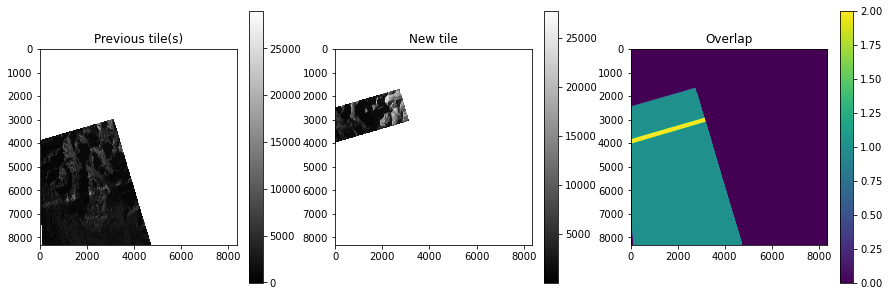

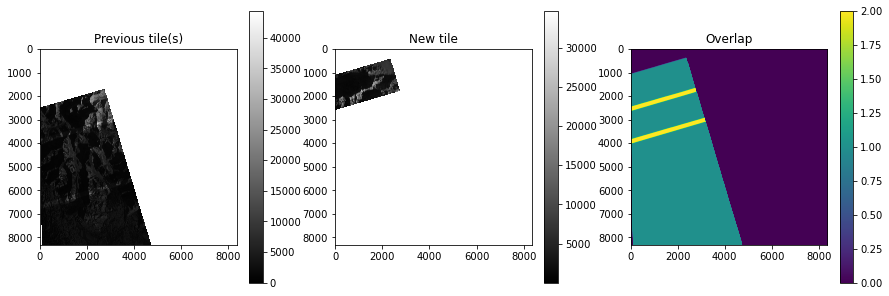

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: 6.161516955838009
New mean diff: 7.093595109263235
Larger tile mean value: 3046.94937707191
Normalized mean value for smaller tile: 3745.0208064136764




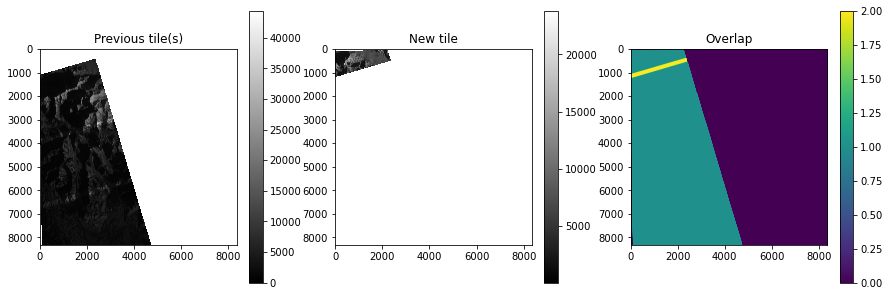

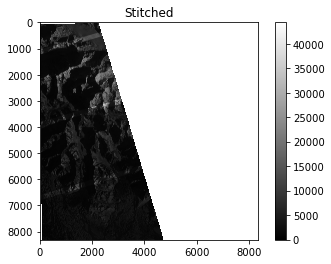

TILES FOR 20200915 1048
['/Volumes/SGlacier/Turner20_21/09_20/out/20200915_165919_1_1048_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200915_165920_1048_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200915_165921_1048_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200915_165922_1048_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200915_165923_1048_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200915_165924_1048_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200915_165925_1048_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200915_165926_1048_3B_AnalyticMS_SR_clip_5m.tif']


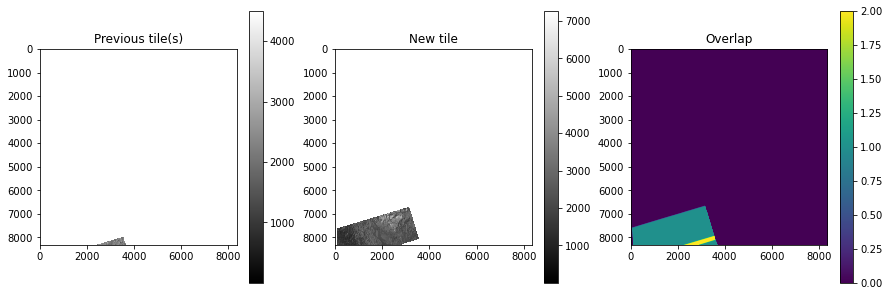

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: -3.2527614144830976
New mean diff: 0.0
Larger tile mean value: 2243.1281349694264
Normalized mean value for smaller tile: 2367.6530214343657




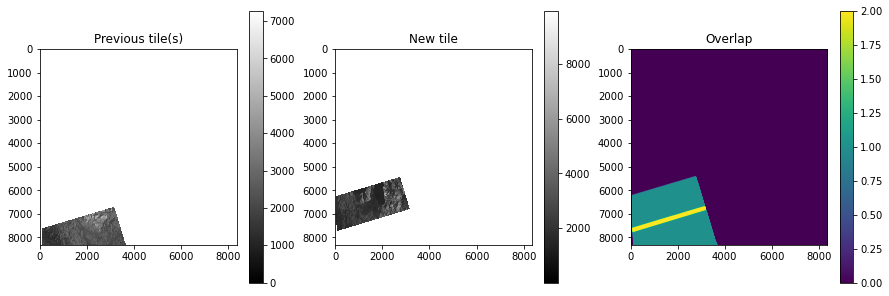

Current tile is larger.
Mean difference in values from the larger tile in overlap area: -16.23295454081517
New mean diff: 0.0
Larger tile mean value: 2448.122031178765
Normalized mean value for smaller tile: 2069.107427984606




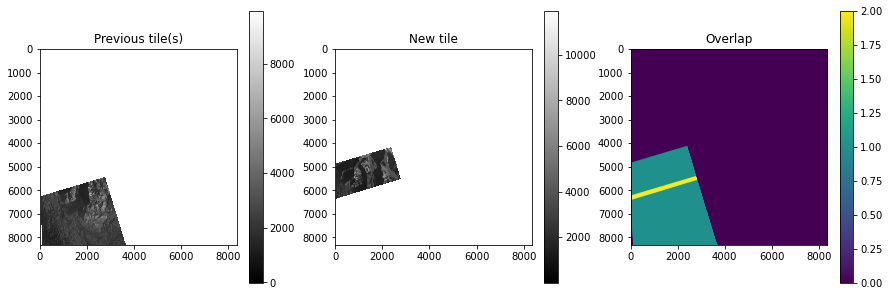

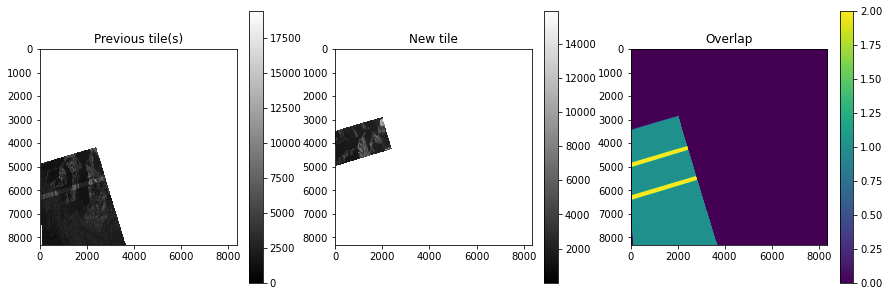

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: 22.387114103390903
New mean diff: 0.0
Larger tile mean value: 2593.1354827456453
Normalized mean value for smaller tile: 2376.0459307342967




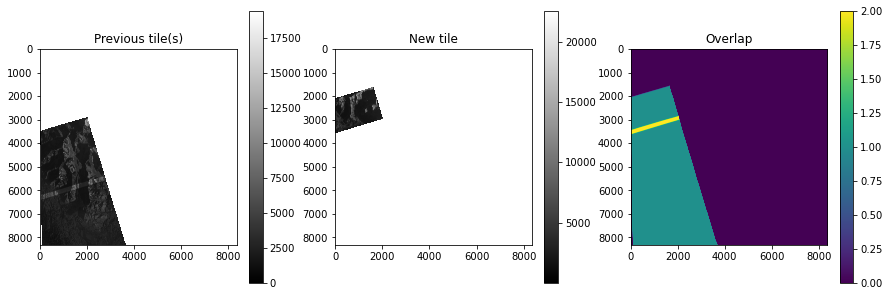

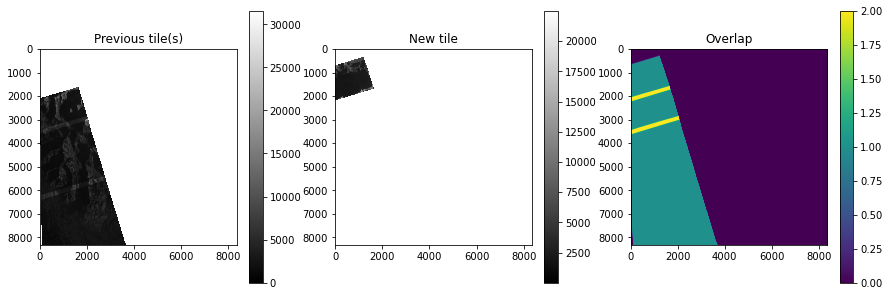

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: 5.384475402445947
New mean diff: 0.0
Larger tile mean value: 2803.1727287001136
Normalized mean value for smaller tile: 2642.18803971925




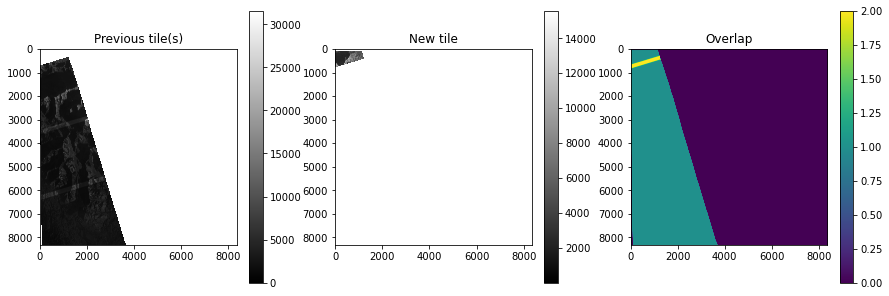

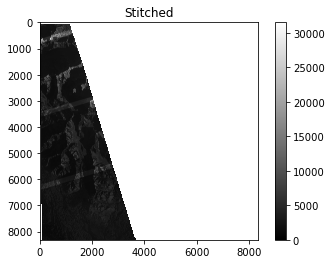

TILES FOR 20200915 1049
['/Volumes/SGlacier/Turner20_21/09_20/out/20200915_165546_1049_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200915_165547_1049_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200915_165548_1049_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200915_165549_1049_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200915_165550_1049_3B_AnalyticMS_SR_clip_5m.tif']


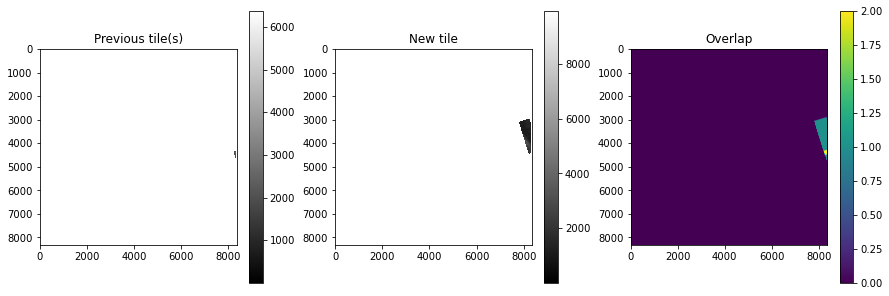

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: -10.110231008243034
New mean diff: 0.0
Larger tile mean value: 2102.8737526722784
Normalized mean value for smaller tile: 1471.7984702184758




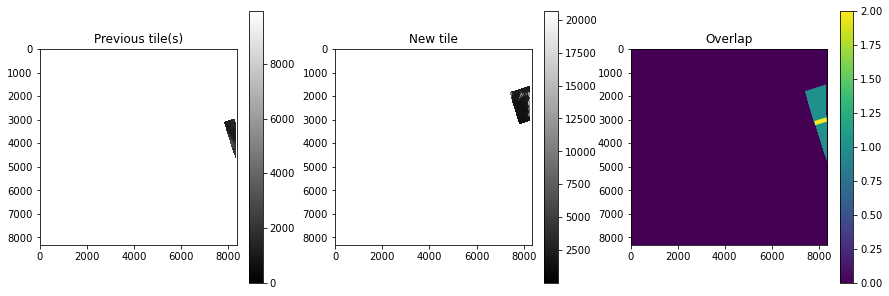

Current tile is larger.
Mean difference in values from the larger tile in overlap area: 11.339481196548103
New mean diff: 0.0
Larger tile mean value: 2751.3494158299186
Normalized mean value for smaller tile: 1349.4378215048464




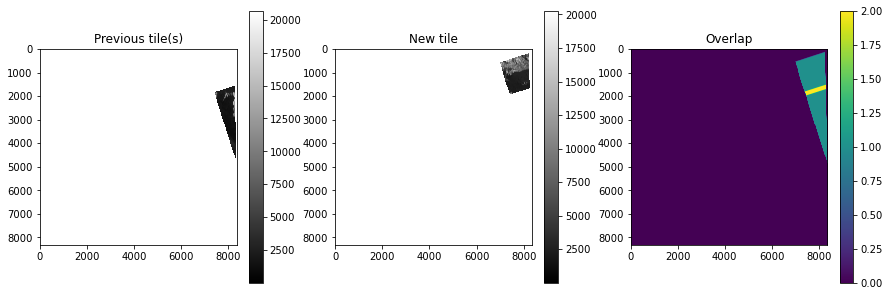

Current tile is larger.
Mean difference in values from the larger tile in overlap area: 1.29372866263681
New mean diff: 0.0
Larger tile mean value: 5399.87830094095
Normalized mean value for smaller tile: 2132.707632243691




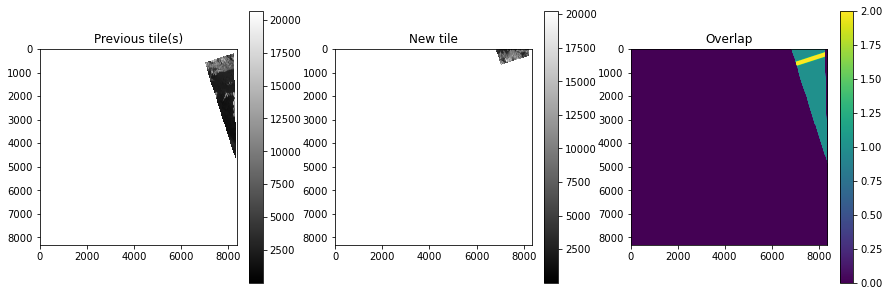

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: -3.142883828304051
New mean diff: 0.0
Larger tile mean value: 4057.6371334676323
Normalized mean value for smaller tile: 4862.5501853546275




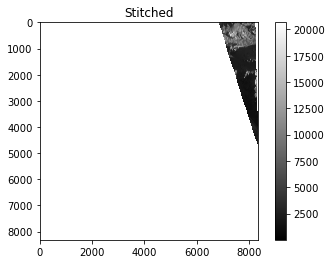

TILES FOR 20200915 1061
['/Volumes/SGlacier/Turner20_21/09_20/out/20200915_204849_86_1061_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200915_204851_86_1061_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200915_204853_87_1061_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200915_204855_88_1061_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200915_204857_88_1061_3B_AnalyticMS_SR_clip_5m.tif']


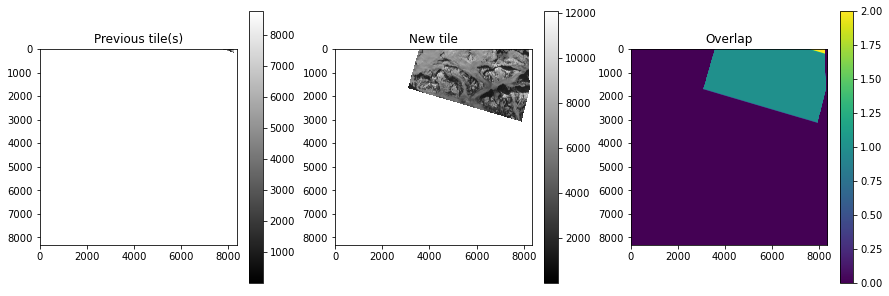

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: -24.113432596553498
New mean diff: 0.0
Larger tile mean value: 3864.8688383284866
Normalized mean value for smaller tile: 4874.924244924863




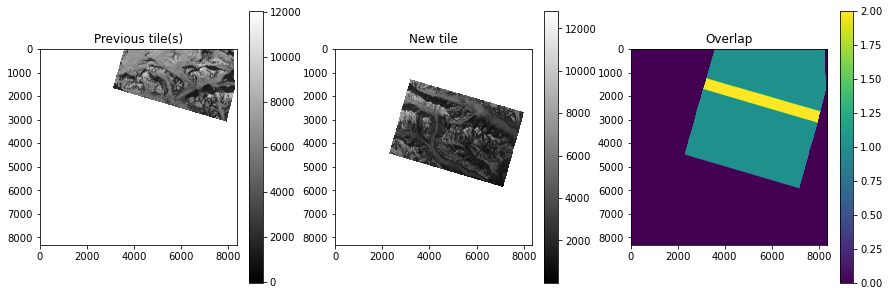

Current tile is larger.
Mean difference in values from the larger tile in overlap area: 22.8536600310095
New mean diff: 0.0
Larger tile mean value: 3107.0640700611807
Normalized mean value for smaller tile: 4083.7596089501308




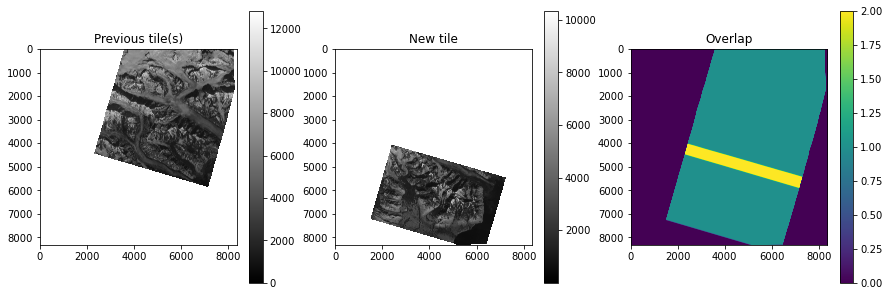

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: 2.0048064169670754
New mean diff: 1.7329921430655848
Larger tile mean value: 3836.640453017261
Normalized mean value for smaller tile: 1901.9588937516585




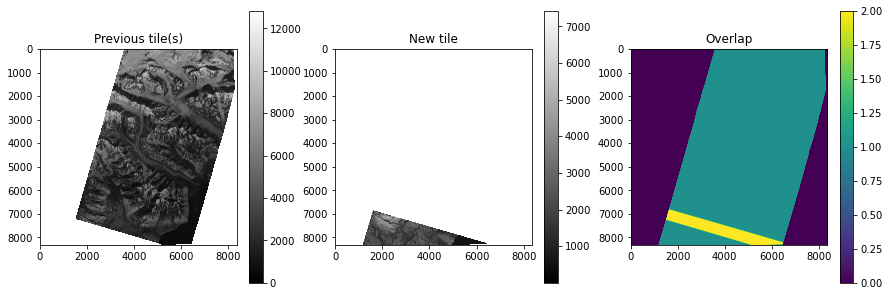

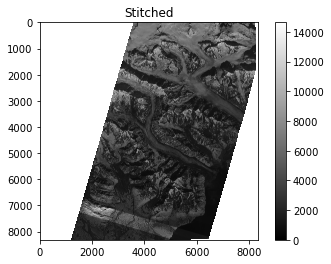

TILES FOR 20200915 2263
['/Volumes/SGlacier/Turner20_21/09_20/out/20200915_195804_69_2263_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200915_195807_07_2263_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200915_195809_44_2263_3B_AnalyticMS_SR_clip_5m.tif']


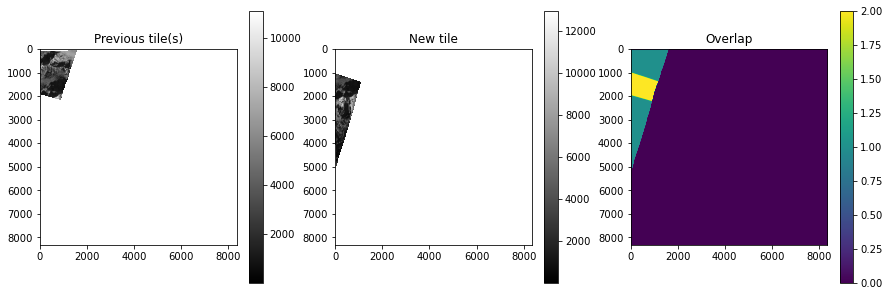

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: -0.25916473781003724
New mean diff: 0.0
Larger tile mean value: 3197.3691699749693
Normalized mean value for smaller tile: 1799.8204025434889




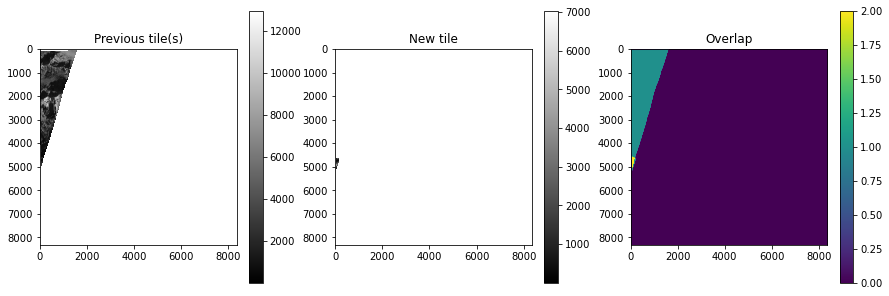

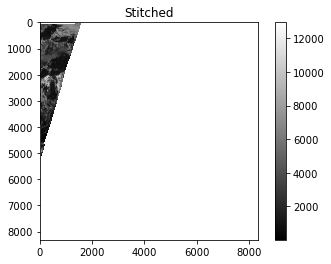

TILES FOR 20200916 0f21
['/Volumes/SGlacier/Turner20_21/09_20/out/20200916_170201_0f21_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200916_170202_0f21_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200916_170203_0f21_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200916_170204_0f21_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200916_170205_0f21_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200916_170206_0f21_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200916_170207_0f21_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200916_170208_0f21_3B_AnalyticMS_SR_clip_5m.tif']


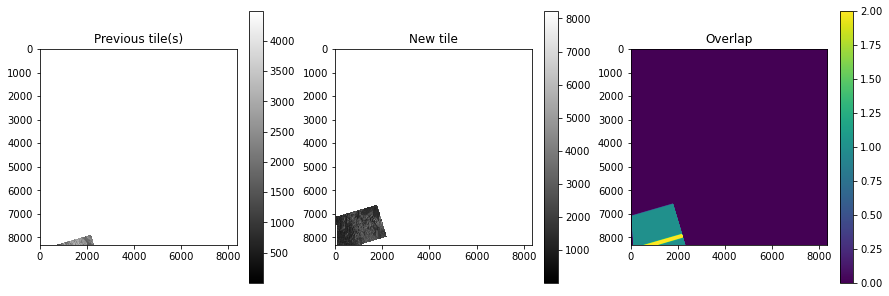

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: -1.9274746620111571
New mean diff: 0.0
Larger tile mean value: 2307.1492417107684
Normalized mean value for smaller tile: 1759.4363421681448




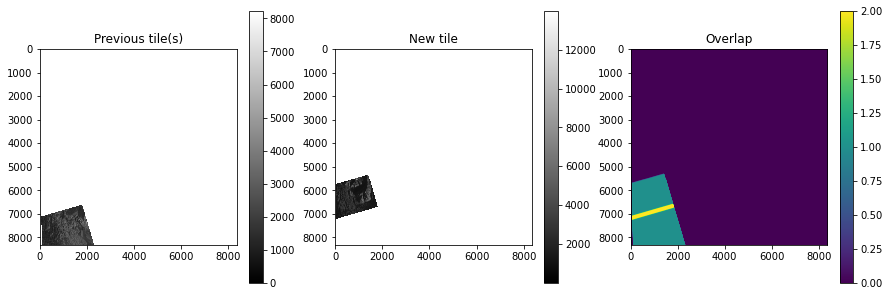

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: -2.3261441337124453
New mean diff: 0.0
Larger tile mean value: 1984.3942700013913
Normalized mean value for smaller tile: 1893.362669858096




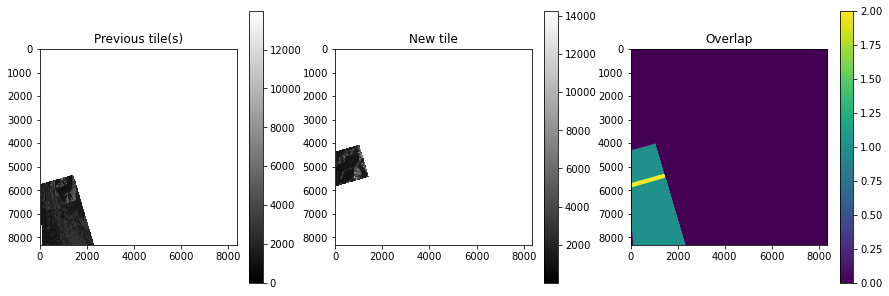

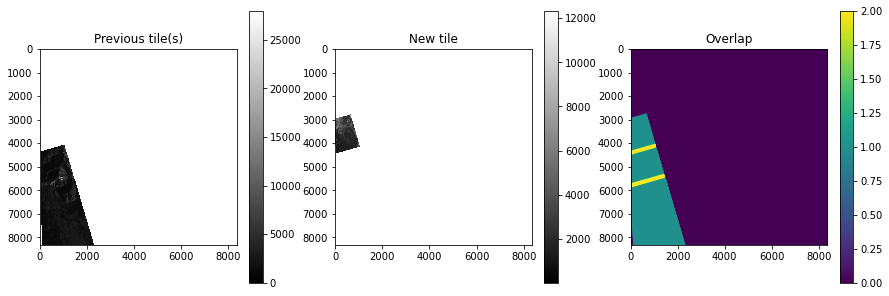

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: 4.09265395937422
New mean diff: 0.0
Larger tile mean value: 2182.5454368824944
Normalized mean value for smaller tile: 2284.282016909252




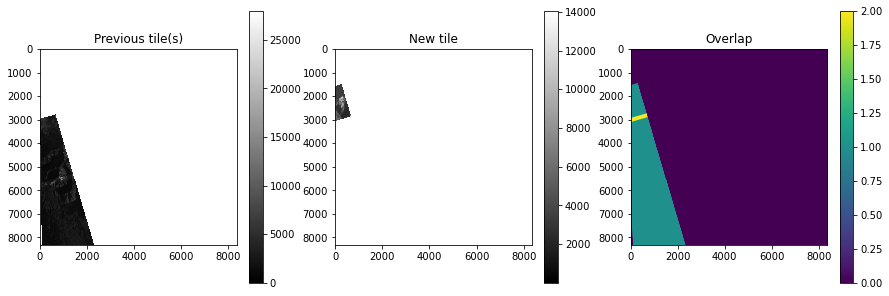

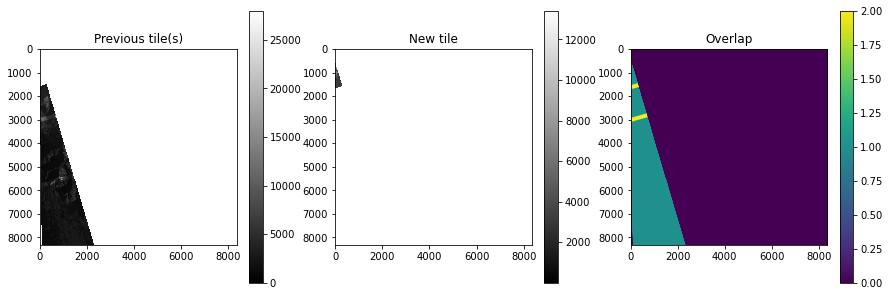

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: -2.6720445736795946
New mean diff: 0.0
Larger tile mean value: 2432.5722191068962
Normalized mean value for smaller tile: 3060.762254193052




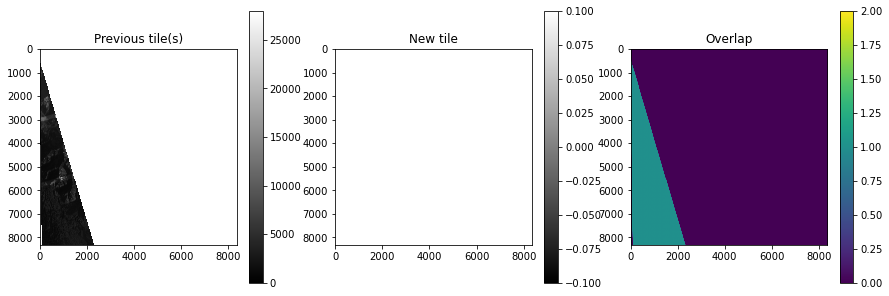

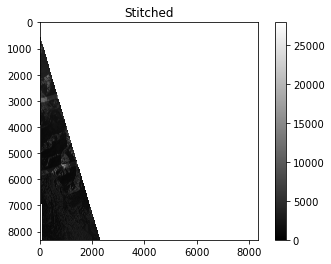

TILES FOR 20200916 100d
['/Volumes/SGlacier/Turner20_21/09_20/out/20200916_165551_100d_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200916_165552_100d_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200916_165553_100d_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200916_165554_100d_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200916_165555_100d_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200916_165556_100d_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200916_165557_100d_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200916_165558_100d_3B_AnalyticMS_SR_clip_5m.tif']


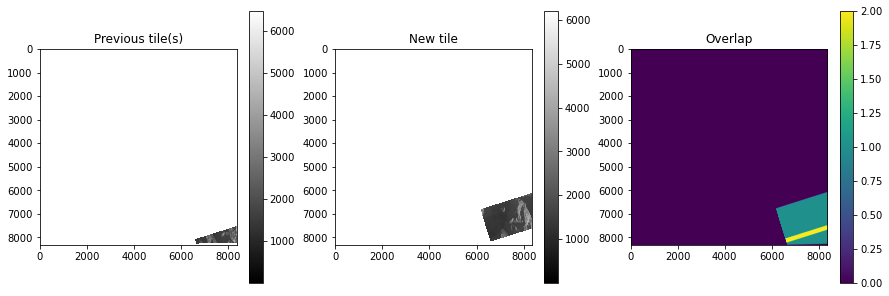

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: 0.03382993306972064
New mean diff: 0.0
Larger tile mean value: 2000.080563433811
Normalized mean value for smaller tile: 1582.9868281566944




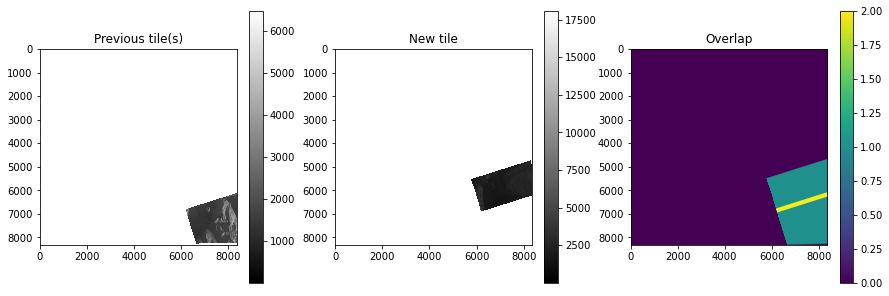

Current tile is larger.
Mean difference in values from the larger tile in overlap area: 26.81193167051425
New mean diff: 0.0
Larger tile mean value: 2180.7543608627657
Normalized mean value for smaller tile: 1660.1133361814643




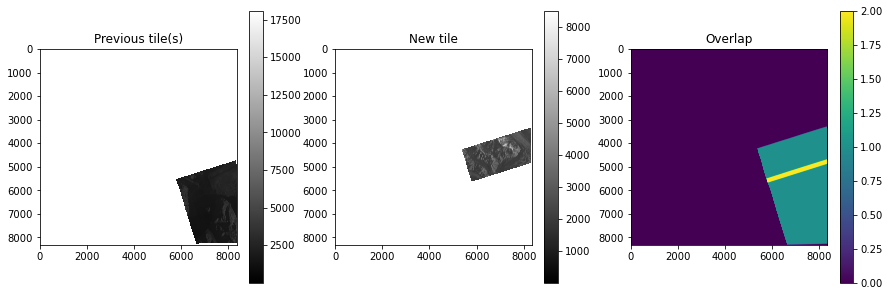

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: -0.7614439553549045
New mean diff: -0.04458356872260174
Larger tile mean value: 2034.3996621628185
Normalized mean value for smaller tile: 2264.440842197582




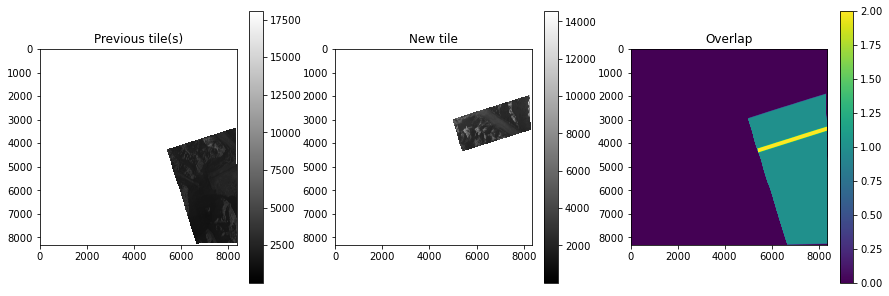

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: -1.1314802491779543
New mean diff: 0.0
Larger tile mean value: 2222.8045062159795
Normalized mean value for smaller tile: 2861.653251017285




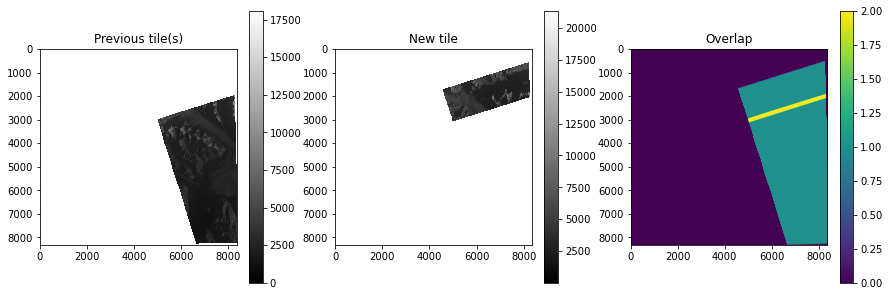

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: -4.249025677361624
New mean diff: 0.0
Larger tile mean value: 2507.0059584181076
Normalized mean value for smaller tile: 3627.897598986065




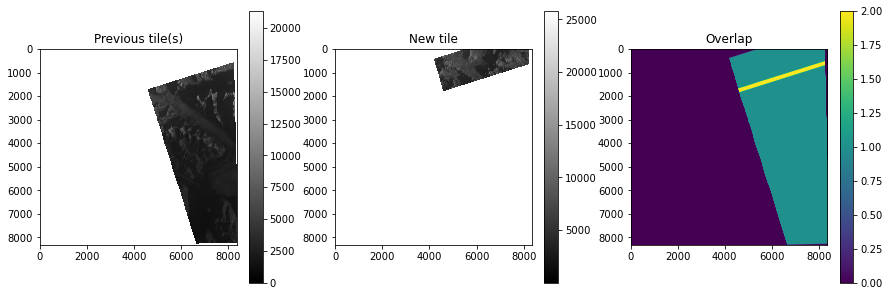

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: -5.475139811275451
New mean diff: 0.0
Larger tile mean value: 2889.020377838414
Normalized mean value for smaller tile: 5087.173007468801




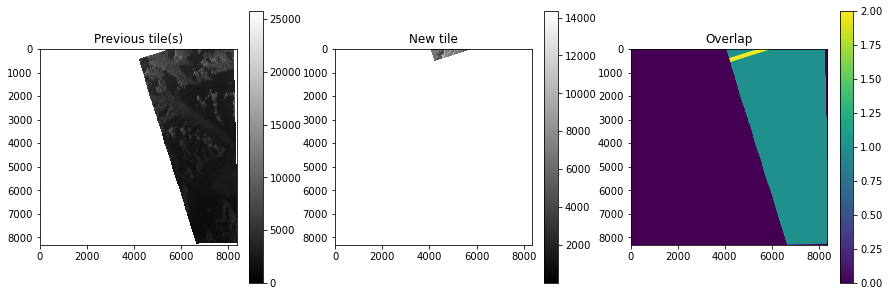

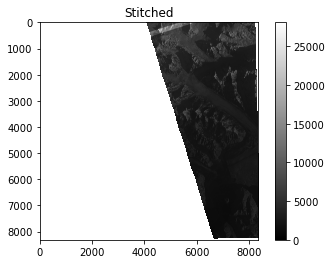

TILES FOR 20200916 106e
['/Volumes/SGlacier/Turner20_21/09_20/out/20200916_191246_80_106e_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200916_191248_85_106e_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200916_191250_90_106e_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200916_191252_95_106e_3B_AnalyticMS_SR_clip_5m.tif']


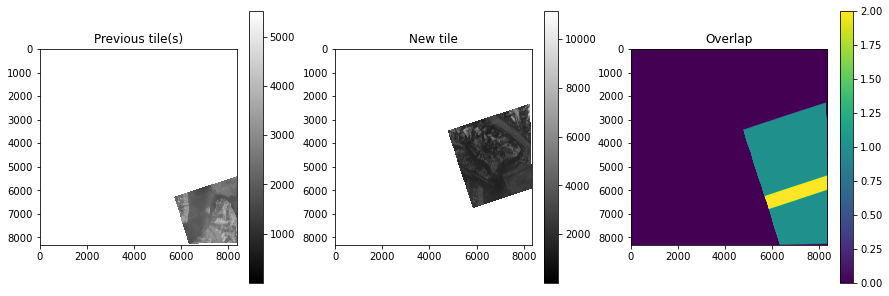

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: -4.507521988995245
New mean diff: -1.2055039738919235
Larger tile mean value: 2463.8573916763994
Normalized mean value for smaller tile: 2037.800107410732




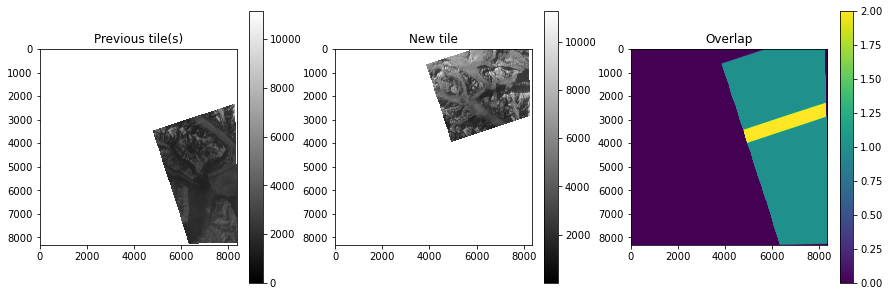

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: -8.039520120404234
New mean diff: -0.17092532068303112
Larger tile mean value: 2409.952566273891
Normalized mean value for smaller tile: 3744.2567743976842




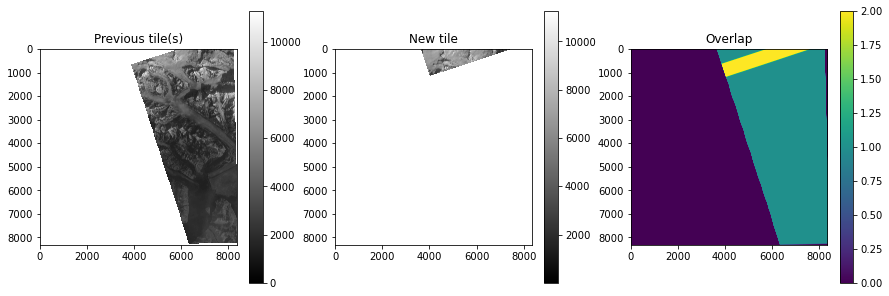

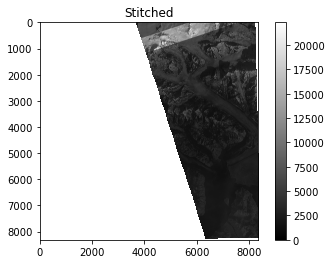

TILES FOR 20200916 2231
['/Volumes/SGlacier/Turner20_21/09_20/out/20200916_194804_69_2231_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200916_194807_04_2231_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200916_194809_39_2231_3B_AnalyticMS_SR_clip_5m.tif']


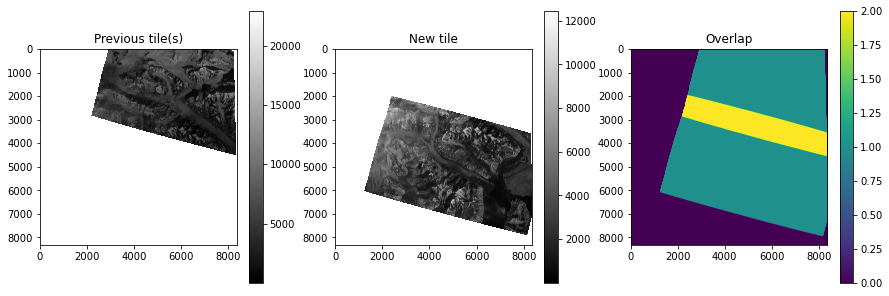

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: 3.2719885937670763
New mean diff: 1.659717493146219
Larger tile mean value: 4606.386556534907
Normalized mean value for smaller tile: 2198.636857311156




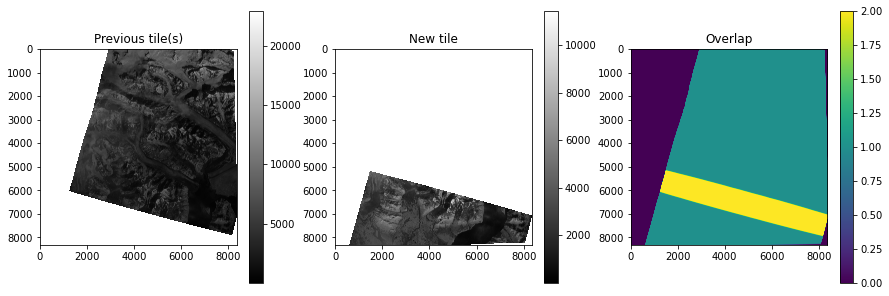

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: 3.9430377765916926
New mean diff: 0.2955001533531761
Larger tile mean value: 3677.883799063463
Normalized mean value for smaller tile: 1473.8436926387214




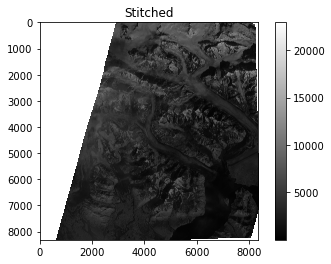

TILES FOR 20200918 1066
['/Volumes/SGlacier/Turner20_21/09_20/out/20200918_204436_22_1066_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200918_204440_72_1066_3B_AnalyticMS_SR_clip_5m.tif']


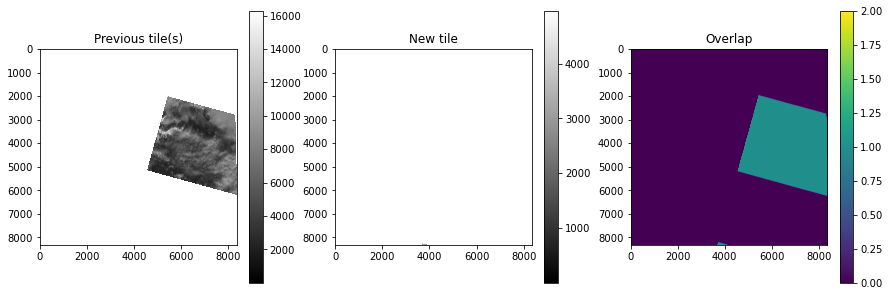

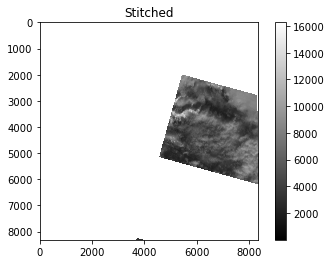

TILES FOR 20200918 2412
['/Volumes/SGlacier/Turner20_21/09_20/out/20200918_204237_88_2412_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200918_204240_23_2412_3B_AnalyticMS_SR_clip_5m.tif']


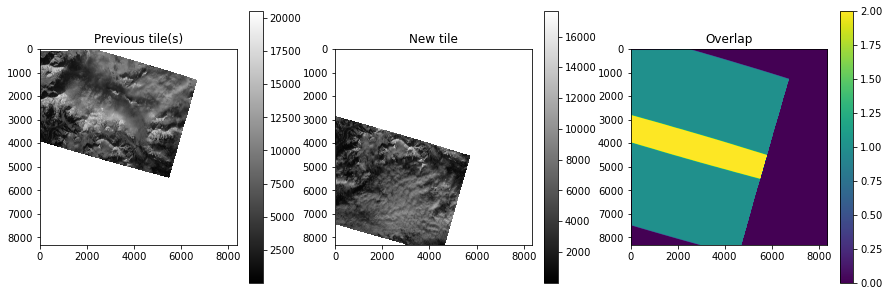

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: 2.1683890933381162
New mean diff: -0.1750515517413419
Larger tile mean value: 6488.028176165116
Normalized mean value for smaller tile: 3700.9292596740293




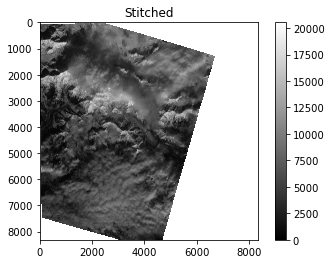

TILES FOR 20200919 1040
['/Volumes/SGlacier/Turner20_21/09_20/out/20200919_201127_1040_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200919_201128_1040_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200919_201129_1040_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200919_201130_1040_3B_AnalyticMS_SR_clip_5m.tif']


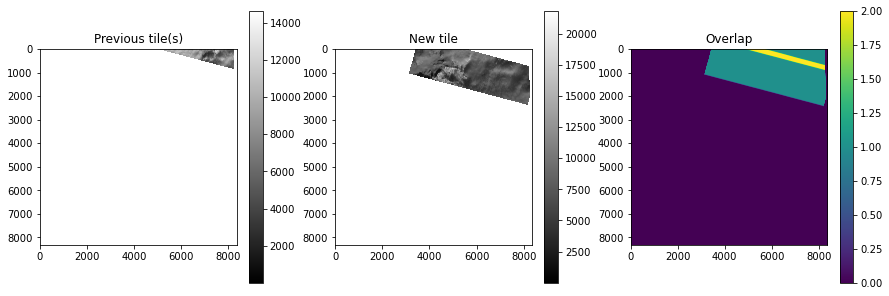

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: -1.9445942807359475
New mean diff: 0.0
Larger tile mean value: 7457.461484296278
Normalized mean value for smaller tile: 6806.541252556669




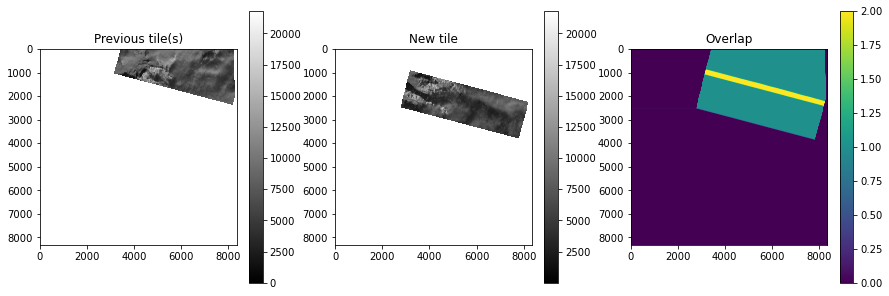

Current tile is larger.
Mean difference in values from the larger tile in overlap area: 2.3709617153326965
New mean diff: 0.0
Larger tile mean value: 6218.186863952837
Normalized mean value for smaller tile: 6504.049204748831




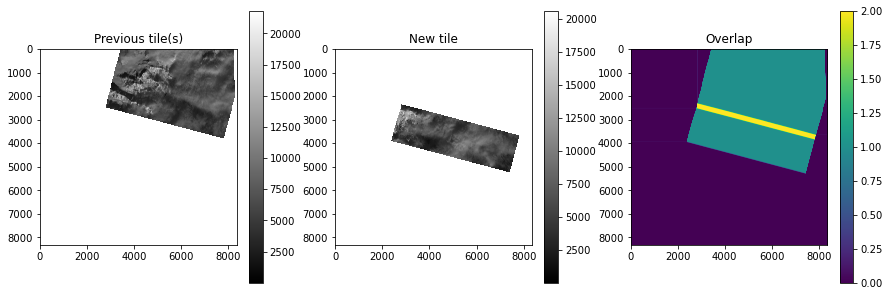

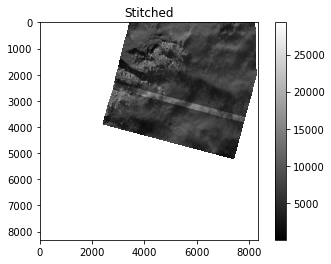

TILES FOR 20200920 104b
['/Volumes/SGlacier/Turner20_21/09_20/out/20200920_165854_104b_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200920_165855_104b_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200920_165856_104b_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200920_165857_104b_3B_AnalyticMS_SR_clip_5m.tif']


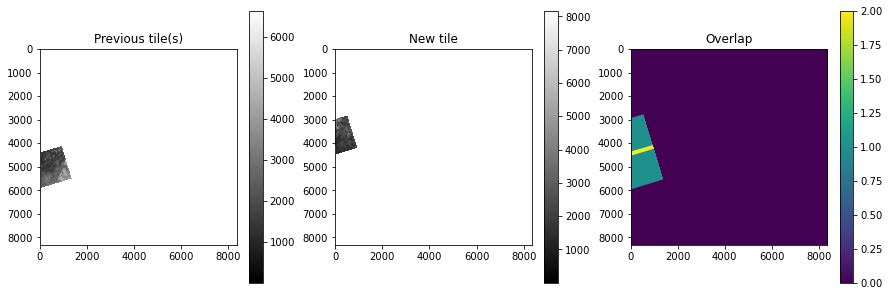

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: 2.1262058490301254
New mean diff: 0.0
Larger tile mean value: 2372.6487419121263
Normalized mean value for smaller tile: 1948.7018093853867




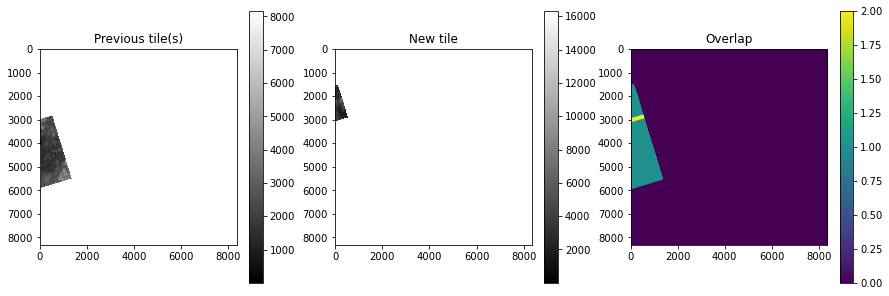

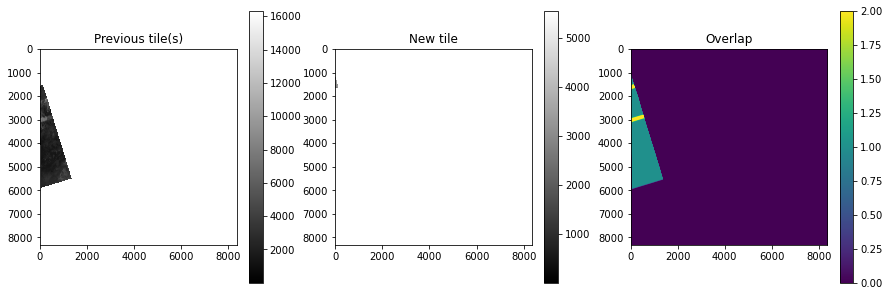

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: -2.326130575316192
New mean diff: 0.0
Larger tile mean value: 2565.0358939841426
Normalized mean value for smaller tile: 1707.424972307039




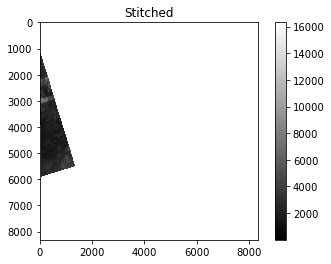

TILES FOR 20200920 1058
['/Volumes/SGlacier/Turner20_21/09_20/out/20200920_204813_09_1058_3B_AnalyticMS_SR_clip_5m.tif']


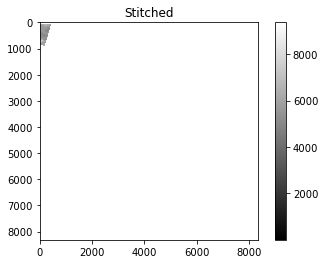

TILES FOR 20200924 0f44
['/Volumes/SGlacier/Turner20_21/09_20/out/20200924_165701_0f44_3B_AnalyticMS_SR_clip_5m.tif']


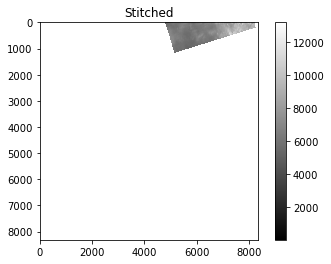

TILES FOR 20200924 1014
['/Volumes/SGlacier/Turner20_21/09_20/out/20200924_201121_1014_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200924_201122_1014_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200924_201124_1014_3B_AnalyticMS_SR_clip_5m.tif']


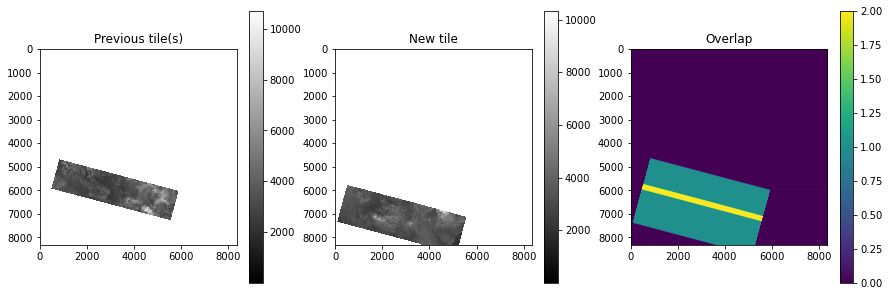

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: 1.3705598363648475
New mean diff: 0.0
Larger tile mean value: 3681.541266319244
Normalized mean value for smaller tile: 2874.96373785586




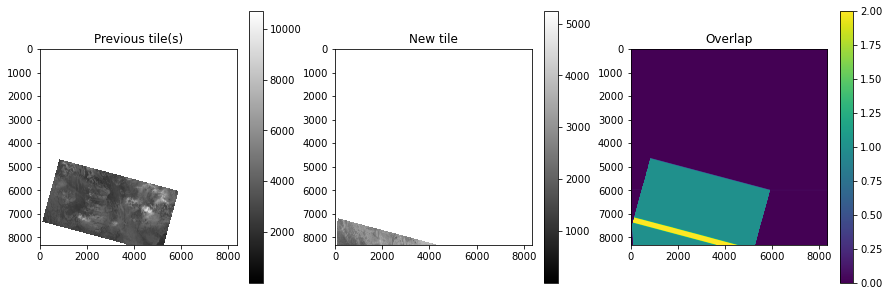

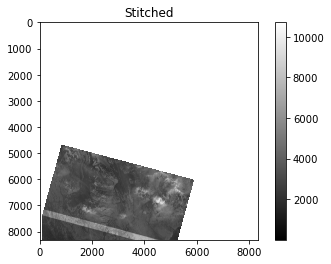

TILES FOR 20200925 104a
['/Volumes/SGlacier/Turner20_21/09_20/out/20200925_165809_104a_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200925_165810_104a_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200925_165811_104a_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200925_165812_104a_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200925_165812_1_104a_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200925_165813_104a_3B_AnalyticMS_SR_clip_5m.tif']


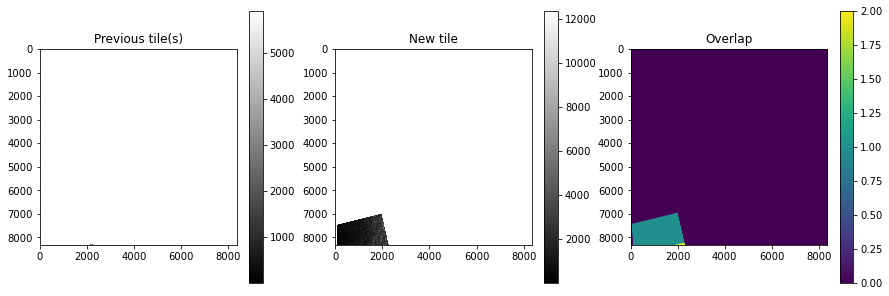

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: -20.46380678409437
New mean diff: 0.0
Larger tile mean value: 2737.4697564324842
Normalized mean value for smaller tile: 1381.0271275669622




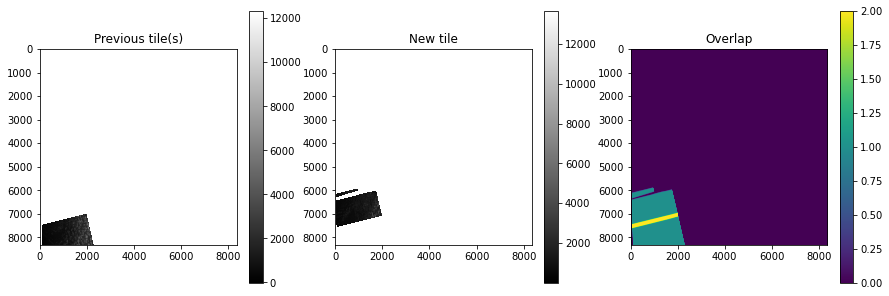

Current tile is larger.
Mean difference in values from the larger tile in overlap area: 20.168935970616168
New mean diff: 0.0
Larger tile mean value: 1115.264828984643
Normalized mean value for smaller tile: 1249.8806816516405




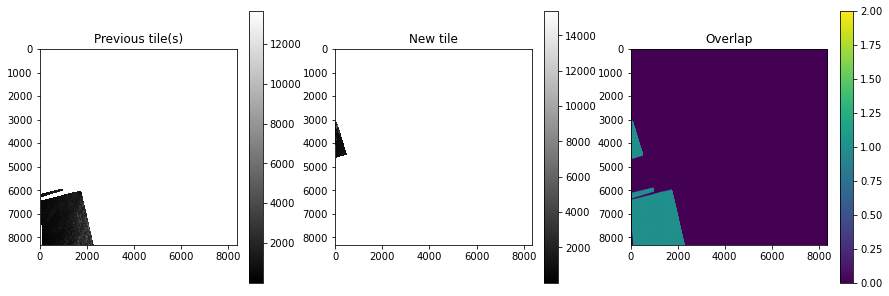

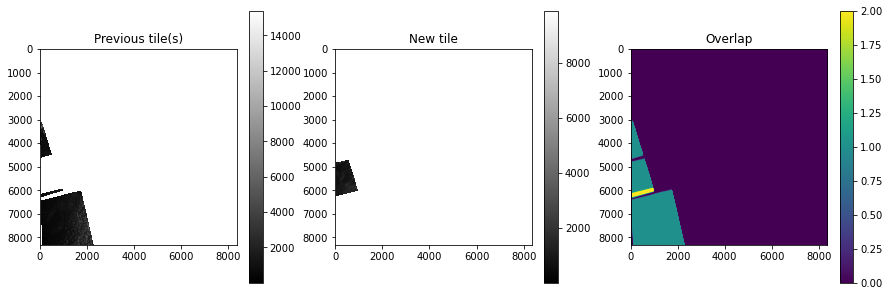

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: 11.242973495977042
New mean diff: 0.0
Larger tile mean value: 1279.038002011598
Normalized mean value for smaller tile: 808.2129163302392




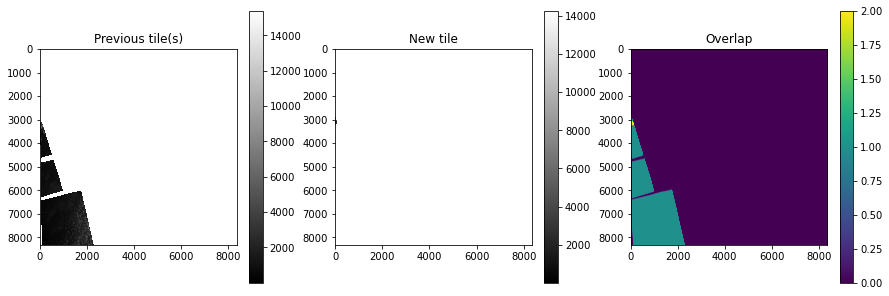

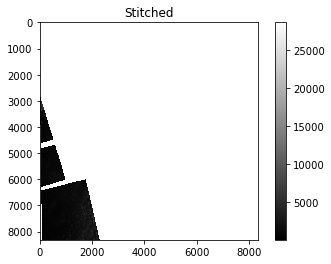

TILES FOR 20200925 106b
['/Volumes/SGlacier/Turner20_21/09_20/out/20200925_191555_56_106b_3B_AnalyticMS_SR_clip_5m.tif']


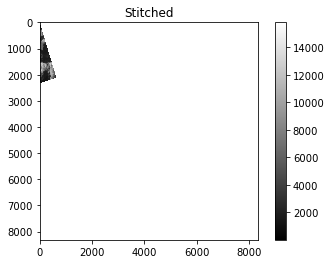

TILES FOR 20200925 2278
['/Volumes/SGlacier/Turner20_21/09_20/out/20200925_194749_51_2278_3B_AnalyticMS_SR_clip_5m.tif']


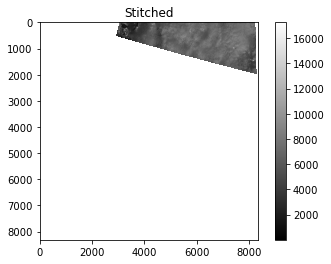

TILES FOR 20200929 2304
['/Volumes/SGlacier/Turner20_21/09_20/out/20200929_194734_26_2304_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200929_194736_66_2304_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/20200929_194739_05_2304_3B_AnalyticMS_SR_clip_5m.tif']


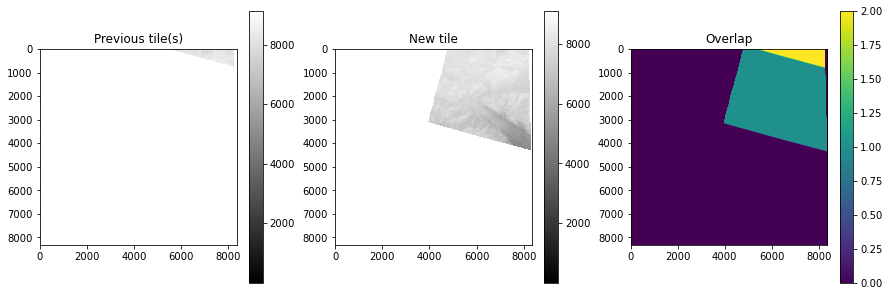

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: -3.763305428624997
New mean diff: 0.0
Larger tile mean value: 8170.283538528194
Normalized mean value for smaller tile: 6901.138391892823




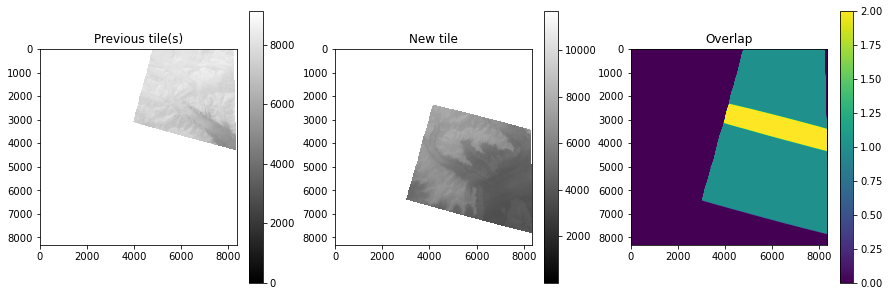

Current tile is larger.
Mean difference in values from the larger tile in overlap area: 0.8356612691399935
New mean diff: 0.5610966384020174
Larger tile mean value: 5549.140988861616
Normalized mean value for smaller tile: 5714.953516328373




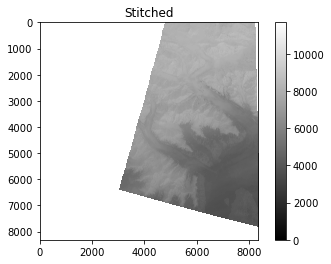

In [83]:
binary_thresh = 1
for date, ID in sorted_dates:  
    print('TILES FOR', date, ID)
    # Grab the Planet tiles corresponding to each unique date
    tiles = glob.glob(basepath+'/'+date+'*'+ID+'*SR_clip_5m.tif') # grab all file paths for that date
    tiles.sort()
    print(tiles)
    
    # initialize empty arrays
    overlap_total = np.zeros(reftile.shape);
    sr_stitched = np.zeros(reftile.shape) # start with empty stitched product
    t = 0 # tile count
    
    for tile in tiles:
        reader = rio.open(tile); sr = reader.read(1) # load the tile
        sr[sr == 0] = np.NaN # remove black background, replace with Nans
        sr_data = sr.copy() # make a copy of the data before making the data binary
        sr[sr>0.0] = 1 ; sr[np.isnan(sr)] = 0 # make tile binary
        
        tilesize = np.count_nonzero(sr) # grab the current tile size (pixels)
        overlap_total = overlap_total+sr # add new overlap to overlap total
        
        if t == 0: # for the first tile
            sr_stitched = sr_stitched+sr_data # add the data to sr_stitched
            overlap_area = 0 # no overlap area for the first tile
        
        else: # for all subsequent tiles, do iterative normalization based on overlapping area, if any
            overlap_area = np.count_nonzero(overlap_total[overlap_total >= 2]) # update total overlap area
            
            # Plot the tile comparison and overlap
            fig, (ax1,ax2,ax3) = plt.subplots(1,3,figsize=(15,5))
            im1 = ax1.imshow(sr_stitched,cmap='gray'); ax1.set_title('Previous tile(s)'); fig.colorbar(im1,ax=ax1)
            im2 = ax2.imshow(sr_data,cmap='gray'); ax2.set_title('New tile'); fig.colorbar(im2, ax=ax2)
            im3 = ax3.imshow(overlap_total,vmin=0,vmax=2); ax3.set_title('Overlap'); fig.colorbar(im3,ax=ax3)
            plt.show()
            
            # if the total overlap area has increased (i.e., new overlap) AND they overlap over the glacier
            if overlap_area > prev_overlap: 
                # mask for overlapping area:
                overlap_band = ma.masked_not_equal(overlap_total, 2) # identify non-overlapping area (not 2)
                overlap_band_mask = ma.getmaskarray(overlap_band)
                
                # mask for glacier ice:
                glacier_ice = ma.masked_equal(mask_resamp, 1) # identify glacier ice area
                glacier_ice_mask = ma.getmaskarray(glacier_ice)
                
                # identify which tile is larger
                if tilesize > prev_tilesize:
                    print('Current tile is larger.')
                    larger_tile = sr_data; smaller_tile = sr_stitched # assign the tiles
                elif tilesize < prev_tilesize:
                    print('Previous tile is larger.')
                    larger_tile = sr_stitched; smaller_tile = sr_data # assign the tiles
                else: # equal sizes
                    print('Tiles are the same size.')
                    larger_tile = sr_data; smaller_tile = sr_stitched # use current tile to coregister
                
                # grab mean pixel difference from overlapping area and the glacier mask!!
                overlap_values_l = ma.masked_where(overlap_band_mask, larger_tile)
                overlap_values_larger = ~overlap_values_l.mask*overlap_values_l.data
                overlap_values_s = ma.masked_where(overlap_band_mask, smaller_tile)
                overlap_values_smaller = ~overlap_values_s.mask*overlap_values_s.data
                
                # crop both to glacier mask
                overlap_glacier_l = ma.masked_where(glacier_ice_mask, overlap_values_larger)
                overlap_glacier_larger = overlap_glacier_l.mask*overlap_glacier_l.data
                overlap_glacier_s = ma.masked_where(glacier_ice_mask, overlap_values_smaller)
                overlap_glacier_smaller = overlap_glacier_s.mask*overlap_glacier_s.data
                
                # mean difference in all overlapping area between tiles
                mean_diff = np.nanmean(np.subtract(overlap_values_larger,overlap_values_smaller)) 
                print('Mean difference in values from the larger tile in overlap area:',mean_diff)
                
                # mean difference in overlapping area over glacier
                mean_diff2 = np.nanmean(np.subtract(overlap_glacier_larger,overlap_glacier_smaller))
                print('New mean diff:', mean_diff2)
                
                if mean_diff2 != 0: # if there is glacier overlap, only shift with glacier difference
                    
                    # normalize the smaller tile's values to the larger reference tile's overlap values
                    smaller_tile_coreg = smaller_tile + mean_diff2 # add the mean difference to all values
                    smaller_tile_coreg = ma.masked_where(~overlap_band_mask, smaller_tile_coreg) 

                    # remove overlap area from smaller tile:
                    masked_smaller_tile_coreg = ~smaller_tile_coreg.mask*smaller_tile_coreg.data
                    
                else: # If not, shift with overlapping difference
                    smaller_tile_coreg = smaller_tile + mean_diff # add the mean difference to all values
                    smaller_tile_coreg = ma.masked_where(~overlap_band_mask, smaller_tile_coreg) 

                    # remove overlap area from smaller tile:
                    masked_smaller_tile_coreg = ~smaller_tile_coreg.mask*smaller_tile_coreg.data
                    
                print('Larger tile mean value:',np.nanmean(larger_tile))
                print('Normalized mean value for smaller tile:',np.nanmean(masked_smaller_tile_coreg))
                print(); print();

                # add them to the stitched produdct
                sr_stitched = np.nansum([masked_smaller_tile_coreg, larger_tile],0) 
                overlap_total[overlap_total > 0] = 1 # refresh overlap total
            else: # if no overlap, just add them without doing anything
                sr_stitched = np.nansum([sr_data, sr_stitched],0) # add them to the stitched product

        # Store tile info for the next round of comparison
        prev_overlap = overlap_area # amount of pixels overlapping
        prev_tilesize = np.count_nonzero(sr_stitched) # previous tile size (pixels w/ data)
        sr_prev = sr_data
        sr_stitched[sr_stitched == 0]=np.NaN # fill black pixels with NaNs
        t += 1 # increment tile count
        
    # Plot final stitched image
    fig = plt.figure(); im = plt.imshow(sr_stitched, cmap='gray'); plt.title('Stitched'); 
    fig.colorbar(im); plt.show()
   
    
    
    # Export stitched image
    outfilename = 'PS_'+date+'_'+ID+'.tif'
    if not os.path.exists(basepath+"stitched_by_sat/"):
        os.mkdir(basepath+"stitched_by_sat/")
    with rio.open(basepath+"stitched_by_sat/"+outfilename,'w',
                      driver='GTiff',
                      height=sr_stitched.shape[0], # new shape
                      width=sr_stitched.shape[1], # new shape
                      dtype=sr_stitched.dtype, # data type
                      count=1,
                      crs=reftile.crs, # the EPSG from the original DEM
                      transform=reftile.transform) as dst:
            dst.write(sr_stitched, 1)
    del overlap_total; del sr_stitched # clear variables
            
# #     break
#     del sr_coregistered; del sr_originals; del total_coverage; del overlap_total; del sr_binary;
    

# Stitch together all satellite chunks for each date

In [84]:
# grab all the unique dates
dates = []
for file in os.listdir(basepath+'stitched_by_sat/'): # path
    date = file.split('_')[1] # grab the date from the file name
    dates.append(date)
unique_dates = list(set(dates)) # save a list of the dates
unique_dates.sort() # sort the dates
print(unique_dates)

['20200904', '20200905', '20200906', '20200910', '20200911', '20200912', '20200913', '20200914', '20200915', '20200916', '20200918', '20200919', '20200920', '20200924', '20200925', '20200929']


TILES FOR 20200904
['/Volumes/SGlacier/Turner20_21/09_20/out/stitched_by_sat/PS_20200904_2278.tif']


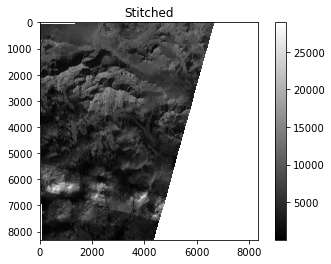

TILES FOR 20200905
['/Volumes/SGlacier/Turner20_21/09_20/out/stitched_by_sat/PS_20200905_2271.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/stitched_by_sat/PS_20200905_106b.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/stitched_by_sat/PS_20200905_1010.tif']


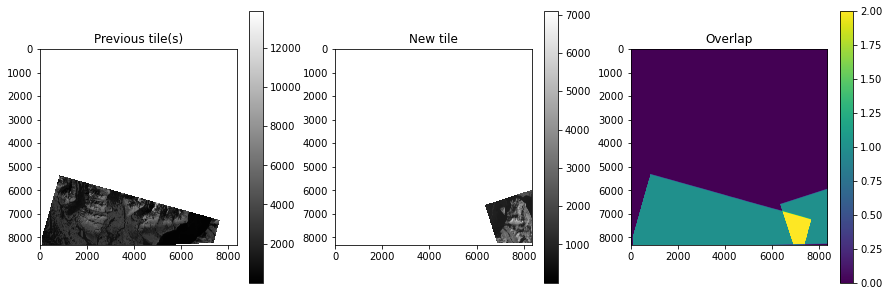

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: -232.46227982325982
New mean diff: 0.0
Larger tile mean value: 2246.885430097769
Normalized mean value for smaller tile: 1207.2183420451868




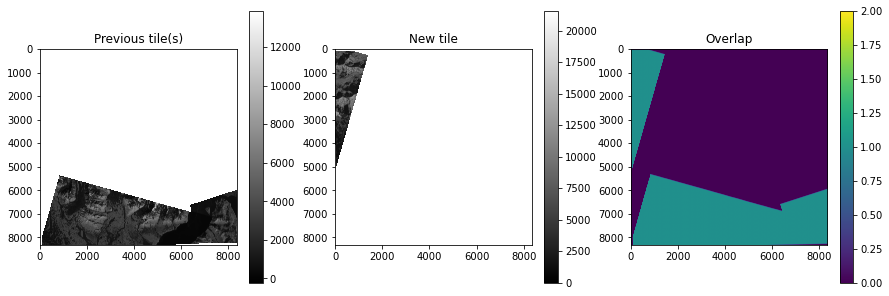

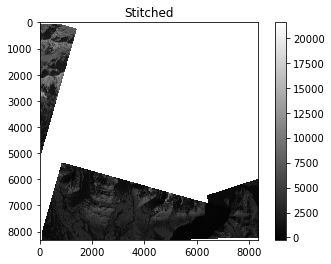

TILES FOR 20200906
['/Volumes/SGlacier/Turner20_21/09_20/out/stitched_by_sat/PS_20200906_0f49.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/stitched_by_sat/PS_20200906_100d.tif']


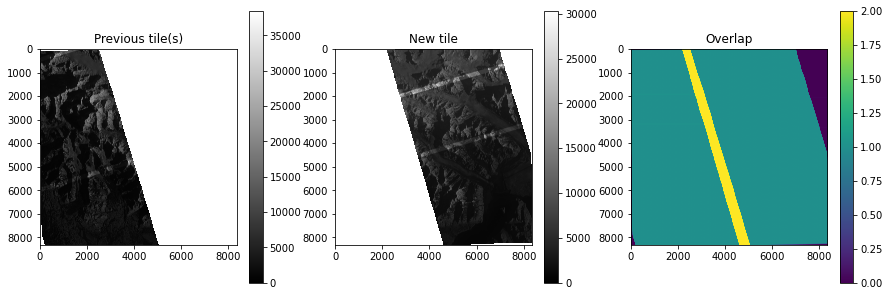

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: 58.67304411089529
New mean diff: 86.81405958035035
Larger tile mean value: 3529.448307486478
Normalized mean value for smaller tile: 3844.842832236087




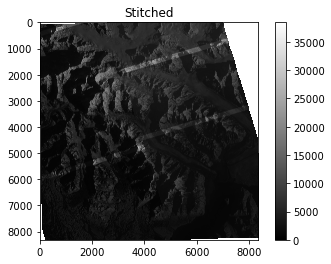

TILES FOR 20200910
['/Volumes/SGlacier/Turner20_21/09_20/out/stitched_by_sat/PS_20200910_106c.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/stitched_by_sat/PS_20200910_1049.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/stitched_by_sat/PS_20200910_2263.tif']


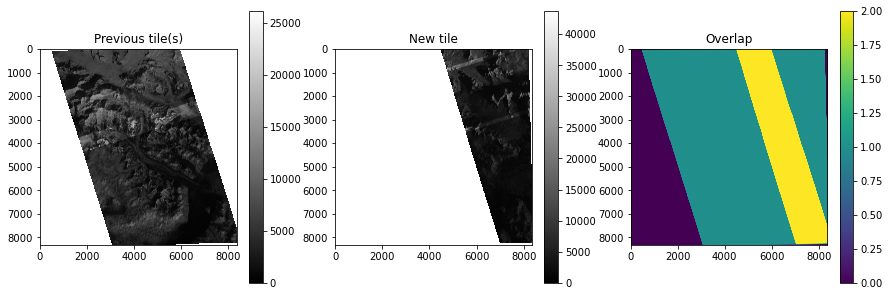

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: -112.83645897027911
New mean diff: -19.18026079586242
Larger tile mean value: 4276.514481914113
Normalized mean value for smaller tile: 1673.7790633893487




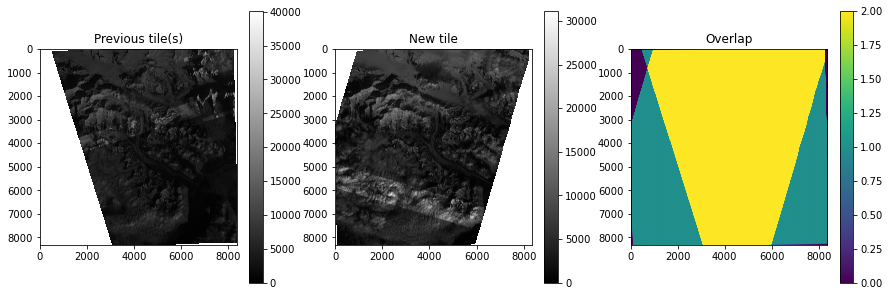

Current tile is larger.
Mean difference in values from the larger tile in overlap area: 408.4015684420022
New mean diff: -57.766738723297195
Larger tile mean value: 5018.791735412647
Normalized mean value for smaller tile: 375.0486192704563




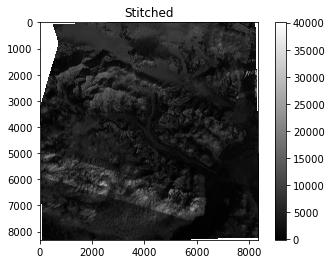

TILES FOR 20200911
['/Volumes/SGlacier/Turner20_21/09_20/out/stitched_by_sat/PS_20200911_100d.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/stitched_by_sat/PS_20200911_2212.tif']


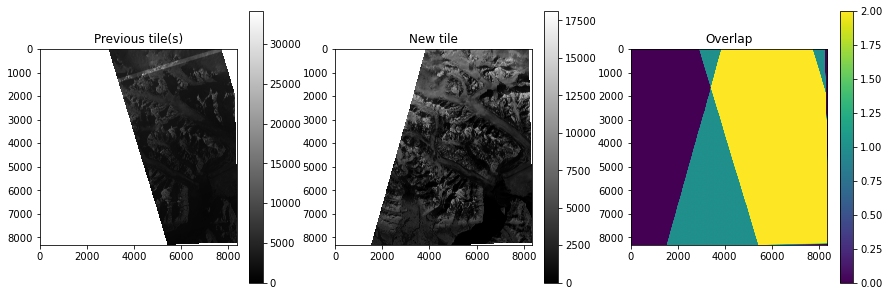

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: 455.0846844526833
New mean diff: 49.398816863732165
Larger tile mean value: 3585.731903255311
Normalized mean value for smaller tile: 756.1095067203958




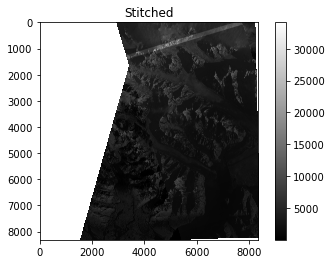

TILES FOR 20200912
['/Volumes/SGlacier/Turner20_21/09_20/out/stitched_by_sat/PS_20200912_1008.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/stitched_by_sat/PS_20200912_2206.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/stitched_by_sat/PS_20200912_0f46.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/stitched_by_sat/PS_20200912_1065.tif']


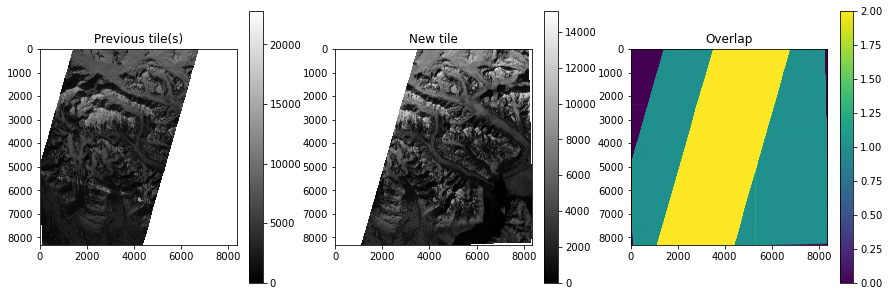

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: 501.35473617344076
New mean diff: 90.4011083240481
Larger tile mean value: 4181.543878580278
Normalized mean value for smaller tile: 1196.8132987337358




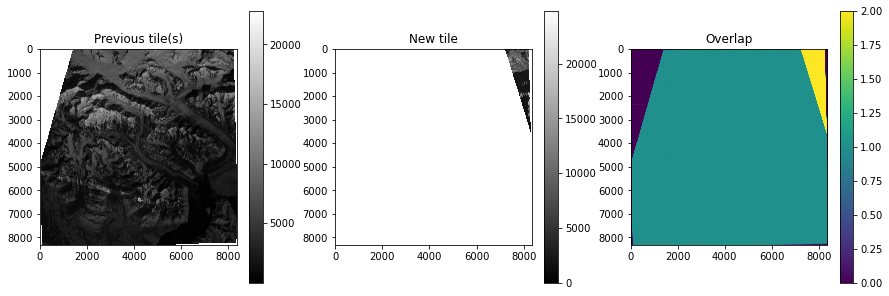

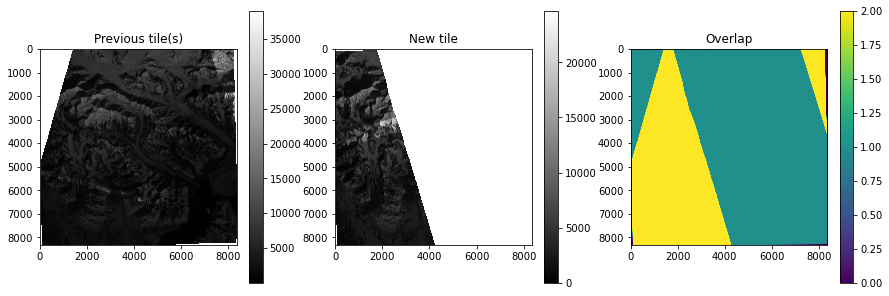

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: 196.94668287881652
New mean diff: -29.506697649816886
Larger tile mean value: 3807.949177587999
Normalized mean value for smaller tile: 468.0473645920042




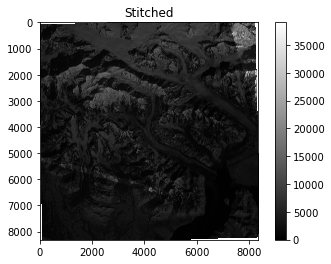

TILES FOR 20200913
['/Volumes/SGlacier/Turner20_21/09_20/out/stitched_by_sat/PS_20200913_2304.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/stitched_by_sat/PS_20200913_0f22.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/stitched_by_sat/PS_20200913_1050.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/stitched_by_sat/PS_20200913_1058.tif']


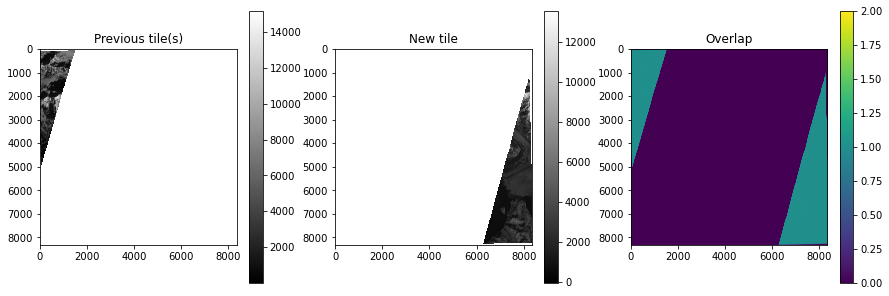

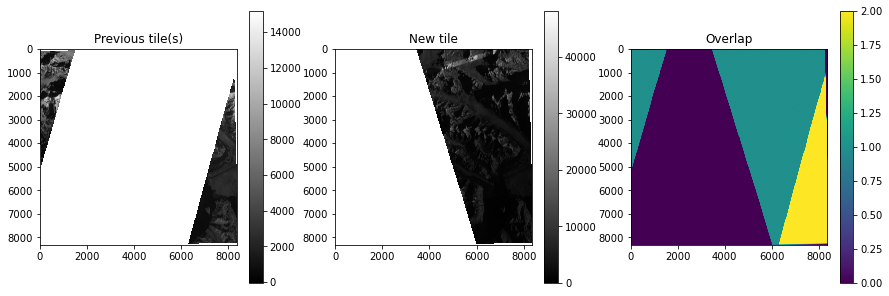

Current tile is larger.
Mean difference in values from the larger tile in overlap area: -302.6165373949542
New mean diff: 0.0
Larger tile mean value: 3713.526723440015
Normalized mean value for smaller tile: 1126.732690685186




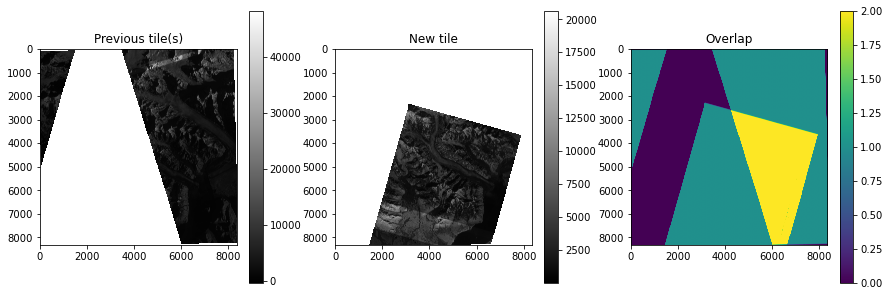

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: 373.668850690372
New mean diff: -17.693125947825628
Larger tile mean value: 3676.3635163193503
Normalized mean value for smaller tile: 2020.325725843451




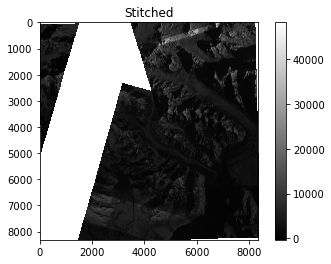

TILES FOR 20200914
['/Volumes/SGlacier/Turner20_21/09_20/out/stitched_by_sat/PS_20200914_1054.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/stitched_by_sat/PS_20200914_1025.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/stitched_by_sat/PS_20200914_0f3c.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/stitched_by_sat/PS_20200914_1005.tif']


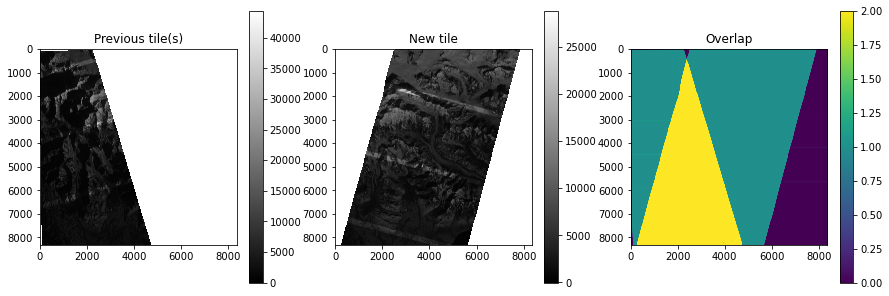

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: 20.632929441519817
New mean diff: 258.63442017226373
Larger tile mean value: 3421.2388225131326
Normalized mean value for smaller tile: 2802.7175185982564




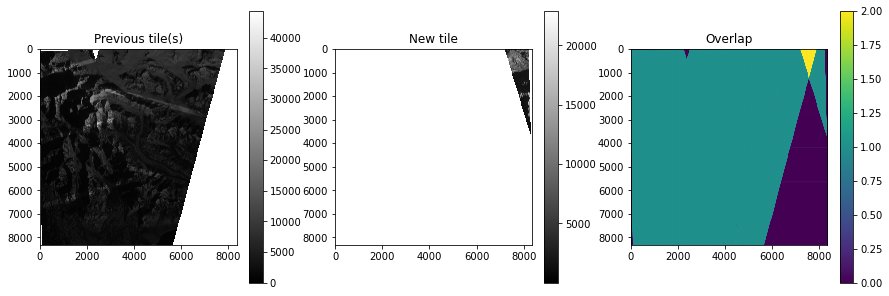

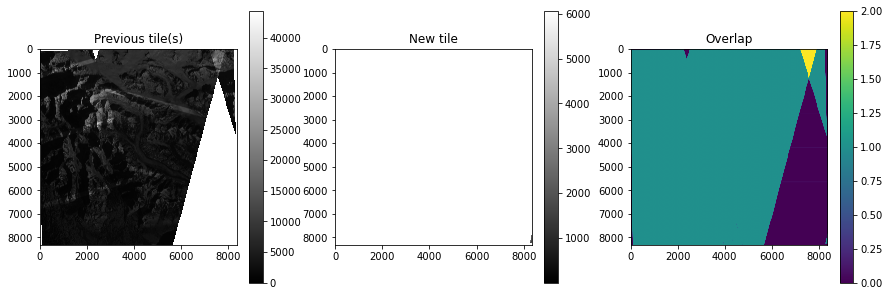

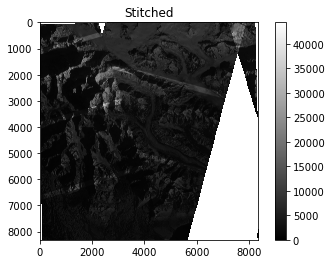

TILES FOR 20200915
['/Volumes/SGlacier/Turner20_21/09_20/out/stitched_by_sat/PS_20200915_2263.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/stitched_by_sat/PS_20200915_1048.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/stitched_by_sat/PS_20200915_1049.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/stitched_by_sat/PS_20200915_1061.tif']


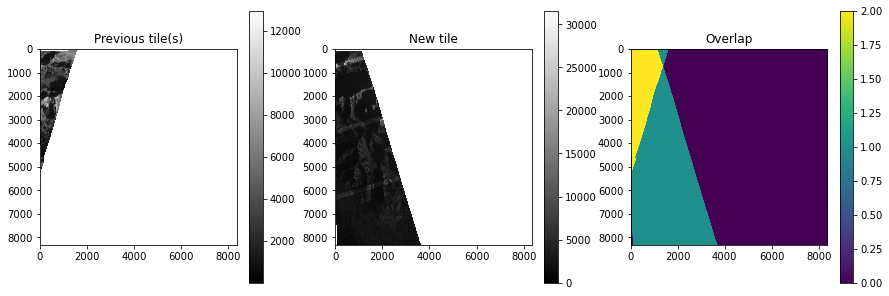

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: -592.2417091827365
New mean diff: 0.0
Larger tile mean value: 3132.957672713831
Normalized mean value for smaller tile: 1735.8860226071388




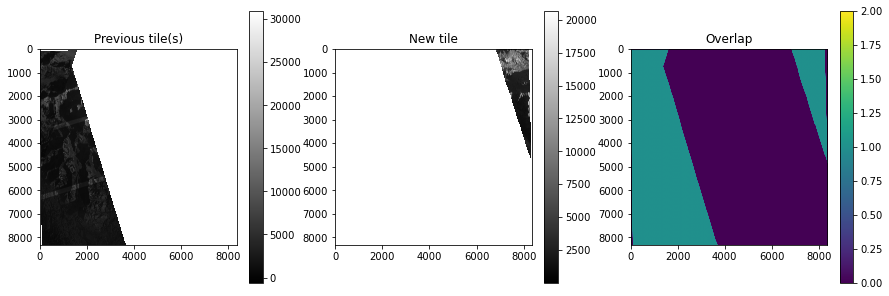

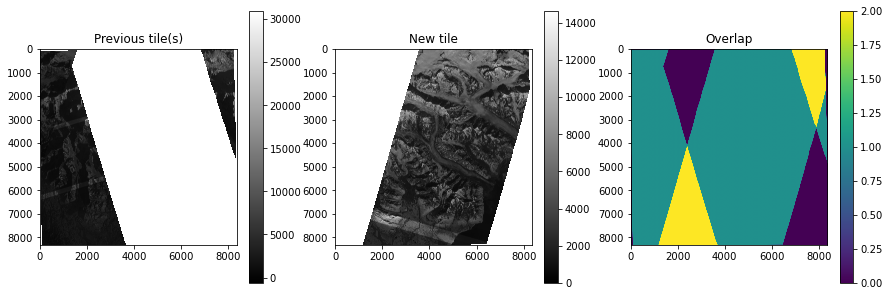

Current tile is larger.
Mean difference in values from the larger tile in overlap area: 428.41955512721
New mean diff: 0.0
Larger tile mean value: 3327.076126068417
Normalized mean value for smaller tile: 1865.9119042620953




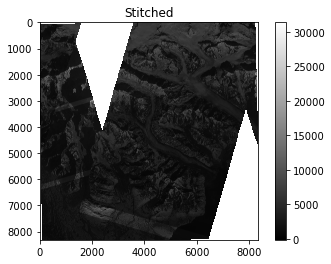

TILES FOR 20200916
['/Volumes/SGlacier/Turner20_21/09_20/out/stitched_by_sat/PS_20200916_100d.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/stitched_by_sat/PS_20200916_106e.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/stitched_by_sat/PS_20200916_2231.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/stitched_by_sat/PS_20200916_0f21.tif']


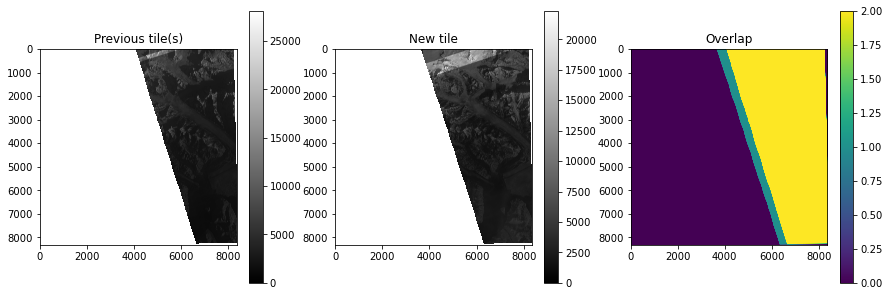

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: -203.67257339110603
New mean diff: 5.710670492245718
Larger tile mean value: 3504.6590177281464
Normalized mean value for smaller tile: 394.2273763214679




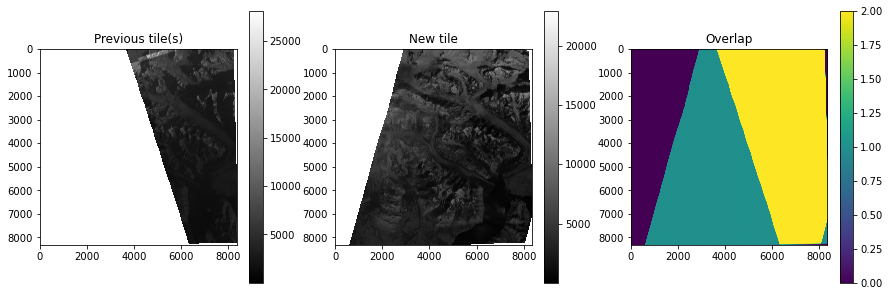

Current tile is larger.
Mean difference in values from the larger tile in overlap area: -101.19546045548414
New mean diff: -2.965502536825749
Larger tile mean value: 3488.3427154458036
Normalized mean value for smaller tile: 16.42179531741952




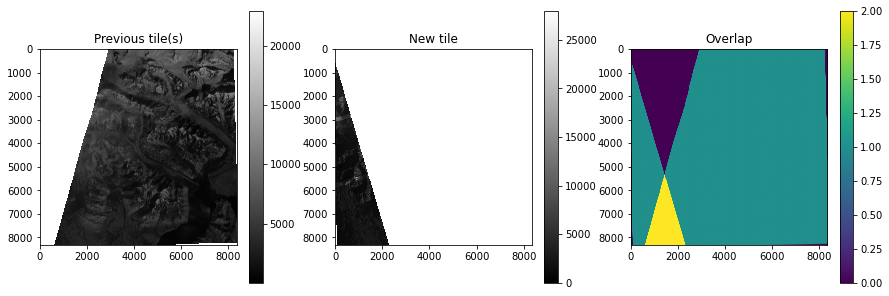

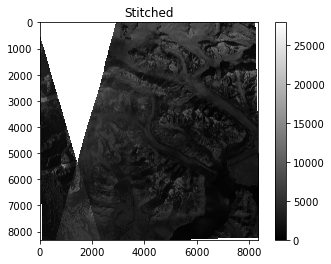

TILES FOR 20200918
['/Volumes/SGlacier/Turner20_21/09_20/out/stitched_by_sat/PS_20200918_2412.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/stitched_by_sat/PS_20200918_1066.tif']


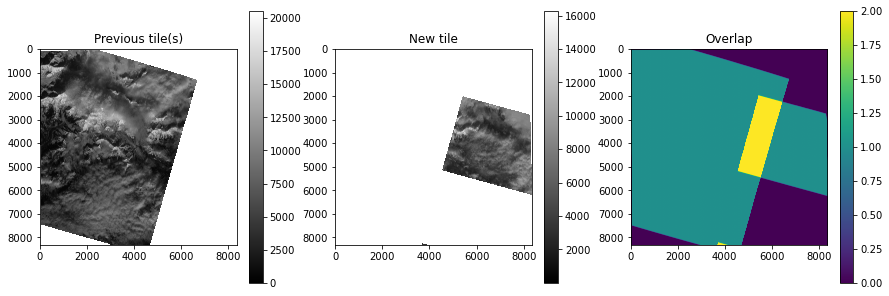

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: -397.33885869655074
New mean diff: -163.3142897641898
Larger tile mean value: 5968.835056847489
Normalized mean value for smaller tile: 3790.376636154269




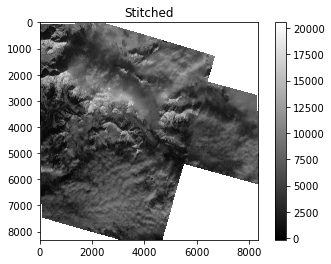

TILES FOR 20200919
['/Volumes/SGlacier/Turner20_21/09_20/out/stitched_by_sat/PS_20200919_1040.tif']


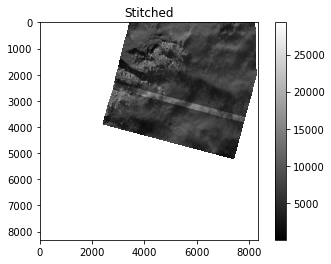

TILES FOR 20200920
['/Volumes/SGlacier/Turner20_21/09_20/out/stitched_by_sat/PS_20200920_104b.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/stitched_by_sat/PS_20200920_1058.tif']


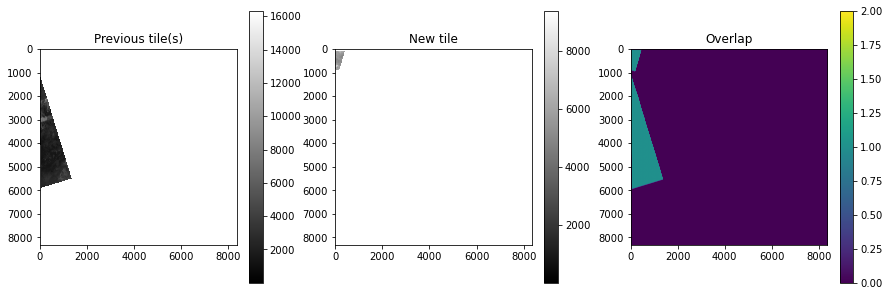

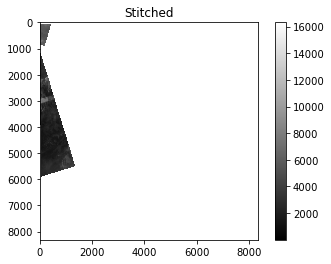

TILES FOR 20200924
['/Volumes/SGlacier/Turner20_21/09_20/out/stitched_by_sat/PS_20200924_1014.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/stitched_by_sat/PS_20200924_0f44.tif']


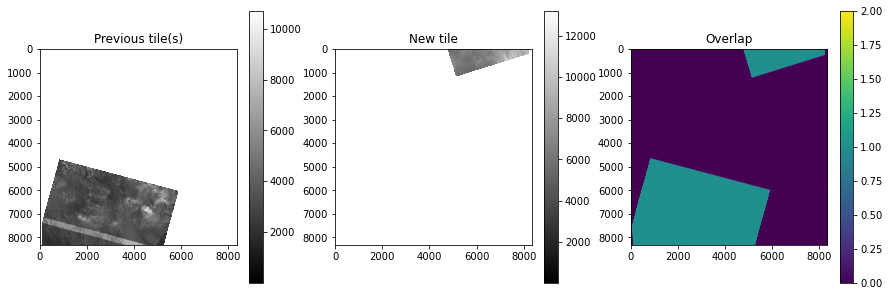

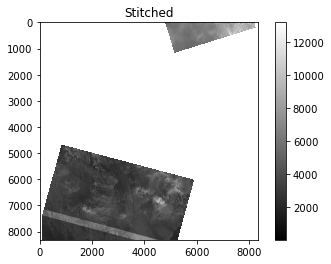

TILES FOR 20200925
['/Volumes/SGlacier/Turner20_21/09_20/out/stitched_by_sat/PS_20200925_106b.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/stitched_by_sat/PS_20200925_2278.tif', '/Volumes/SGlacier/Turner20_21/09_20/out/stitched_by_sat/PS_20200925_104a.tif']


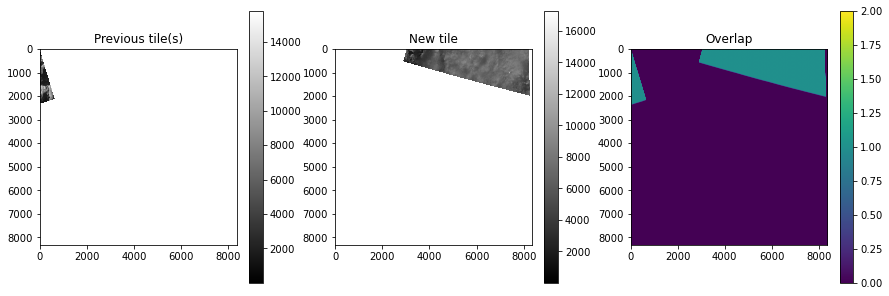

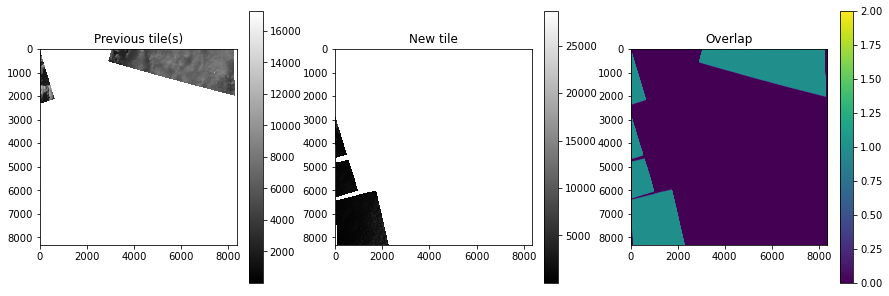

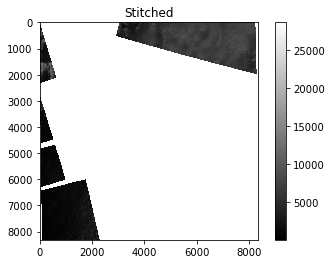

TILES FOR 20200929
['/Volumes/SGlacier/Turner20_21/09_20/out/stitched_by_sat/PS_20200929_2304.tif']


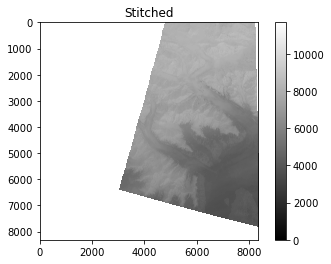

In [90]:
for date in unique_dates:  
    print('TILES FOR', date)
    tiles = glob.glob(basepath+'stitched_by_sat/PS_'+date+'*.tif') # grab all file paths for that date
    print(tiles)
    
    # initialize empty arrays
    overlap_total = np.zeros(reftile.shape);
    sr_stitched = np.zeros(reftile.shape) # start with empty stitched product
    t = 0 # tile count
    
    for tile in tiles:
        reader = rio.open(tile); sr = reader.read(1) # load the tile
        sr[sr == 0] = np.NaN # remove black background, replace with Nans
        sr_data = sr.copy() # make a copy of the data before making the data binary
        sr[sr>0.0] = 1 ; sr[np.isnan(sr)] = 0 # make tile binary
        
        tilesize = np.count_nonzero(sr) # grab the current tile size (pixels)
        overlap_total = overlap_total+sr # add new overlap to overlap total
        
        if t == 0: # for the first tile
            sr_stitched = sr_stitched+sr_data # add the data to sr_stitched
            overlap_area = 0 # no overlap area for the first tile
        
        else: # for all subsequent tiles, do iterative normalization based on overlapping area, if any
            overlap_area = np.count_nonzero(overlap_total[overlap_total >= 2]) # update total overlap area
            
            # Plot the tile comparison and overlap
            fig, (ax1,ax2,ax3) = plt.subplots(1,3,figsize=(15,5))
            im1 = ax1.imshow(sr_stitched,cmap='gray'); ax1.set_title('Previous tile(s)'); fig.colorbar(im1,ax=ax1)
            im2 = ax2.imshow(sr_data,cmap='gray'); ax2.set_title('New tile'); fig.colorbar(im2, ax=ax2)
            im3 = ax3.imshow(overlap_total,vmin=0,vmax=2); ax3.set_title('Overlap'); fig.colorbar(im3,ax=ax3)
            plt.show()
            
            # if the total overlap area has increased (i.e., new overlap)
            if overlap_area > prev_overlap: # increase in overlapping area indicates we have 2 overlapping tiles!!!
                overlap_band = ma.masked_not_equal(overlap_total, 2) # identify non-overlapping area (not 2)
                overlap_band_mask = ma.getmaskarray(overlap_band) # grab the mask for the overlapping area
                
                # identify which tile is larger
                if tilesize > prev_tilesize:
                    print('Current tile is larger.')
                    larger_tile = sr_data; smaller_tile = sr_stitched # assign the tiles
                elif tilesize < prev_tilesize:
                    print('Previous tile is larger.')
                    larger_tile = sr_stitched; smaller_tile = sr_data # assign the tiles
                else: # equal sizes
                    print('Tiles are the same size.')
                    larger_tile = sr_data; smaller_tile = sr_stitched # use current tile to coregister
                
                # grab mean pixel difference from overlapping area (ON GLACIER)
                overlap_values_l = ma.masked_where(overlap_band_mask, larger_tile)
                overlap_values_larger = ~overlap_values_l.mask*overlap_values_l.data
                overlap_values_s = ma.masked_where(overlap_band_mask, smaller_tile)
                overlap_values_smaller = ~overlap_values_s.mask*overlap_values_s.data
                mean_diff = np.nanmean(np.subtract(overlap_values_larger,overlap_values_smaller)) # mean diff
                print('Mean difference in values from the larger tile in overlap area:',mean_diff)
                
                # mean difference in overlapping area over glacier
                overlap_glacier_l = ma.masked_where(glacier_ice_mask, overlap_values_larger)
                overlap_glacier_larger = overlap_glacier_l.mask*overlap_glacier_l.data
                overlap_glacier_s = ma.masked_where(glacier_ice_mask, overlap_values_smaller)
                overlap_glacier_smaller = overlap_glacier_s.mask*overlap_glacier_s.data
                mean_diff2 = np.nanmean(np.subtract(overlap_glacier_larger,overlap_glacier_smaller))
                print('New mean diff:', mean_diff2)
                
                if mean_diff2 != 0: # if there is glacier overlap, only shift with glacier difference
                    
                    # normalize the smaller tile's values to the larger reference tile's overlap values
                    smaller_tile_coreg = smaller_tile + mean_diff2 # add the mean difference to all values
                    smaller_tile_coreg = ma.masked_where(~overlap_band_mask, smaller_tile_coreg) 

                    # remove overlap area from smaller tile:
                    masked_smaller_tile_coreg = ~smaller_tile_coreg.mask*smaller_tile_coreg.data
                    
                else: # If not, shift with overlapping difference
                    smaller_tile_coreg = smaller_tile + mean_diff # add the mean difference to all values
                    smaller_tile_coreg = ma.masked_where(~overlap_band_mask, smaller_tile_coreg) 

                    # remove overlap area from smaller tile:
                    masked_smaller_tile_coreg = ~smaller_tile_coreg.mask*smaller_tile_coreg.data
    
                print('Larger tile mean value:',np.nanmean(larger_tile))
                print('Normalized mean value for smaller tile:',np.nanmean(masked_smaller_tile_coreg))
                print(); print();
                  
                # add them to the stitched produdct
                sr_stitched = np.nansum([masked_smaller_tile_coreg, larger_tile],0) 
                overlap_total[overlap_total > 0] = 1 # refresh overlap total
            else: # if no overlap, just add them without doing anything
                sr_stitched = np.nansum([sr_data, sr_stitched],0) # add them to the stitched product

        # Store tile info for the next round of comparison
        prev_overlap = overlap_area # amount of pixels overlapping
        prev_tilesize = np.count_nonzero(sr_stitched) # previous tile size (pixels w/ data)
        sr_prev = sr_data
        sr_stitched[sr_stitched == 0]=np.NaN # fill black pixels with NaNs
        t += 1 # increment tile count
        
    # Plot final stitched image
    fig = plt.figure(); im = plt.imshow(sr_stitched, cmap='gray'); plt.title('Stitched'); 
    fig.colorbar(im); plt.show()

    # Export stitched image
    outfilename = 'PS_'+date+'.tif'
    if not os.path.exists(basepath+"stitched_images/"):
        os.mkdir(basepath+"stitched_images/")
    with rio.open(basepath+"stitched_images/"+outfilename,'w',
                        driver='GTiff',
                        height=sr_stitched.shape[0], # new shape
                        width=sr_stitched.shape[1], # new shape
                        dtype=sr_stitched.dtype, # data type
                        count=1,
                        crs=reftile.crs, # the EPSG from the original DEM
                        transform=reftile.transform) as dst:
            dst.write(sr_stitched, 1)
    #break
    del overlap_total; del sr_stitched # clear variables
    

# Remove those images that cover less than 50% of the glacier and crop images to the bounding box

In [87]:
# Read glacier shapefile
with fiona.open('/Volumes/SGlacier/BoxTurner/BoxTurner_UTM_07.shp', "r") as shapefile:
    shapes = [feature["geometry"] for feature in shapefile]

In [89]:
stitchedpath = basepath+'stitched_images/' # path to the stitched images
boxpath = '/Volumes/SGlacier/BoxTurner/BoxTurner_UTM_07.shp' # path to bounding box shapefile

# multiply each image by glacier mask
for file in os.listdir(stitchedpath):
    if file.startswith('PS') and not file.endswith('clipped.tif'):
        print(file)
        
        # read image file and crop to glacier outline
        with rio.open(stitchedpath+file) as src:
            out_image, out_transform = mask(src, shapes, crop=True)

        # calculate number of non-empty pixels over the glacier
        total_pixels = np.count_nonzero(out_image[0])
        out_image[np.isnan(out_image)] = 0 # set all Nans to 0
        pixels_w_data = np.count_nonzero(out_image) # count non nans (number of pixels with data)
        
        # print data percent
        data_percent = int(pixels_w_data/total_pixels*100)
        print(data_percent, '%')
        
        # if data percent > 50, and clipped version doesn't already exist:
        if data_percent >= 50 and not file[:-4]+'_clipped.tif' in os.listdir(stitchedpath):
            # Crop file
            crop_cmd = 'gdalwarp -cutline '+boxpath+' -crop_to_cutline '
            crop_cmd += stitchedpath+file+' '+stitchedpath+file[:-4]+'_clipped.tif'
            print(crop_cmd); print()

            subprocess.run(crop_cmd,shell=True,check=True); print()
        else:
            print('Uncomment line 33 to remove', file)
#             # remove the file
#             os.remove(stitched_path+file)
            
    

PS_20200920.tif
0 %
Uncomment line 33 to remove PS_20200920.tif
PS_20200918.tif
85 %
gdalwarp -cutline /Volumes/SGlacier/BoxTurner/BoxTurner_UTM_07.shp -crop_to_cutline /Volumes/SGlacier/Turner20_21/09_20/out/stitched_images/PS_20200918.tif /Volumes/SGlacier/Turner20_21/09_20/out/stitched_images/PS_20200918_clipped.tif

Creating output file that is 8357P x 8315L.
Processing /Volumes/SGlacier/Turner20_21/09_20/out/stitched_images/PS_20200918.tif [1/1] : 0...10...20...30...40...50...60...70...80...90...100 - done.

PS_20200924.tif
12 %
Uncomment line 33 to remove PS_20200924.tif
PS_20200925.tif
0 %
Uncomment line 33 to remove PS_20200925.tif
PS_20200919.tif
34 %
Uncomment line 33 to remove PS_20200919.tif
PS_20200916.tif
84 %
gdalwarp -cutline /Volumes/SGlacier/BoxTurner/BoxTurner_UTM_07.shp -crop_to_cutline /Volumes/SGlacier/Turner20_21/09_20/out/stitched_images/PS_20200916.tif /Volumes/SGlacier/Turner20_21/09_20/out/stitched_images/PS_20200916_clipped.tif

Creating output file that is 